# comparing_model5 — Borzoi fold3, GM12878 CAGE, strand-separate

The Borzoi counterpart to `comparing_model4` §14–§18, plus §19a's semi-partial residual metric,
and the parts of §3–§7 that carry over: the element-wise comparison against the baseline (§3),
accuracy against how generic the region is (§8), and example tracks (§9).
`comparing_model4` §19b argued Borzoi is the better witness for the "models predict the
cross-cell-type average" claim: 32 bp resolution instead of 128 bp, a genuinely held-out fold,
and a current-generation architecture. This notebook makes that measurement.

Seven arms, all scored against the same observed GM12878 CAGE on the 6888 fold3 regions:

| key | model | init | trained params | note |
|---|---|---|---|---|
| `borzoi_pre` | Borzoi, pretrained | — | — | sequence only, no TTA |
| `borzoi_lora` | Borzoi LoRA v2 | pretrained | 333,443 (0.19%) | `train_out/gm12878_lora_v2` |
| `borzoi_trunk` | Borzoi full finetune | pretrained trunk | all 171.6M | `train_out/gm12878_trunk` |
| `borzoi_scratch` | Borzoi from scratch | random | all 171.6M | `train_out/gm12878_scratch` |
| `cad_ep4` | Caduceus ep4 | — | — | +DNase |
| `cad_ep10` | Caduceus ep10 | — | — | +DNase |
| `alphagenome` | AlphaGenome | — | — | sequence only, external model |

**Why this arm set matters.** `comparing_model4` §18 point 4 named pretrained-vs-from-scratch
"the single biggest confound" of the Enformer comparison and said it had to be closed before the
work could be written up. `borzoi_trunk` and `borzoi_scratch` are that control: identical data,
identical architecture, identical target, identical eval — differing only in initialisation.
`borzoi_lora` adds a third point on the same axis (pretrained, but only 0.19% of parameters move).

**AlphaGenome is on its own value scale, and that is not cosmetic.** The other six arms all
predict in Borzoi's squashed count space, because that is the space they were trained in.
AlphaGenome was trained with its own normalisation: its total signal is ~5.2x the target's and its
tail runs to ~20,000 against the target's ~160. A global factor is harmless — Pearson is
scale-invariant, and §6/§7 fit and apply one anyway — but the *squashing* is a nonlinearity, and
correlating unsquashed counts against a squashed target costs AlphaGenome real correlation for a
reason that is a unit convention rather than a modelling failure. `comparing_model4` §17/§18 is the
record of that trap being fallen into and then diagnosed. Every AlphaGenome number below should be
read as a lower bound, and the arm is not a like-for-like architecture comparison against the
Borzoi arms. §1 gate 6 checks its channel and row alignment; §6 quantifies the scale directly.

**AlphaGenome is absent from §5 only.** The identifiability cache
(`borzoi_fold3_CAGE_ident.npz`) holds `R(pred, TRUE_ct)` against all 638 cell types for the six
arms that existed when it was built; scoring a seventh needs another 108 GB pass over
`borzoi_fold3_CAGE.zarr`. §5 therefore runs on its six cached arms and says so, and §10's three
identifiability columns are `NaN` for AlphaGenome. Every other section — §1.5, §2, §3, §4, §6, §7,
§8, §9, §12, §12b — scores all seven.

**Strands are separate samples.** Borzoi CAGE is stranded (track 870 = `+`, 871 = `−`). Every
metric here is computed per region *and* per strand, giving 6888 × 2 = 13,776 samples per arm.
Nothing sums or averages the two strands together. Where a single number is quoted it is pooled
over both; a per-strand breakdown is printed alongside so the pooling can be checked.

**DNase is dropped.** The three finetuned Borzoi arms carry `DNASE:GM12878` in channel 2 and the
loader never reads it. No section below uses DNase.

**Bin width.** 32 bp, not Enformer's 128 bp. Every constant inherited from `comparing_model4` is
therefore recomputed rather than reused — see §1. The smoothing width is the one exception that
can be set analytically: σ = 1.5 × 128/32 = **6.0** covers the same genomic distance.

**Cost.** ~7 GB resident at peak for the original six arms, reached in §8 where the residual arrays
are held alongside every arm; the seventh adds ~0.3 GB of predictions and its derived copies. A few minutes end to end. The two 108 GB passes over
`borzoi_fold3_CAGE.zarr` are already done and cached by `evals/borzoi_cage_avg.py` and
`evals/borzoi_cage_ident.py`; nothing in this notebook re-reads that store.

## 1. Load, and the target gate

Self-contained: every name used below is bound in this cell, so the notebook runs top-to-bottom on
a cold kernel. `comparing_model4` §14 flagged that its own §1/§3 guarded loads behind
`if ... not in globals()`, which made re-running sections after §8a either raise or silently reuse
stale results. Nothing here is guarded.

The gate is the part that matters. Six checks, each of which stops the notebook:

1. **The targets are the same array everywhere.** `GM12878CAGE.zarr/fold3` must be bit-identical
   to the Caduceus runs' saved `*_targets.npy`, and ep4's targets must equal ep10's.
2. **Three arms reproduce published reference numbers.** `comparing_model4` §19d recorded mean
   per-region Pearson for `borzoi_pre`, `cad_ep4` and `cad_ep10`, recomputed from raw outputs and
   confirmed against the eval script's own scipy values to ~3e-8. Those three numbers are
   re-derived here and must match. This is a stronger gate than anything in `comparing_model4`
   §2/§8b, which could only check targets — here the *predictions* have external reference values.
3. **The stored per-region correlations agree.** The Caduceus eval wrote
   `borzoi_gm12878_cage_ep*_pearson.npy`; the vectorised implementation below must reproduce it
   region by region, not just on average.
4. **No arm is a copy of the target**, which would score ~1.0.
5. **No two arms are the same file loaded twice.**
6. **AlphaGenome's channel and row order are verified, not assumed.** It is the one arm not
   produced by this project's pipeline, so "channel 0 is the plus strand" and "row `i` is the
   `i`-th fold3 bed row" are external conventions. Its `+` channel must track the observed `+`
   strand better than the observed `−` strand, and a region-shuffled control must collapse to
   ~0 — so a transposed strand pair or a permuted region axis stops the notebook instead of
   quietly costing AlphaGenome ~0.1 correlation and being read as a model result.

The blacklist is also computed here rather than assumed. Borzoi's folds are **not**
chromosome-disjoint — fold3 shares 17 chromosomes with the training folds — so `comparing_model4`
§18 point 5's concern is live and has to be checked, not waved through.

In [1]:
# §1 - self-contained load, blacklist, and the target gate.
import json
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import zarr
from scipy.ndimage import gaussian_filter1d
from scipy.stats import spearmanr, wilcoxon

BORZOI = '/data1/lesliec/sarthak/data/borzoi'
MO = f'{BORZOI}/model_outputs'
JP = '/data1/lesliec/sarthak/data/joint_playground/model_out'
BED = '/data1/lesliec/sarthak/data/DK_zarr/sequences_borzoi_fold3-4.bed'
AVG_NPZ = f'{BORZOI}/borzoi_fold3_CAGE_avg.npz'
IDENT_NPZ = f'{BORZOI}/borzoi_fold3_CAGE_ident.npz'

N_REG, N_BIN, BIN_BP = 6888, 6144, 32
SEQ_LEN, TGT_SPAN = 524288, 196608     # borzoi input vs output span
SMOOTH_SIGMA = 6.0                     # 1.5 at 128 bp -> 6.0 at 32 bp
STRANDS = ('plus', 'minus')
GM_SLOT = 435                          # GM12878's position within a 638-wide strand block

# key, path, layout, pretty label, colour
ARMS = [
    ('borzoi_pre', f'{BORZOI}/model_outputs_fold3_gm12878CAGE.npy', 'hw2',
     'Borzoi (pretrained)', '#1f77b4'),
    ('borzoi_lora', f'{MO}/borzoi_finetuned_gm12878_lorav2.npy', 'hw3',
     'Borzoi LoRA v2', '#c6a9e0'),
    ('borzoi_trunk', f'{MO}/borzoi_finetuned_gm12878_trunk.npy', 'hw3',
     'Borzoi full FT (trunk)', '#7b52ab'),
    ('borzoi_scratch', f'{MO}/borzoi_finetuned_gm12878_scratch.npy', 'hw3',
     'Borzoi from scratch', '#3f007d'),
    ('cad_ep4', f'{JP}/borzoi_gm12878_cage_ep4_outputs.npy', 'h1w2',
     'Caduceus ep4', '#7fbf7f'),
    ('cad_ep10', f'{JP}/borzoi_gm12878_cage_ep10_outputs.npy', 'h1w2',
     'Caduceus ep10', '#1a7a3c'),
    # appended rather than slotted in, so the six original arms keep their panel order.
    # Same colour it wears in comparing_model4. Predicts in ITS OWN units, not borzoi
    # squashed counts -- see gate 6 below and §6.
    ('alphagenome', f'{JP}/alphagenome_cage_gm12878_borzoi_fold3_32bp.npy', 'hw2',
     'AlphaGenome', '#ff7f0e'),
]
AG_KEY = 'alphagenome'
KEYS = [a[0] for a in ARMS]
PRETTY = {a[0]: a[3] for a in ARMS}
COLORS = {a[0]: a[4] for a in ARMS}


def rowwise_pearson(A, B):
    '''Pearson per row of two (N, T) arrays -> (N,). nan where a row is constant.'''
    Ac = A - A.mean(axis=1, keepdims=True)
    Bc = B - B.mean(axis=1, keepdims=True)
    with np.errstate(divide='ignore', invalid='ignore'):
        r = (Ac * Bc).sum(axis=1) / np.sqrt((Ac * Ac).sum(axis=1) * (Bc * Bc).sum(axis=1))
    r = np.asarray(r, dtype=np.float32)
    r[~np.isfinite(r)] = np.nan
    return r


def smooth_log(A, sigma=SMOOTH_SIGMA):
    '''log1p then gaussian smooth along the bin axis. Order matters; see §7.'''
    return gaussian_filter1d(np.log1p(np.clip(A, 0, None)), sigma=sigma, axis=1, truncate=4.0)


def smoothed_log_pearson(A, B, sigma=SMOOTH_SIGMA):
    return rowwise_pearson(smooth_log(A, sigma), smooth_log(B, sigma))


def pool(d):
    '''Stack the two strands into one sample axis: {plus,minus} of (N,) -> (2N,).'''
    return np.concatenate([d['plus'], d['minus']])


# --- observed target ---------------------------------------------------------------
_g = zarr.open(f'{BORZOI}/GM12878CAGE.zarr', mode='r')['fold3']
assert _g.shape == (N_REG, N_BIN, 2), f'unexpected target shape {_g.shape}'
_gt = np.asarray(_g[:], dtype=np.float32)
TRUE = {'plus': np.ascontiguousarray(_gt[:, :, 0]), 'minus': np.ascontiguousarray(_gt[:, :, 1])}
del _gt
print(f"target {N_REG} x {N_BIN} x 2  mean + {TRUE['plus'].mean():.6f}  - {TRUE['minus'].mean():.6f}")

# --- cross-cell-type averages (precomputed by evals/borzoi_cage_avg.py) -------------
assert os.path.exists(AVG_NPZ), f'missing {AVG_NPZ} -- run: sbatch evals/borzoi_cage_avg.sh'
_a = np.load(AVG_NPZ)
AVG = {s: _a[f'avg_{s}'] for s in STRANDS}
AVG_LOO = {s: _a[f'avg_{s}_loo'] for s in STRANDS}
R_CT_TRUE = {s: _a[f'r_ct_{s}'] for s in STRANDS}        # raw, target vs each cell type
RSM_CT_TRUE = {s: _a[f'rsm_ct_{s}'] for s in STRANDS}    # smoothed-log, same
COLS = {s: _a[f'cols_{s}'] for s in STRANDS}
AVG_META = json.loads(str(_a['meta']))
N_CT = AVG_META['n_cell_types']
assert AVG_META['smooth_sigma'] == SMOOTH_SIGMA, 'the cached sigma differs from this notebook'
assert AVG_META['gm_slot'] == GM_SLOT
assert COLS['plus'][GM_SLOT] == 870 and COLS['minus'][GM_SLOT] == 871
print(f"AVG over {N_CT} cell types; leave-GM12878-out companion present")

# --- predictions -------------------------------------------------------------------
def load_arm(path, layout):
    '''-> {'plus','minus'} of (N_REG, N_BIN) float32. Channel 2 (DNase) is never read.'''
    a = np.load(path, mmap_mode='r')
    if layout == 'h1w2':          # caduceus writes (N, 1, T, 2)
        a = a[:, 0]
    return {'plus': np.ascontiguousarray(a[:, :, 0], dtype=np.float32),
            'minus': np.ascontiguousarray(a[:, :, 1], dtype=np.float32)}


missing = [p for _, p, _, _, _ in ARMS if not os.path.exists(p)]
assert not missing, 'prediction files not on disk:\n  ' + '\n  '.join(missing)
preds = {}
for key, path, layout, label, _ in ARMS:
    preds[key] = load_arm(path, layout)
    shp = np.load(path, mmap_mode='r').shape
    print(f'  {label:<24} {str(shp):<22} -> 2 x ({N_REG}, {N_BIN})'
          + ('   [DNase ch2 dropped]' if layout == 'hw3' else ''))

# --- blacklist: fold3 input context reaching into a training window's target span ----
bed = pd.read_csv(BED, sep='\t', header=None,
                  names=['chrom', 'start', 'end', 'split', 'fold', 'idx'])
assert (bed.end - bed.start).nunique() == 1 and (bed.end - bed.start).iloc[0] == TGT_SPAN
test_bed = bed[bed.fold == 'fold3'].reset_index(drop=True)
assert len(test_bed) == N_REG, f'{len(test_bed)} fold3 rows, expected {N_REG}'
train_bed = bed[~bed.fold.isin(['fold3', 'fold4'])]
PAD = (SEQ_LEN - TGT_SPAN) // 2
shared = sorted(set(test_bed.chrom) & set(train_bed.chrom))
print(f'\nfold3 shares {len(shared)} chromosomes with the training folds -- folds are NOT '
      f'chromosome-disjoint, so the overlap has to be measured')

blacklisted = np.zeros(N_REG, dtype=bool)
label_overlap = np.zeros(N_REG, dtype=bool)
for chrom, g in train_bed.groupby('chrom'):
    ts, te = g.start.to_numpy(), g.end.to_numpy()
    sel = np.flatnonzero((test_bed.chrom == chrom).to_numpy())
    for i in sel:
        c, d = int(test_bed.start[i]), int(test_bed.end[i])
        ov_ctx = np.maximum(0, np.minimum(te, d + PAD) - np.maximum(ts, c - PAD))
        if ov_ctx.max() > 0.20 * TGT_SPAN:
            blacklisted[i] = True
        if (np.maximum(0, np.minimum(te, d) - np.maximum(ts, c))).max() > 0:
            label_overlap[i] = True
allowed = ~blacklisted
assert label_overlap.sum() == 0, (
    f'GATE FAILED: {label_overlap.sum()} fold3 TARGET spans overlap a training target span -- '
    f'that is label leakage, not context leakage')
print(f'  fold3 target spans overlapping a train target span: 0 / {N_REG}  (no label leakage)')
print(f'  input context (+/-{PAD:,} bp) reaching >20% into a train target span: '
      f'{blacklisted.sum()} / {N_REG} ({blacklisted.mean():.1%}) -> {allowed.sum()} allowed')

# ============================ TARGET / PREDICTION GATE =============================
# 1. the targets are one array
for ep in (4, 10):
    tc = np.load(f'{JP}/borzoi_gm12878_cage_ep{ep}_targets.npy', mmap_mode='r')[:, 0]
    for si, s in enumerate(STRANDS):
        assert np.array_equal(np.asarray(tc[:, :, si], dtype=np.float32), TRUE[s]), (
            f'GATE FAILED: caduceus ep{ep} {s} targets differ from GM12878CAGE.zarr')
print('\ngate 1: caduceus ep4/ep10 targets are bit-identical to GM12878CAGE.zarr, both strands')

# 2. the three arms with published reference numbers must reproduce them.
#    comparing_model4 §19d, mean per-region raw Pearson over all 6888 regions.
REF_19D = {'borzoi_pre': (0.5956, 0.5816), 'cad_ep4': (0.5919, 0.5877),
           'cad_ep10': (0.6048, 0.6002)}
R_RAW = {k: {s: rowwise_pearson(preds[k][s], TRUE[s]) for s in STRANDS} for k in KEYS}
print(f"\ngate 2: reproducing comparing_model4 §19d\n{'arm':<24}{'ref +':>9}{'here +':>9}"
      f"{'ref -':>9}{'here -':>9}")
for k, (rp, rm) in REF_19D.items():
    hp, hm = float(np.nanmean(R_RAW[k]['plus'])), float(np.nanmean(R_RAW[k]['minus']))
    print(f'{PRETTY[k]:<24}{rp:>9.4f}{hp:>9.4f}{rm:>9.4f}{hm:>9.4f}')
    assert abs(hp - rp) < 5e-4 and abs(hm - rm) < 5e-4, (
        f'GATE FAILED: {k} does not reproduce §19d ({hp:.4f}/{hm:.4f} vs {rp}/{rm})')

# 3. per-region agreement with the eval script's own stored values
for ep, key in ((4, 'cad_ep4'), (10, 'cad_ep10')):
    stored = np.load(f'{JP}/borzoi_gm12878_cage_ep{ep}_pearson.npy')
    # the eval script keeps a length-1 axis at position 1, matching its outputs array
    stored = stored[:, 0] if stored.ndim == 3 else stored
    got = np.stack([R_RAW[key]['plus'], R_RAW[key]['minus']], axis=-1)
    assert stored.shape == got.shape, f'{key}: stored {stored.shape} vs computed {got.shape}'
    d = float(np.nanmax(np.abs(stored - got)))
    assert d < 1e-4, f'GATE FAILED: {key} per-region Pearson differs from the eval script ({d:.3g})'
    print(f'gate 3: {PRETTY[key]} matches the stored per-region Pearson, max|diff| {d:.3g}')

# 4/5. predictions are neither the target nor each other
for k in KEYS:
    for s in STRANDS:
        assert not np.array_equal(preds[k][s], TRUE[s]), f'GATE FAILED: {k} {s} IS the target'
for i, ka in enumerate(KEYS):
    for kb in KEYS[i + 1:]:
        assert not np.array_equal(preds[ka]['plus'], preds[kb]['plus']), (
            f'GATE FAILED: {ka} and {kb} have identical predictions')
print(f'gate 4/5: no arm equals the target; all {len(KEYS)} arms are distinct')

# 6. alphagenome is the one arm not produced by this project's pipeline, so its channel
#    order (+ first) and its row order (the fold3 bed order) are external conventions
#    rather than things this notebook controls. Both are checked: the + channel must
#    track the observed + strand better than the observed - strand, and a region-shuffled
#    control must collapse. A transposed strand pair or a permuted region axis fails here
#    rather than silently costing alphagenome ~0.1 correlation.
_sub = np.arange(0, N_REG, 17)
_own = float(np.nanmean(rowwise_pearson(preds[AG_KEY]['plus'][_sub], TRUE['plus'][_sub])))
_cross = float(np.nanmean(rowwise_pearson(preds[AG_KEY]['plus'][_sub], TRUE['minus'][_sub])))
_shuf = float(np.nanmean(rowwise_pearson(
    preds[AG_KEY]['plus'][np.random.default_rng(0).permutation(_sub)], TRUE['plus'][_sub])))
assert _own > 2 * abs(_cross) and _own > 10 * abs(_shuf), (
    f'GATE FAILED: alphagenome channel/row alignment -- own-strand {_own:.3f}, '
    f'cross-strand {_cross:.3f}, region-shuffled {_shuf:.3f}')
print(f'gate 6: alphagenome + channel vs observed +  {_own:+.3f}   vs observed -  {_cross:+.3f}'
      f'   region-shuffled  {_shuf:+.3f}   -> channel and row order confirmed')

# not a gate -- alphagenome is allowed to be on another scale, but the size of the
# mismatch belongs next to its numbers rather than buried in §6.
_agx = float(preds[AG_KEY]['plus'].sum() / TRUE['plus'].sum())
print(f'  alphagenome carries {_agx:.2f}x the target\'s total signal and is NOT in borzoi '
      f'squashed counts.\n  Pearson is scale-invariant so the factor itself is harmless; the '
      f'squashing nonlinearity is not.\n  Read its correlations as a lower bound (§6 quantifies '
      f'the scale, §11 the caveat).')

print('\nTARGET GATE PASSED.')

target 6888 x 6144 x 2  mean + 0.060034  - 0.058006


AVG over 638 cell types; leave-GM12878-out companion present


  Borzoi (pretrained)      (6888, 6144, 2)        -> 2 x (6888, 6144)


  Borzoi LoRA v2           (6888, 6144, 3)        -> 2 x (6888, 6144)   [DNase ch2 dropped]


  Borzoi full FT (trunk)   (6888, 6144, 3)        -> 2 x (6888, 6144)   [DNase ch2 dropped]


  Borzoi from scratch      (6888, 6144, 3)        -> 2 x (6888, 6144)   [DNase ch2 dropped]
  Caduceus ep4             (6888, 1, 6144, 2)     -> 2 x (6888, 6144)


  Caduceus ep10            (6888, 1, 6144, 2)     -> 2 x (6888, 6144)
  AlphaGenome              (6888, 6144, 2)        -> 2 x (6888, 6144)



fold3 shares 17 chromosomes with the training folds -- folds are NOT chromosome-disjoint, so the overlap has to be measured


  fold3 target spans overlapping a train target span: 0 / 6888  (no label leakage)
  input context (+/-163,840 bp) reaching >20% into a train target span: 91 / 6888 (1.3%) -> 6797 allowed



gate 1: caduceus ep4/ep10 targets are bit-identical to GM12878CAGE.zarr, both strands



gate 2: reproducing comparing_model4 §19d
arm                         ref +   here +    ref -   here -
Borzoi (pretrained)        0.5956   0.5956   0.5816   0.5816
Caduceus ep4               0.5919   0.5919   0.5877   0.5877
Caduceus ep10              0.6048   0.6048   0.6002   0.6002
gate 3: Caduceus ep4 matches the stored per-region Pearson, max|diff| 5.96e-07
gate 3: Caduceus ep10 matches the stored per-region Pearson, max|diff| 4.77e-07


gate 4/5: no arm equals the target; all 7 arms are distinct
gate 6: alphagenome + channel vs observed +  +0.377   vs observed -  +0.059   region-shuffled  +0.001   -> channel and row order confirmed
  alphagenome carries 5.21x the target's total signal and is NOT in borzoi squashed counts.
  Pearson is scale-invariant so the factor itself is harmless; the squashing nonlinearity is not.
  Read its correlations as a lower bound (§6 quantifies the scale, §11 the caveat).

TARGET GATE PASSED.


## 1.5. Count distributions — what is noise and what is signal

Before any correlation, look at the values themselves. Three views of the same numbers, over the
allowed fold3 regions with both strands pooled, for the observed GM12878 target, the
cross-cell-type average, and each of the seven arms. Note the axis is Borzoi's **squashed** count
scale, not raw counts — the six Borzoi-space arms predict in that space, so they are mutually
comparable, but the absolute numbers are not read as reads. **AlphaGenome is the exception**, and
it is on this axis precisely so the mismatch is visible rather than asserted: its bulk sits ~5x
right of everything else and its tail runs two decades further. That is the whole of the §6 scale
story in one panel, and it is a unit convention rather than a claim about its predictions.

- **A** — histogram on a `log10` value axis with a log y, over the **positive** bins only. CAGE at
  32 bp is far more zero-inflated than at 128 bp — the target is ~92% exact zeros, which would be
  one spike at the origin and nothing else legible, so the zero fraction is in the legend instead
  and bar heights remain fractions of *all* bins so the series stay comparable. The left hump is
  the noise floor and the separated right shoulder is real transcription. An arm whose left hump
  sits well above the target's is spreading mass into bins that are actually empty; one whose
  right shoulder stops short is not reaching real peak heights.
- **B** — survival function, `fraction of bins >= x`, log-log. This is the tail view: where each
  distribution runs out. The target's tail extends far past every prediction's, which is the usual
  signature of regression-to-the-mean in count prediction.
- **C** — the same values on a raw scale, zoomed to the low end (0 to the 99.5th percentile of the
  target). This is the range where noise and weak real signal are indistinguishable by value alone.

The dotted red line is the 95th percentile of the target, i.e. the "peak bin" cut §6 uses — a
useful reference for where that section has implicitly drawn the noise/signal boundary. (§6
recomputes it per strand; the line here is the pooled value.)

Nothing here feeds later sections: every name defined below is prefixed `h_` / `H_`.


6797 allowed regions x 6144 bins x 2 strands -> 4,000,000 values sampled per series

series                          =0   <0.01    <0.1     mean   median      p90      p95      p99     p99.9       max
TRUE GM12878                91.9%   91.9%   95.4%   0.0600   0.0000   0.0000   0.0900    0.980     5.539    158.62
AVG (638 CTs)                6.8%   81.1%   98.7%   0.0165   0.0041   0.0164   0.0288    0.125     1.199     34.73


Borzoi (pretrained)          0.0%   54.7%   96.3%   0.0451   0.0090   0.0406   0.0757    0.365     3.336    169.62
Borzoi LoRA v2               0.0%   59.6%   96.4%   0.0485   0.0081   0.0388   0.0737    0.372     3.662    195.75
Borzoi full FT (trunk)       0.0%   70.4%   97.4%   0.0420   0.0058   0.0293   0.0554    0.264     3.119    207.38


Borzoi from scratch          0.0%   75.0%   97.9%   0.0366   0.0049   0.0242   0.0457    0.207     2.703    217.12
Caduceus ep4                 0.0%   54.9%   95.8%   0.0546   0.0089   0.0464   0.0850    0.368     4.172    191.00
Caduceus ep10                0.0%   59.2%   95.9%   0.0482   0.0076   0.0450   0.0838    0.350     3.606    222.00


AlphaGenome                  0.0%   61.1%   92.2%   0.3266   0.0068   0.0718   0.1726    1.115    15.605  54304.81

p95 of TRUE (both strands pooled) = 0.0900  -- §6 recomputes this per strand as the 'peak bin' cut; dashed line below


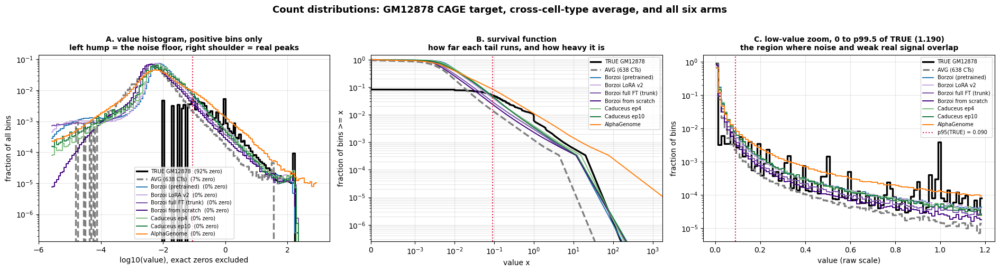

In [2]:
# §1.5 - count distributions: every arm, the observed GM12878 target and the
# cross-cell-type average on one value axis, over the allowed fold3 regions, both
# strands pooled. Read as a noise-vs-signal orientation: where each distribution's bulk
# sits, how much mass is at (or next to) zero, and how far the right tail runs.
# Borzoi targets are squashed counts, not raw counts, so the axis is that scale.
# Every name here is prefixed `h_` / `H_` so no later section is touched.
h_rng = np.random.default_rng(0)
H_SUB = 4_000_000                # values sampled per series, split over the two strands
H_ZOOM_Q = 99.5                  # the raw-scale zoom panel runs to this pct of TRUE

H_SERIES = ([('TRUE GM12878', TRUE, 'black', 2.4, '-'),
             (f'AVG ({N_CT} CTs)', AVG, '#7f7f7f', 2.4, '--')]
            + [(PRETTY[k], preds[k], COLORS[k], 1.4, '-') for k in KEYS])


def h_sample(d):
    """Allowed regions of a {plus, minus} pair, pooled and subsampled to H_SUB values."""
    out = []
    for s in STRANDS:
        v = np.asarray(d[s][allowed], dtype=np.float32).ravel()
        out.append(v[h_rng.integers(0, v.size, H_SUB // 2)] if v.size > H_SUB // 2 else v)
    return np.concatenate(out)


h_vals = {lab: h_sample(d) for lab, d, *_ in H_SERIES}
h_n = len(next(iter(h_vals.values())))
print(f'{allowed.sum()} allowed regions x {N_BIN} bins x 2 strands '
      f'-> {h_n:,} values sampled per series\n')

print(f"{'series':<26}{'=0':>8}{'<0.01':>8}{'<0.1':>8}{'mean':>9}{'median':>9}"
      f"{'p90':>9}{'p95':>9}{'p99':>9}{'p99.9':>10}{'max':>10}")
for lab, *_ in H_SERIES:
    v = h_vals[lab]
    p50, p90, p95, p99, p999 = np.percentile(v, [50, 90, 95, 99, 99.9])
    print(f'{lab:<26}{(v == 0).mean():>7.1%}{(v < 0.01).mean():>8.1%}{(v < 0.1).mean():>8.1%}'
          f'{v.mean():>9.4f}{p50:>9.4f}{p90:>9.4f}{p95:>9.4f}{p99:>9.3f}'
          f'{p999:>10.3f}{v.max():>10.2f}')

h_thr95 = float(np.percentile(h_vals['TRUE GM12878'], 95))
print(f"\np95 of TRUE (both strands pooled) = {h_thr95:.4f}  -- §6 recomputes this per "
      f"strand as the 'peak bin' cut; dashed line below")

# --- the figure -------------------------------------------------------------------
# panel A drops the exact zeros: TRUE is ~92% exact zeros at 32 bp while no prediction is
# ever exactly zero, so the bars would otherwise be one spike at the origin and nothing
# else legible. The zero fraction is in the legend instead, and heights stay fractions of
# *all* bins, so the curves remain comparable across series.
h_pos = {lab: v[v > 0] for lab, v in h_vals.items()}
h_top = max(np.percentile(v, 99.99) for v in h_vals.values())
h_lo = np.log10(max(1e-7, min(np.percentile(p, 1) for p in h_pos.values() if p.size)))
h_edges = np.linspace(h_lo, np.log10(h_top) + 0.2, 140)
h_ctr = 0.5 * (h_edges[:-1] + h_edges[1:])
h_zoom = float(np.percentile(h_vals['TRUE GM12878'], H_ZOOM_Q))
h_zedges = np.linspace(0, h_zoom, 90)
h_zctr = 0.5 * (h_zedges[:-1] + h_zedges[1:])

fig, axes = plt.subplots(1, 3, figsize=(19, 5))

for lab, _, color, lw, ls in H_SERIES:
    v = h_vals[lab]
    c, _ = np.histogram(np.log10(h_pos[lab]), bins=h_edges)
    axes[0].step(h_ctr, c / len(v), where='mid', color=color, lw=lw, ls=ls,
                 label=f'{lab}  ({(v == 0).mean():.0%} zero)')

    # exact empirical survival on the sample, thinned to keep the file small
    s = np.sort(v)
    i = np.unique(np.linspace(0, s.size - 1, 3000).astype(int))
    axes[1].plot(s[i], 1.0 - i / s.size, color=color, lw=lw, ls=ls, label=lab)

    cz, _ = np.histogram(v, bins=h_zedges)
    axes[2].step(h_zctr, cz / len(v), where='mid', color=color, lw=lw, ls=ls, label=lab)

ax = axes[0]
ax.axvline(np.log10(h_thr95), color='crimson', ls=':', lw=1.5)
ax.set_yscale('log')
ax.set_xlabel('log10(value), exact zeros excluded')
ax.set_ylabel('fraction of all bins')
ax.set_title('A. value histogram, positive bins only\n'
             'left hump = the noise floor, right shoulder = real peaks',
             fontsize=10, weight='bold')
ax.legend(fontsize=7)
ax.grid(alpha=0.3)

ax = axes[1]
ax.axvline(h_thr95, color='crimson', ls=':', lw=1.5)
ax.set_xscale('symlog', linthresh=1e-3)
ax.set_yscale('log')
ax.set_xlim(0, h_top * 3)
ax.set_ylim(1.0 / h_n, 1.5)
ax.set_xlabel('value x')
ax.set_ylabel('fraction of bins >= x')
ax.set_title('B. survival function\nhow far each tail runs, and how heavy it is',
             fontsize=10, weight='bold')
ax.legend(fontsize=7)
ax.grid(alpha=0.3, which='both')

ax = axes[2]
ax.axvline(h_thr95, color='crimson', ls=':', lw=1.5,
           label=f'p95(TRUE) = {h_thr95:.3f}')
ax.set_yscale('log')
ax.set_xlabel('value (raw scale)')
ax.set_ylabel('fraction of bins')
ax.set_title(f'C. low-value zoom, 0 to p{H_ZOOM_Q} of TRUE ({h_zoom:.3f})\n'
             'the region where noise and weak real signal overlap',
             fontsize=10, weight='bold')
ax.legend(fontsize=7)
ax.grid(alpha=0.3)

plt.suptitle('Count distributions: GM12878 CAGE target, cross-cell-type average, and all six arms',
             fontsize=13, weight='bold', y=1.02)
plt.tight_layout()
plt.show()

## 2. Per-region accuracy — the orienting figure

One boxplot before any specificity metric, so the rest of the notebook can be read against a known
accuracy ordering. Per region *and* per strand (13,776 samples per arm), under two metrics:

- **smoothed-log Pearson** — `log1p`, then Gaussian σ = 6.0 (the 32 bp equivalent of the Enformer
  notebooks' σ = 1.5 at 128 bp). This is the metric §4–§7 use.
- **plain per-bin Pearson** — no transform. This is the metric `comparing_model4` §19d reports, so
  the numbers here are directly comparable to that table.

Restricted to the `allowed` regions. The blacklist removes ~1.3% of fold3, so this barely moves the
means; the unrestricted values are printed too, which is the check `comparing_model4` §14b had to
make retroactively for its own boxplots.

arm                       smooth +  smooth -  smooth all    raw +    raw -   raw all  raw all (unrestr.)
Borzoi (pretrained)         0.6270    0.6253      0.6262   0.5955   0.5820    0.5888              0.5886
Borzoi LoRA v2              0.6389    0.6393      0.6391   0.6009   0.5937    0.5973              0.5971
Borzoi full FT (trunk)      0.6584    0.6601      0.6593   0.6236   0.6213    0.6224              0.6221
Borzoi from scratch         0.6081    0.6022      0.6052   0.5779   0.5694    0.5737              0.5731
Caduceus ep4                0.6195    0.6181      0.6188   0.5921   0.5884    0.5902              0.5898
Caduceus ep10               0.6325    0.6339      0.6332   0.6051   0.6010    0.6031              0.6025
AlphaGenome                 0.4733    0.4719      0.4726   0.3784   0.3713    0.3749              0.3749

paired vs Borzoi (pretrained) (smoothed-log, allowed regions, both strands):
  Borzoi LoRA v2           mean d +0.0130   wins 62.3%   wilcoxon p 1.86e-189
  Bo

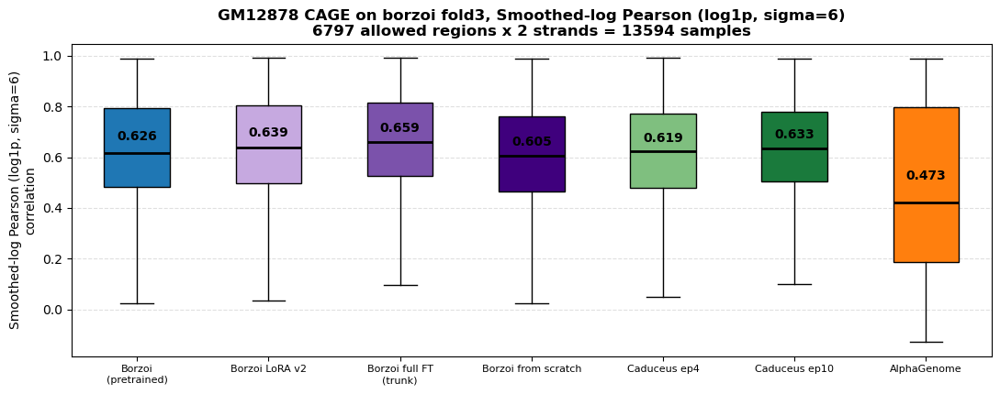

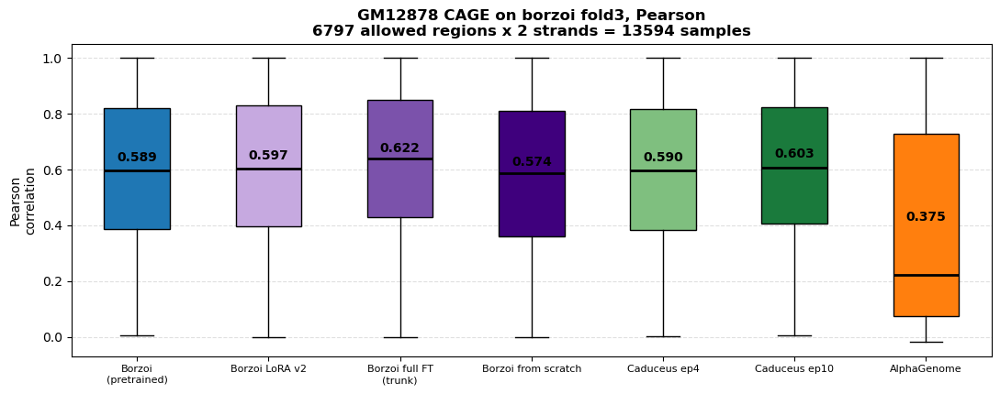

In [3]:
# §2 - per-region, per-strand correlation under both metrics.
R_SM = {k: {s: smoothed_log_pearson(preds[k][s], TRUE[s]) for s in STRANDS} for k in KEYS}

allowed2 = np.concatenate([allowed, allowed])
print(f"{'arm':<24}{'smooth +':>10}{'smooth -':>10}{'smooth all':>12}"
      f"{'raw +':>9}{'raw -':>9}{'raw all':>10}{'raw all (unrestr.)':>20}")
for k in KEYS:
    sm, rw = pool(R_SM[k]), pool(R_RAW[k])
    print(f'{PRETTY[k]:<24}'
          f'{np.nanmean(R_SM[k]["plus"][allowed]):>10.4f}'
          f'{np.nanmean(R_SM[k]["minus"][allowed]):>10.4f}'
          f'{np.nanmean(sm[allowed2]):>12.4f}'
          f'{np.nanmean(R_RAW[k]["plus"][allowed]):>9.4f}'
          f'{np.nanmean(R_RAW[k]["minus"][allowed]):>9.4f}'
          f'{np.nanmean(rw[allowed2]):>10.4f}'
          f'{np.nanmean(rw):>20.4f}')

# paired tests against the pretrained baseline. The two strands of a region are not
# independent, so the pairing is on (region, strand) and the n is inflated relative to
# the number of independent loci -- treat the p-values as descriptive.
print(f"\npaired vs {PRETTY['borzoi_pre']} (smoothed-log, allowed regions, both strands):")
base = pool(R_SM['borzoi_pre'])[allowed2]
for k in KEYS[1:]:
    v = pool(R_SM[k])[allowed2]
    m = ~np.isnan(base) & ~np.isnan(v)
    stat, p = wilcoxon(v[m], base[m])
    print(f'  {PRETTY[k]:<24} mean d {np.mean(v[m] - base[m]):+.4f}   '
          f'wins {float((v[m] > base[m]).mean()):.1%}   wilcoxon p {p:.2e}')

for res, meth in [(R_SM, f'Smoothed-log Pearson (log1p, sigma={SMOOTH_SIGMA:g})'),
                  (R_RAW, 'Pearson')]:
    data = [pool(res[k])[allowed2][~np.isnan(pool(res[k])[allowed2])] for k in KEYS]
    plt.figure(figsize=(11, 4.4))
    box = plt.boxplot(data, labels=[PRETTY[k].replace(' (', '\n(') for k in KEYS],
                      showfliers=False, patch_artist=True, boxprops=dict(edgecolor='black'),
                      medianprops=dict(color='black', linewidth=2),
                      whiskerprops=dict(color='black'), capprops=dict(color='black'))
    for patch, k in zip(box['boxes'], KEYS):
        patch.set_facecolor(COLORS[k])
    for i, vals in enumerate(data):
        plt.text(i + 1, np.mean(vals) + 0.03, f'{np.mean(vals):.3f}', ha='center',
                 va='bottom', fontsize=10, fontweight='bold')
    plt.ylabel(f'{meth}\ncorrelation', fontsize=10)
    plt.title(f'GM12878 CAGE on borzoi fold3, {meth}\n'
              f'{allowed.sum()} allowed regions x 2 strands = {int(allowed2.sum())} samples',
              fontsize=12, weight='bold')
    plt.xticks(fontsize=8)
    plt.grid(axis='y', linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.show()

## 3. Element-wise comparison against pretrained Borzoi

= `comparing_model4` §4. One panel per arm: its per-region-strand correlation on the y-axis against
pretrained Borzoi's on the x-axis. Points above the dashed `y = x` are region-strands where that
arm beats the baseline; the title gives the win rate and the mean delta.

Pretrained Borzoi is the right x-axis here because it is the only arm not trained on these three
tracks, so each panel reads as "what did this training buy". Both metrics are shown. The **win
rate is the more robust summary**: the mean delta is pulled around by the long left tail of
low-signal region-strands, where correlations are unstable in both arms at once.

arm                             metric    wins    mean d   median d   wilcoxon p
Borzoi LoRA v2            smoothed-log  62.3%   +0.0130    +0.0080    1.86e-189
Borzoi full FT (trunk)    smoothed-log  71.8%   +0.0331    +0.0245     0.00e+00
Borzoi from scratch       smoothed-log  44.8%   -0.0210    -0.0096     2.40e-69
Caduceus ep4              smoothed-log  47.2%   -0.0074    -0.0060     1.59e-13
Caduceus ep10             smoothed-log  51.9%   +0.0070    +0.0033     4.57e-11
AlphaGenome               smoothed-log  23.8%   -0.1536    -0.1250     0.00e+00
Borzoi LoRA v2                     raw  55.8%   +0.0085    +0.0025     2.29e-56
Borzoi full FT (trunk)             raw  66.4%   +0.0337    +0.0198     0.00e+00
Borzoi from scratch                raw  47.4%   -0.0151    -0.0041     1.66e-23
Caduceus ep4                       raw  50.3%   +0.0015    +0.0006     8.65e-01
Caduceus ep10                      raw  53.4%   +0.0143    +0.0053     2.28e-19
AlphaGenome                        raw 

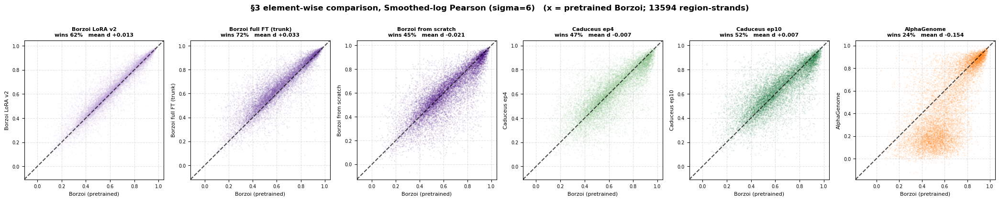

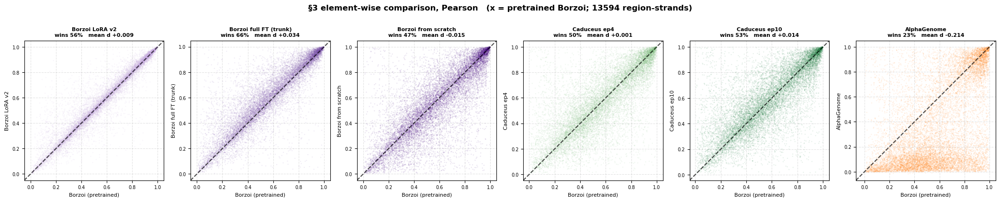

In [4]:
# §3 - per-region-strand scatter against the pretrained baseline.
CMP_KEYS = [k for k in KEYS if k != 'borzoi_pre']

print(f"{'arm':<24}{'metric':>14}{'wins':>8}{'mean d':>10}{'median d':>11}{'wilcoxon p':>13}")
for res, meth in [(R_SM, 'smoothed-log'), (R_RAW, 'raw')]:
    base = pool(res['borzoi_pre'])[allowed2]
    for k in CMP_KEYS:
        comp = pool(res[k])[allowed2]
        m = ~np.isnan(base) & ~np.isnan(comp)
        d = comp[m] - base[m]
        p = wilcoxon(comp[m], base[m])[1]
        print(f'{PRETTY[k]:<24}{meth:>14}{float((d > 0).mean()):>7.1%}'
              f'{d.mean():>+10.4f}{np.median(d):>+11.4f}{p:>13.2e}')

for res, meth in [(R_SM, f'Smoothed-log Pearson (sigma={SMOOTH_SIGMA:g})'), (R_RAW, 'Pearson')]:
    base = pool(res['borzoi_pre'])[allowed2]
    fig, axes = plt.subplots(1, len(CMP_KEYS), figsize=(3.5 * len(CMP_KEYS), 4.3))
    for ax, k in zip(np.atleast_1d(axes), CMP_KEYS):
        comp = pool(res[k])[allowed2]
        m = ~np.isnan(base) & ~np.isnan(comp)
        xb, yb = base[m], comp[m]
        ax.scatter(xb, yb, color=COLORS[k], alpha=0.10, s=3, edgecolor='none')
        lo, hi = float(min(xb.min(), yb.min())), float(max(xb.max(), yb.max()))
        buf = (hi - lo) * 0.05
        ax.plot([lo - buf, hi + buf], [lo - buf, hi + buf], color='black', ls='--', alpha=0.7)
        ax.set_xlim(lo - buf, hi + buf)
        ax.set_ylim(lo - buf, hi + buf)
        ax.set_box_aspect(1)
        ax.set_xlabel(PRETTY['borzoi_pre'], fontsize=8)
        ax.set_ylabel(PRETTY[k], fontsize=8)
        ax.set_title(f'{PRETTY[k]}\nwins {float((yb > xb).mean()):.0%}   '
                     f'mean d {np.mean(yb - xb):+.3f}', fontsize=8, weight='bold')
        ax.grid(ls='--', alpha=0.35)
        ax.tick_params(labelsize=7)
    fig.suptitle(f'§3 element-wise comparison, {meth}   '
                 f'(x = pretrained Borzoi; {int(allowed2.sum())} region-strands)',
                 fontsize=12, weight='bold')
    fig.tight_layout()
    plt.show()

## 4. = `comparing_model4` §15 — the gap, and the oracle null it needs

`gap = R(pred, AVG) − R(pred, TRUE)` is the notebook's original "does this look generic" measure:
positive means the prediction resembles the cross-cell-type average more than it resembles GM12878.

**The gap is not centred on zero.** `comparing_model4` §15 found that a *perfect* predictor — one
that outputs `TRUE` exactly — scores `gap = R(TRUE, AVG) − 1`, which on the Enformer data was
≈ −0.28. Comparing raw gaps across models therefore inflates the spread between them by roughly 4x,
and §18 lists this as one of two ways the original claim was overstated.

The fix is to report **excess over oracle**:

```
gap_oracle = R(TRUE, AVG) − 1            per region, per strand — model-independent
excess     = gap − gap_oracle            0 = as cell-type-specific as the data allows
```

`excess` is what should be compared across arms. Both are printed; the figure shows the raw gap
against the corrected one so the size of the correction is visible rather than asserted.

oracle: a perfect predictor scores gap = R(TRUE, AVG) - 1 = -0.3152 (median over allowed region-strands)
  per strand: + -0.3168   - -0.3131

arm                        R_true    R_avg      gap    excess  excess/|oracle|
Borzoi (pretrained)        0.6182   0.8009  +0.1264   +0.4477            1.420
Borzoi LoRA v2             0.6367   0.7705  +0.0877   +0.4056            1.287
Borzoi full FT (trunk)     0.6582   0.7625  +0.0653   +0.3789            1.202
Borzoi from scratch        0.6052   0.7364  +0.0917   +0.4072            1.292
Caduceus ep4               0.6221   0.7098  +0.0579   +0.3734            1.185
Caduceus ep10              0.6340   0.7219  +0.0585   +0.3740            1.187
AlphaGenome                0.4206   0.6235  +0.0852   +0.3820            1.212

spread across the six arms, raw gap vs excess:
  raw gap    min +0.0579  max +0.1264  spread 0.0686
  excess     min +0.3734  max +0.4477  spread 0.0742
  The oracle is model-independent, so it cannot change the RANKING -- wh

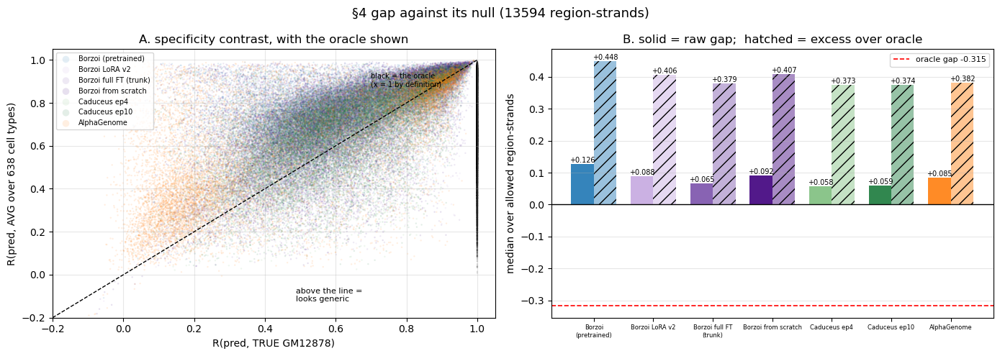

In [5]:
# §4 - gap, the oracle null, and excess over it.
R_AVG = {k: {s: smoothed_log_pearson(preds[k][s], AVG[s]) for s in STRANDS} for k in KEYS}
R_TRUE_AVG = {s: smoothed_log_pearson(TRUE[s], AVG[s]) for s in STRANDS}

GAP = {k: {s: R_AVG[k][s] - R_SM[k][s] for s in STRANDS} for k in KEYS}
GAP_ORACLE = {s: R_TRUE_AVG[s] - 1.0 for s in STRANDS}
EXCESS = {k: {s: GAP[k][s] - GAP_ORACLE[s] for s in STRANDS} for k in KEYS}

go = pool(GAP_ORACLE)[allowed2]
print(f'oracle: a perfect predictor scores gap = R(TRUE, AVG) - 1 = '
      f'{np.nanmedian(go):+.4f} (median over allowed region-strands)')
print(f'  per strand: + {np.nanmedian(GAP_ORACLE["plus"][allowed]):+.4f}   '
      f'- {np.nanmedian(GAP_ORACLE["minus"][allowed]):+.4f}\n')

print(f"{'arm':<24}{'R_true':>9}{'R_avg':>9}{'gap':>9}{'excess':>10}{'excess/|oracle|':>17}")
rows = {}
for k in KEYS:
    rt = np.nanmedian(pool(R_SM[k])[allowed2])
    ra = np.nanmedian(pool(R_AVG[k])[allowed2])
    g = np.nanmedian(pool(GAP[k])[allowed2])
    e = np.nanmedian(pool(EXCESS[k])[allowed2])
    rows[k] = (rt, ra, g, e)
    print(f'{PRETTY[k]:<24}{rt:>9.4f}{ra:>9.4f}{g:>+9.4f}{e:>+10.4f}'
          f'{e / abs(np.nanmedian(go)):>17.3f}')

print('\nspread across the six arms, raw gap vs excess:')
gs = [rows[k][2] for k in KEYS]
es = [rows[k][3] for k in KEYS]
print(f'  raw gap    min {min(gs):+.4f}  max {max(gs):+.4f}  spread {max(gs) - min(gs):.4f}')
print(f'  excess     min {min(es):+.4f}  max {max(es):+.4f}  spread {max(es) - min(es):.4f}')
print('  The oracle is model-independent, so it cannot change the RANKING -- what it changes is')
print('  the reference level: a gap of +0.10 reads very differently against a floor of 0 than')
print(f'  against the true floor of {np.nanmedian(go):+.3f}.')
print('  The two spreads differ slightly because excess is computed per sample and then medianed,')
print('  and the median of a difference is not the difference of medians.')

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

ax = axes[0]
for k in KEYS:
    x = pool(R_SM[k])[allowed2]
    y = pool(R_AVG[k])[allowed2]
    ax.scatter(x, y, s=3, alpha=0.12, color=COLORS[k], edgecolors='none', label=PRETTY[k])
xo = np.ones_like(pool(R_TRUE_AVG)[allowed2])
ax.scatter(xo, pool(R_TRUE_AVG)[allowed2], s=3, alpha=0.12, color='k', edgecolors='none')
ax.plot([-0.2, 1.0], [-0.2, 1.0], 'k--', lw=1)
ax.text(0.55, 0.06, 'above the line =\nlooks generic', fontsize=8, transform=ax.transAxes)
ax.text(0.72, 0.86, 'black = the oracle\n(x = 1 by definition)', fontsize=7,
        transform=ax.transAxes)
ax.set_xlim(-0.2, 1.05)
ax.set_ylim(-0.2, 1.05)
ax.set_xlabel('R(pred, TRUE GM12878)')
ax.set_ylabel(f'R(pred, AVG over {N_CT} cell types)')
ax.set_title('A. specificity contrast, with the oracle shown')
ax.legend(fontsize=7, loc='upper left', markerscale=4)
ax.grid(alpha=0.3)

ax = axes[1]
xs = np.arange(len(KEYS))
w = 0.38
for i, k in enumerate(KEYS):
    ax.bar(i - w / 2, rows[k][2], w, color=COLORS[k], alpha=0.9)
    ax.bar(i + w / 2, rows[k][3], w, color=COLORS[k], alpha=0.45, hatch='//')
    ax.text(i - w / 2, rows[k][2], f'{rows[k][2]:+.3f}', ha='center',
            va='top' if rows[k][2] < 0 else 'bottom', fontsize=7)
    ax.text(i + w / 2, rows[k][3], f'{rows[k][3]:+.3f}', ha='center',
            va='top' if rows[k][3] < 0 else 'bottom', fontsize=7)
ax.axhline(0, color='k', lw=1)
ax.axhline(np.nanmedian(go), color='r', lw=1.2, ls='--',
           label=f'oracle gap {np.nanmedian(go):+.3f}')
ax.set_xticks(xs)
ax.set_xticklabels([PRETTY[k].replace(' (', '\n(') for k in KEYS], fontsize=6)
ax.set_ylabel('median over allowed region-strands')
ax.set_title('B. solid = raw gap;  hatched = excess over oracle')
ax.legend(fontsize=8)
ax.grid(axis='y', alpha=0.3)

fig.suptitle(f'§4 gap against its null ({int(allowed2.sum())} region-strands)', fontsize=13)
fig.tight_layout()
plt.show()

## 5. = `comparing_model4` §16 / §19c — cell-type identifiability at full resolution

The sharpest form of the claim. Rather than asking whether a prediction resembles a synthetic
average, ask whether it resembles *the right cell type*: score each arm's GM12878 prediction
against **every one of the 638 observed CAGE cell types** and see where GM12878 ranks.

```
own          = R(pred, TRUE_GM12878)
best_other   = max over the 637 other cell types of R(pred, TRUE_ct)
margin       = own − best_other          > 0 means GM12878 is the best match
```

`comparing_model4` §16 could only run this on a 16-cell-type panel at `ID_STRIDE=8`, i.e. ~236
regions, and §19a's first criticism of it was that the answer depends on which cell types are in
the panel. Here there is no panel and no subsampling: all 638 cell types, all 6888 regions, both
strands, precomputed by `evals/borzoi_cage_ident.py`.

**Two nulls, and they say different things.** Reported side by side because quoting either alone
repeats the §18 mistake:

- **oracle margin** = `1 − max_ct R(TRUE_GM12878, TRUE_ct)`. The ceiling: how identifiable GM12878
  is *in the data*, before any model. On the first pass this came out at only ~0.16 (median best
  confuser ≈ 0.84), far tighter than Enformer's +0.378 — but that is a max over 638 cell types
  against Enformer's single fixed comparator, so the two are not comparable as printed.
- **fixed-comparator margin**, against the one cell type that is hardest to distinguish from
  GM12878 across the whole fold. This is the true analogue of §16's GM12878-vs-HepG2 number.

**This is the one section AlphaGenome is missing from.** The cache stores `R(pred, TRUE_ct)` for
each arm against all 638 cell types; the 638 observed tracks themselves live in the 108 GB
`borzoi_fold3_CAGE.zarr`, so a seventh arm needs another full pass
(`sbatch evals/borzoi_cage_ident.sh` after adding it to that script's `ARMS`). Until then §5 runs
on the six cached arms and the cell prints which arms it dropped, rather than asserting an arm set
and failing. §10 carries `NaN` in the three identifiability columns for AlphaGenome. Nothing else
in the notebook is affected.

identifiability cache: 6888 regions x 638 cell types x 2 strands, sigma 6.0
scored here: Borzoi (pretrained), Borzoi LoRA v2, Borzoi full FT (trunk), Borzoi from scratch, Caduceus ep4, Caduceus ep10
NOT in the cache, skipped in this section only: AlphaGenome   (rebuild: add to ARMS in evals/borzoi_cage_ident.py, then sbatch its .sh)
gate: cache own-column agrees with §2 R_SM to 4.3e-05 across all 12 cached arm-strands
hardest confuser: strand-block slot 433 = borzoi tracks 866/867, mean R(TRUE_GM12878, TRUE_that) = 0.6021



oracle margin vs best of 637 others: +0.2886
oracle margin vs the fixed hardest confuser: +0.4054

arm                        own R  best other   margin  % of oracle  fixed margin  % of oracle  GM12878 rank
Borzoi (pretrained)       0.6182      0.7726  -0.0893       -31.0%       +0.0124         3.0%            31
Borzoi LoRA v2            0.6367      0.7684  -0.0826       -28.6%       +0.0171         4.2%            23
Borzoi full FT (trunk)    0.6582      0.7690  -0.0743       -25.8%       +0.0171         4.2%            18


Borzoi from scratch       0.6052      0.7647  -0.1111       -38.5%       +0.0141         3.5%            39
Caduceus ep4              0.6221      0.7267  -0.0741       -25.7%       +0.0321         7.9%            17
Caduceus ep10             0.6340      0.7323  -0.0706       -24.4%       +0.0303         7.5%            16

fraction of region-strands where GM12878 is the single best-matching cell type:
  Borzoi (pretrained)        8.0%
  Borzoi LoRA v2             9.7%
  Borzoi full FT (trunk)    11.2%
  Borzoi from scratch        5.4%
  Caduceus ep4              12.6%
  Caduceus ep10             12.6%


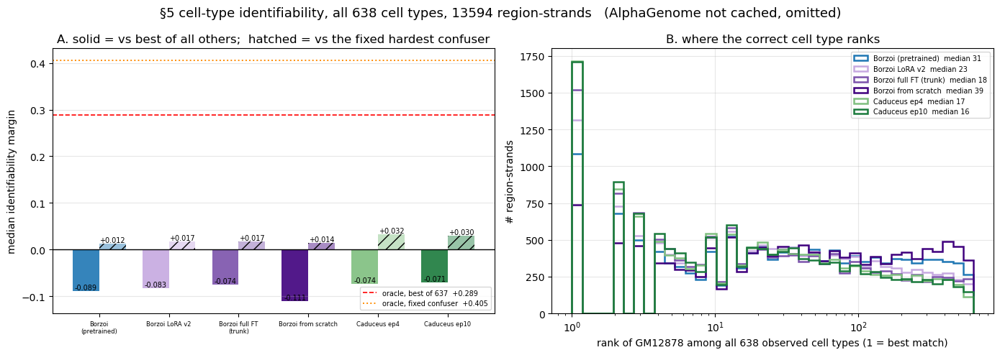

In [6]:
# §5 - identifiability against all 638 observed cell types.
assert os.path.exists(IDENT_NPZ), (
    f'missing {IDENT_NPZ} -- run: sbatch evals/borzoi_cage_ident.sh\n'
    f'(needs all six prediction files on disk first)')
_i = np.load(IDENT_NPZ)
IDENT_META = json.loads(str(_i['meta']))
assert IDENT_META['gm_slot'] == GM_SLOT and IDENT_META['n_cell_types'] == N_CT
# The cache predates alphagenome and a new arm costs another 108 GB pass, so this
# section scores the cached arms rather than every arm in the notebook. Named, not
# silently dropped.
IDENT_KEYS = [k for k in KEYS if k in set(IDENT_META['arms'])]
_uncached = [k for k in KEYS if k not in IDENT_KEYS]
assert IDENT_KEYS, 'none of this notebook\'s arms are in the identifiability cache'
print(f"identifiability cache: {IDENT_META['n_regions']} regions x {N_CT} cell types x 2 strands, "
      f"sigma {IDENT_META['smooth_sigma']}")
print(f"scored here: {', '.join(PRETTY[k] for k in IDENT_KEYS)}")
print(f"NOT in the cache, skipped in this section only: "
      f"{', '.join(PRETTY[k] for k in _uncached) if _uncached else 'none'}"
      + ('   (rebuild: add to ARMS in evals/borzoi_cage_ident.py, then sbatch its .sh)'
         if _uncached else ''))

# cross-check: the cache's own-column is the same quantity §2 computed independently.
# The two paths differ -- the cache smooths all 638 columns at once, §2 smooths a single
# vector -- so they agree to float32 accumulation, not exactly. A wrong column or a
# swapped strand would be off by O(0.1), not O(1e-5).
_d = max(float(np.nanmax(np.abs(_i[f'rsm_{k}_{s}'][:, GM_SLOT] - R_SM[k][s])))
         for k in IDENT_KEYS for s in STRANDS)
assert _d < 1e-3, (
    f'GATE FAILED: the identifiability cache disagrees with §2 on R(pred, TRUE) by {_d:.3g} '
    f'-- its column mapping or strand order does not match this notebook')
print(f'gate: cache own-column agrees with §2 R_SM to {_d:.1e} across all '
      f'{2 * len(IDENT_KEYS)} cached arm-strands')

OTHER = np.delete(np.arange(N_CT), GM_SLOT)

# the hardest confuser: the cell type whose OBSERVED CAGE is closest to GM12878's, pooled
# over strands and allowed regions. Model-independent, so it is a fair fixed comparator.
conf = np.nanmean(np.concatenate([RSM_CT_TRUE[s][allowed] for s in STRANDS]), axis=0)
conf[GM_SLOT] = -np.inf
HARDEST = int(np.argmax(conf))
print(f'hardest confuser: strand-block slot {HARDEST} = borzoi tracks '
      f'{COLS["plus"][HARDEST]}/{COLS["minus"][HARDEST]}, '
      f'mean R(TRUE_GM12878, TRUE_that) = {conf[HARDEST]:.4f}')

# oracle ceilings
orc_best, orc_fixed = {}, {}
for s in STRANDS:
    m = RSM_CT_TRUE[s]
    orc_best[s] = 1.0 - np.nanmax(m[:, OTHER], axis=1)
    orc_fixed[s] = 1.0 - m[:, HARDEST]
ob = np.nanmedian(pool(orc_best)[allowed2])
of = np.nanmedian(pool(orc_fixed)[allowed2])
print(f'\noracle margin vs best of {N_CT - 1} others: {ob:+.4f}')
print(f'oracle margin vs the fixed hardest confuser: {of:+.4f}')

print(f"\n{'arm':<24}{'own R':>8}{'best other':>12}{'margin':>9}{'% of oracle':>13}"
      f"{'fixed margin':>14}{'% of oracle':>13}{'GM12878 rank':>14}")
ident = {}
for k in IDENT_KEYS:
    # every npz __getitem__ re-reads the member, so pull each matrix out once
    M = {s: _i[f'rsm_{k}_{s}'] for s in STRANDS}
    own = {s: M[s][:, GM_SLOT] for s in STRANDS}
    bo = {s: np.nanmax(M[s][:, OTHER], axis=1) for s in STRANDS}
    fx = {s: M[s][:, HARDEST] for s in STRANDS}
    marg = {s: own[s] - bo[s] for s in STRANDS}
    fmarg = {s: own[s] - fx[s] for s in STRANDS}
    # rank of GM12878 among all 638 cell types, 1 = best
    rank = {s: (M[s] > own[s][:, None]).sum(axis=1) + 1 for s in STRANDS}
    ident[k] = dict(own=own, best_other=bo, margin=marg, fixed_margin=fmarg, rank=rank)
    mm = np.nanmedian(pool(marg)[allowed2])
    fm = np.nanmedian(pool(fmarg)[allowed2])
    print(f'{PRETTY[k]:<24}{np.nanmedian(pool(own)[allowed2]):>8.4f}'
          f'{np.nanmedian(pool(bo)[allowed2]):>12.4f}{mm:>+9.4f}{100 * mm / ob:>12.1f}%'
          f'{fm:>+14.4f}{100 * fm / of:>12.1f}%'
          f'{np.median(pool(rank)[allowed2]):>14.0f}')

print(f'\nfraction of region-strands where GM12878 is the single best-matching cell type:')
for k in IDENT_KEYS:
    top1 = (pool(ident[k]['rank'])[allowed2] == 1).mean()
    print(f'  {PRETTY[k]:<24}{top1:>7.1%}')

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

ax = axes[0]
for i, k in enumerate(IDENT_KEYS):
    mm = np.nanmedian(pool(ident[k]['margin'])[allowed2])
    fm = np.nanmedian(pool(ident[k]['fixed_margin'])[allowed2])
    ax.bar(i - 0.19, mm, 0.38, color=COLORS[k], alpha=0.9)
    ax.bar(i + 0.19, fm, 0.38, color=COLORS[k], alpha=0.45, hatch='//')
    ax.text(i - 0.19, mm, f'{mm:+.3f}', ha='center', va='bottom', fontsize=7)
    ax.text(i + 0.19, fm, f'{fm:+.3f}', ha='center', va='bottom', fontsize=7)
ax.axhline(ob, color='r', ls='--', lw=1.2, label=f'oracle, best of {N_CT - 1}  {ob:+.3f}')
ax.axhline(of, color='darkorange', ls=':', lw=1.4, label=f'oracle, fixed confuser  {of:+.3f}')
ax.axhline(0, color='k', lw=1)
ax.set_xticks(range(len(IDENT_KEYS)))
ax.set_xticklabels([PRETTY[k].replace(' (', '\n(') for k in IDENT_KEYS], fontsize=6)
ax.set_ylabel('median identifiability margin')
ax.set_title('A. solid = vs best of all others;  hatched = vs the fixed hardest confuser')
ax.legend(fontsize=7)
ax.grid(axis='y', alpha=0.3)

ax = axes[1]
for k in IDENT_KEYS:
    r = pool(ident[k]['rank'])[allowed2]
    ax.hist(r, bins=np.logspace(0, np.log10(N_CT), 40), histtype='step', lw=1.8,
            color=COLORS[k], label=f'{PRETTY[k]}  median {np.median(r):.0f}')
ax.set_xscale('log')
ax.set_xlabel(f'rank of GM12878 among all {N_CT} observed cell types (1 = best match)')
ax.set_ylabel('# region-strands')
ax.set_title('B. where the correct cell type ranks')
ax.legend(fontsize=7)
ax.grid(alpha=0.3)

fig.suptitle(f'§5 cell-type identifiability, all {N_CT} cell types, '
             f'{int(allowed2.sum())} region-strands'
             + (f'   ({", ".join(PRETTY[k] for k in _uncached)} not cached, omitted)'
                if _uncached else ''), fontsize=13)
fig.tight_layout()
plt.show()

## 6. = `comparing_model4` §17 — magnitude, and making it comparable

§6/§12 of `comparing_model4` reported `log2((pred+1)/(true+1))` as "over-prediction", and §18
records that this was wrong for AlphaGenome: its outputs live on a different scale, so its +2.94
was a unit conversion being read as a modelling failure.

That trap is live again here, and this section is where it is measured. The six Borzoi-space arms
all predict in the same squashed target space, so among them the effect is mild — but "mild" is a
claim to check, not assume — while AlphaGenome is once more an external model on its own
normalisation, so its uncalibrated column is expected to be large and is not a modelling result.
The calibrated column is the one to read for it. So:

1. Fit one global multiplicative calibration per arm per strand, `s = Σ TRUE / Σ pred`, over the
   allowed bins only. `s` far from 1 means the arm is systematically mis-scaled.
2. Report the magnitude error **before and after** applying it, so the part that is scale and the
   part that is shape can be told apart.
3. Report `precision@k` alongside — it is scale-invariant by construction, so it is the honest
   peak-location measure and a useful control on the magnitude numbers.

`k` is the number of bins whose observed value clears the global 95th percentile of `TRUE`,
computed on the 32 bp grid rather than inherited from the Enformer notebooks.

global p95 of TRUE: + 0.0900   - 0.0900
regions with >= 3 peak bins: + 6797   - 6797   (of 6797 allowed)



arm                       scale s +  scale s -  log2 err raw  log2 err calib   prec@k


Borzoi (pretrained)          1.2861     1.3151        +0.097          +0.129    0.285


Borzoi LoRA v2               1.2254     1.1901        +0.087          +0.107    0.291


Borzoi full FT (trunk)       1.4030     1.4072        +0.068          +0.098    0.302


Borzoi from scratch          1.6446     1.5035        +0.053          +0.087    0.287


Caduceus ep4                 1.1534     1.0065        +0.089          +0.095    0.286


Caduceus ep10                1.2213     1.2026        +0.089          +0.109    0.292


AlphaGenome                  0.1919     0.1813        +0.134          +0.024    0.140


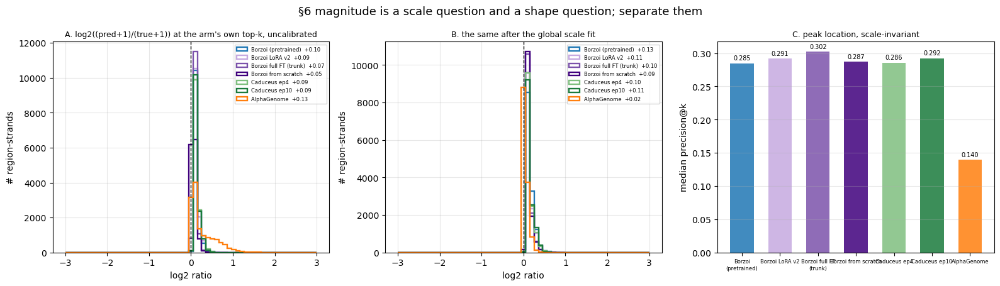

In [7]:
# §6 - scale calibration, magnitude error, and precision@k.
# thresholds are recomputed on this grid, not carried over from the 128 bp notebooks
THR_T = {s: float(np.percentile(TRUE[s][allowed], 95)) for s in STRANDS}
print(f'global p95 of TRUE: + {THR_T["plus"]:.4f}   - {THR_T["minus"]:.4f}')

K_MIN = 3
elig = {s: allowed & ((TRUE[s] >= THR_T[s]).sum(axis=1) >= K_MIN) for s in STRANDS}
print(f'regions with >= {K_MIN} peak bins: + {elig["plus"].sum()}   - {elig["minus"].sum()}'
      f'   (of {allowed.sum()} allowed)')

SCALE = {}
for k in KEYS:
    SCALE[k] = {s: float(TRUE[s][allowed].sum() / preds[k][s][allowed].sum()) for s in STRANDS}

print(f"\n{'arm':<24}{'scale s +':>11}{'scale s -':>11}"
      f"{'log2 err raw':>14}{'log2 err calib':>16}{'prec@k':>9}")
mag = {}
for k in KEYS:
    raw_e, cal_e, pk = [], [], []
    for s in STRANDS:
        sel = np.flatnonzero(elig[s])
        T, P = TRUE[s][sel], preds[k][s][sel]
        pos = T >= THR_T[s]
        kk = pos.sum(axis=1)
        order = np.argsort(P, axis=1)
        rows = np.arange(len(sel))
        # per-region top-k differs in k, so walk the rows
        for j, n_k in enumerate(kk):
            top = order[j, -n_k:]
            raw_e.append(np.median(np.log2((P[j, top] + 1) / (T[j, top] + 1))))
            cal_e.append(np.median(np.log2((SCALE[k][s] * P[j, top] + 1) / (T[j, top] + 1))))
            pk.append(pos[j, top].mean())
    mag[k] = dict(raw=np.array(raw_e), cal=np.array(cal_e), pk=np.array(pk))
    print(f'{PRETTY[k]:<24}{SCALE[k]["plus"]:>11.4f}{SCALE[k]["minus"]:>11.4f}'
          f'{np.median(mag[k]["raw"]):>+14.3f}{np.median(mag[k]["cal"]):>+16.3f}'
          f'{np.median(mag[k]["pk"]):>9.3f}')

fig, axes = plt.subplots(1, 3, figsize=(16, 4.6))
for ax, field, title in [
        (axes[0], 'raw', 'A. log2((pred+1)/(true+1)) at the arm\'s own top-k, uncalibrated'),
        (axes[1], 'cal', 'B. the same after the global scale fit')]:
    bins = np.linspace(-3, 3, 60)
    for k in KEYS:
        v = mag[k][field]
        ax.hist(v[np.isfinite(v)], bins=bins, histtype='step', lw=1.7, color=COLORS[k],
                label=f'{PRETTY[k]}  {np.median(v):+.2f}')
    ax.axvline(0, color='k', lw=1, ls='--')
    ax.set_xlabel('log2 ratio')
    ax.set_ylabel('# region-strands')
    ax.set_title(title, fontsize=9)
    ax.legend(fontsize=6)
    ax.grid(alpha=0.3)

ax = axes[2]
for i, k in enumerate(KEYS):
    v = np.median(mag[k]['pk'])
    ax.bar(i, v, 0.62, color=COLORS[k], alpha=0.85)
    ax.text(i, v + 0.005, f'{v:.3f}', ha='center', fontsize=7)
ax.set_xticks(range(len(KEYS)))
ax.set_xticklabels([PRETTY[k].replace(' (', '\n(') for k in KEYS], fontsize=6)
ax.set_ylabel('median precision@k')
ax.set_title('C. peak location, scale-invariant', fontsize=9)
ax.grid(axis='y', alpha=0.3)

fig.suptitle('§6 magnitude is a scale question and a shape question; separate them', fontsize=13)
fig.tight_layout()
plt.show()

## 7. = `comparing_model4` §19a — the specificity residual

The metric §19a proposed and never ran. `gap` (§3) and the identifiability margin (§4) both measure
genericness, but neither answers the form of the question that is easiest to state in a paper:
*what fraction of the cell-type-specific signal does each arm actually recover?*

```
r_spec = R(pred_calibrated − AVG_loo,   TRUE − AVG_loo)
```

A perfect predictor scores 1 by construction, so unlike `gap` this needs no oracle offset — the
failure mode §15 had to correct cannot recur here.

All four of §19a's implementation requirements are met explicitly:

1. **Leave-GM12878-out average.** `AVG_loo` excludes track 870/871. §14b's finding that
   self-inclusion moves `gap` by ≤0.001 does *not* transfer: `TRUE − AVG` would have 1/638 of
   `TRUE` subtracted out of its own residual. Both versions are computed below and the difference
   is reported rather than assumed negligible.
2. **Scale calibrated first.** `pred` is multiplied by §6's `s` before subtracting. A residual is
   not scale-invariant, so this is mandatory, not cosmetic.
3. **Composition order stated.** The headline number is **subtract on the raw scale**, exactly as
   §19a writes it. A smoothed-log variant is reported alongside for consistency with §2–§5, and its
   order is **`log1p` and smooth each of `pred`, `TRUE`, `AVG_loo` first, then subtract** — the
   other order (subtract, then `log1p`) is undefined on negative residuals and is not used.
4. **Stratified.** Where `TRUE ≈ AVG` the residual is nearly zero and `r_spec` is noise. Results
   are cut by `R(TRUE, AVG_loo)` into terciles and, separately, restricted to region-strands whose
   residual carries enough variance. Both cuts are printed.

x = R(TRUE, AVG_loo): median 0.745, tercile cuts 0.615 / 0.868
residual-variance cut: dropping the bottom quartile (sd <= 0.1223) leaves 10195 of 13594 region-strands

arm                        r_spec  smoothed  self-inc  high-var   specific x<0.61            middle   generic x>=0.87
Borzoi (pretrained)        0.4472    0.3755    0.4452    0.5465            0.2510            0.4538            0.7894
Borzoi LoRA v2             0.4696    0.4169    0.4676    0.5716            0.2938            0.4497            0.7964
Borzoi full FT (trunk)     0.5266    0.4554    0.5248    0.6343            0.3402            0.5036            0.8241
Borzoi from scratch        0.4518    0.3653    0.4501    0.5517            0.2591            0.4468            0.7716
Caduceus ep4               0.4579    0.4014    0.4557    0.5651            0.3039            0.4269            0.7609
Caduceus ep10              0.4922    0.4221    0.4908    0.5965            0.3326            0.4725            0.7771
AlphaG

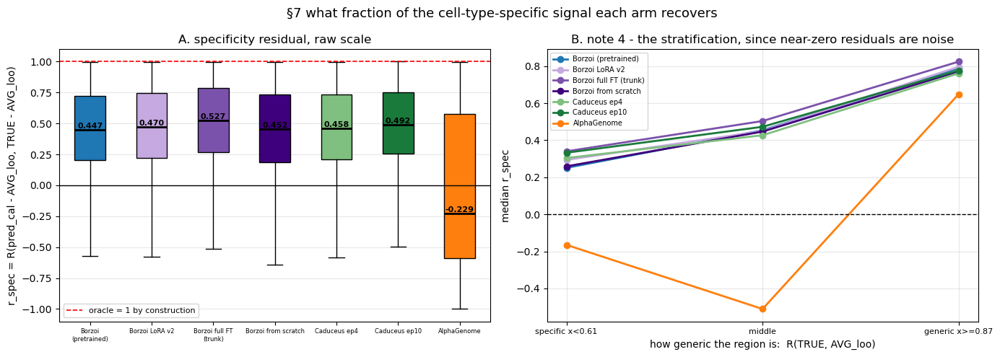

In [8]:
# §7 - the semi-partial specificity residual.
# note 3: the headline is the RAW-scale subtraction. The smoothed variant below applies
# log1p+smoothing to each of pred / TRUE / AVG_loo and only then subtracts.
RESID_TRUE = {s: TRUE[s] - AVG_LOO[s] for s in STRANDS}
_sm_true = {s: smooth_log(TRUE[s]) for s in STRANDS}
_sm_loo = {s: smooth_log(AVG_LOO[s]) for s in STRANDS}
RESID_TRUE_SM = {s: _sm_true[s] - _sm_loo[s] for s in STRANDS}
del _sm_true                    # 339 MB, only needed to build RESID_TRUE_SM

R_SPEC, R_SPEC_SM, R_SPEC_SELFINC = {}, {}, {}
for k in KEYS:
    R_SPEC[k], R_SPEC_SM[k], R_SPEC_SELFINC[k] = {}, {}, {}
    for s in STRANDS:
        pc = SCALE[k][s] * preds[k][s]
        R_SPEC[k][s] = rowwise_pearson(pc - AVG_LOO[s], RESID_TRUE[s])
        # note 1's control: the same thing with the self-inclusive average
        R_SPEC_SELFINC[k][s] = rowwise_pearson(pc - AVG[s], TRUE[s] - AVG[s])
        R_SPEC_SM[k][s] = rowwise_pearson(smooth_log(pc) - _sm_loo[s], RESID_TRUE_SM[s])

# note 4: stratify on how generic the region is, and on residual variance
x_gen = {s: rowwise_pearson(TRUE[s], AVG_LOO[s]) for s in STRANDS}
xg = pool(x_gen)
q1, q2 = np.nanpercentile(xg[allowed2], [33.3, 66.7])
resid_sd = pool({s: RESID_TRUE[s].std(axis=1) for s in STRANDS})
sd_cut = float(np.nanpercentile(resid_sd[allowed2], 25))
strong = allowed2 & (resid_sd > sd_cut)
print(f'x = R(TRUE, AVG_loo): median {np.nanmedian(xg[allowed2]):.3f}, '
      f'tercile cuts {q1:.3f} / {q2:.3f}')
print(f'residual-variance cut: dropping the bottom quartile (sd <= {sd_cut:.4f}) leaves '
      f'{int(strong.sum())} of {int(allowed2.sum())} region-strands\n')

terc = [(f'specific x<{q1:.2f}', allowed2 & (xg < q1)),
        ('middle', allowed2 & (xg >= q1) & (xg < q2)),
        (f'generic x>={q2:.2f}', allowed2 & (xg >= q2))]
print(f"{'arm':<24}{'r_spec':>9}{'smoothed':>10}{'self-inc':>10}{'high-var':>10}"
      + ''.join(f'{lab:>18}' for lab, _ in terc))
for k in KEYS:
    v, vs, vi = pool(R_SPEC[k]), pool(R_SPEC_SM[k]), pool(R_SPEC_SELFINC[k])
    print(f'{PRETTY[k]:<24}{np.nanmedian(v[allowed2]):>9.4f}'
          f'{np.nanmedian(vs[allowed2]):>10.4f}{np.nanmedian(vi[allowed2]):>10.4f}'
          f'{np.nanmedian(v[strong]):>10.4f}'
          + ''.join(f'{np.nanmedian(v[sel]):>18.4f}' for _, sel in terc))

d_loo = max(abs(np.nanmedian(pool(R_SPEC[k])[allowed2])
                - np.nanmedian(pool(R_SPEC_SELFINC[k])[allowed2])) for k in KEYS)
print(f'\nnote 1 check: largest shift from using AVG instead of AVG_loo = {d_loo:.4f}. '
      f'§14b measured <=0.001 for `gap`;\n  if this is materially larger, the warning in §19a '
      f'was justified and the loo version is the one to quote.')

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

ax = axes[0]
data = [pool(R_SPEC[k])[allowed2][~np.isnan(pool(R_SPEC[k])[allowed2])] for k in KEYS]
box = ax.boxplot(data, labels=[PRETTY[k].replace(' (', '\n(') for k in KEYS], showfliers=False,
                 patch_artist=True, medianprops=dict(color='black', linewidth=2))
for patch, k in zip(box['boxes'], KEYS):
    patch.set_facecolor(COLORS[k])
for i, v in enumerate(data):
    ax.text(i + 1, np.median(v), f'{np.median(v):.3f}', ha='center', va='bottom',
            fontsize=8, fontweight='bold')
ax.axhline(1.0, color='r', ls='--', lw=1.2, label='oracle = 1 by construction')
ax.axhline(0, color='k', lw=1)
ax.set_xticklabels([PRETTY[k].replace(' (', '\n(') for k in KEYS], fontsize=6)
ax.set_ylabel('r_spec = R(pred_cal - AVG_loo, TRUE - AVG_loo)')
ax.set_title('A. specificity residual, raw scale')
ax.legend(fontsize=8)
ax.grid(axis='y', alpha=0.3)

ax = axes[1]
xs = np.arange(len(terc))
for k in KEYS:
    ax.plot(xs, [np.nanmedian(pool(R_SPEC[k])[sel]) for _, sel in terc], 'o-',
            color=COLORS[k], lw=2, label=PRETTY[k])
ax.axhline(0, color='k', lw=1, ls='--')
ax.set_xticks(xs)
ax.set_xticklabels([lab for lab, _ in terc], fontsize=8)
ax.set_xlabel('how generic the region is:  R(TRUE, AVG_loo)')
ax.set_ylabel('median r_spec')
ax.set_title('B. note 4 - the stratification, since near-zero residuals are noise')
ax.legend(fontsize=7)
ax.grid(alpha=0.3)

fig.suptitle(f'§7 what fraction of the cell-type-specific signal each arm recovers', fontsize=13)
fig.tight_layout()
plt.show()

## 8. = `comparing_model4` §7 / §13 — accuracy vs how generic the region is

x is a **target-vs-target** quantity, so it is model-independent: `R(TRUE, AVG)` per region-strand.
Low x means GM12878's observed CAGE looks nothing like generic expression in that window; high x
means the two are nearly the same profile, so there is little cell-type-specific signal available
to get right in the first place.

y is prediction-vs-target: `R(pred, TRUE)` on the left, `R(pred, AVG)` on the right. Thick lines
are running medians over 12 equal-count x-bins.

**The diagnostic is the shape, not the level.** An arm that genuinely models GM12878 should hold up
as x falls. An arm that is reproducing generic expression will look fine on the right and fall away
on the left, and its two panels will look alike. The x-distribution is heavily right-skewed, so
decile guides are drawn along the top to mark where the data actually sits.

`AVG` here is the self-inclusive average, matching `comparing_model4` §7; §7's `note 1` check above
bounds the difference from the leave-one-out version at 0.0021.

x = R(TRUE, AVG) raw: median 0.749, tercile cuts 0.621 / 0.870
x deciles: 10%=0.35  20%=0.50  30%=0.59  40%=0.67  50%=0.75  60%=0.82  70%=0.89  80%=0.94  90%=0.97

arm                                specific x<0.62                    middle           generic x>=0.87
                               R_true        R_avg       R_true        R_avg       R_true        R_avg
Borzoi (pretrained)             0.384        0.647        0.613        0.743        0.877        0.909
Borzoi LoRA v2                  0.406        0.585        0.612        0.721        0.881        0.905
Borzoi full FT (trunk)          0.440        0.538        0.648        0.717        0.891        0.902
Borzoi from scratch             0.373        0.518        0.605        0.675        0.853        0.869
Caduceus ep4                    0.405        0.475        0.594        0.658        0.859        0.871
Caduceus ep10                   0.421        0.491        0.609        0.674        0.864        0.874
AlphaGenome 

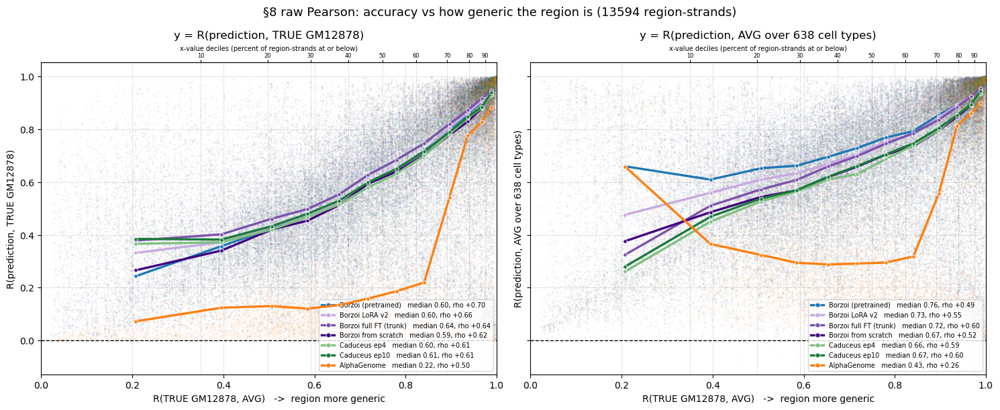

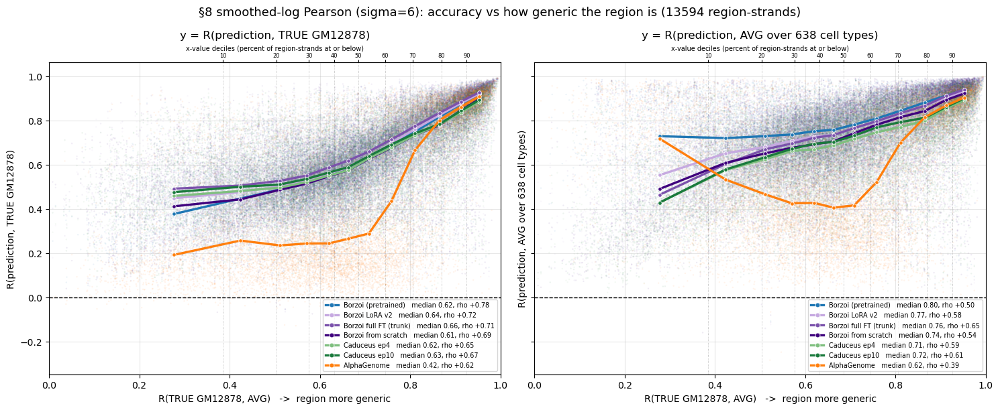

In [9]:
# §8 - accuracy against how generic the region is.
from matplotlib.lines import Line2D

R_AVG_RAW = {k: {s: rowwise_pearson(preds[k][s], AVG[s]) for s in STRANDS} for k in KEYS}
x_raw_g = pool({s: rowwise_pearson(TRUE[s], AVG[s]) for s in STRANDS})
x_sm_g = pool(R_TRUE_AVG)


def running_median(x, y, nbins=12):
    ok = ~np.isnan(x) & ~np.isnan(y)
    xs, ys = x[ok], y[ok]
    edges = np.unique(np.nanpercentile(xs, np.linspace(0, 100, nbins + 1)))
    cx, cy = [], []
    for a, b in zip(edges[:-1], edges[1:]):
        m = (xs >= a) & (xs <= b if b == edges[-1] else xs < b)
        if m.sum() >= 5:
            cx.append(np.median(xs[m]))
            cy.append(np.median(ys[m]))
    return np.array(cx), np.array(cy)


q1g, q2g = np.nanpercentile(x_raw_g[allowed2], [33.3, 66.7])
tert = [(f'specific x<{q1g:.2f}', allowed2 & (x_raw_g < q1g)),
        ('middle', allowed2 & (x_raw_g >= q1g) & (x_raw_g < q2g)),
        (f'generic x>={q2g:.2f}', allowed2 & (x_raw_g >= q2g))]
print(f'x = R(TRUE, AVG) raw: median {np.nanmedian(x_raw_g[allowed2]):.3f}, '
      f'tercile cuts {q1g:.3f} / {q2g:.3f}')
print('x deciles: ' + '  '.join(f'{q}%={v:.2f}' for q, v in zip(
    range(10, 100, 10), np.nanpercentile(x_raw_g[allowed2], np.arange(10, 100, 10)))))
print(f"\n{'arm':<24}" + ''.join(f'{lab:>26}' for lab, _ in tert))
print(f"{'':<24}" + ''.join(f"{'R_true':>13}{'R_avg':>13}" for _ in tert))
for k in KEYS:
    yt, ya = pool(R_RAW[k]), pool(R_AVG_RAW[k])
    print(f'{PRETTY[k]:<24}' + ''.join(
        f'{np.nanmedian(yt[sel]):>13.3f}{np.nanmedian(ya[sel]):>13.3f}' for _, sel in tert))

for tag, x, yd in [
        ('raw Pearson', x_raw_g, {k: (pool(R_RAW[k]), pool(R_AVG_RAW[k])) for k in KEYS}),
        (f'smoothed-log Pearson (sigma={SMOOTH_SIGMA:g})', x_sm_g,
         {k: (pool(R_SM[k]), pool(R_AVG[k])) for k in KEYS})]:
    xa = x[allowed2]
    dec = np.nanpercentile(xa[np.isfinite(xa)], np.arange(10, 100, 10))
    fig, axes = plt.subplots(1, 2, figsize=(15, 6.2), sharex=True, sharey=True)
    for ax, which, ylab in [(axes[0], 0, 'R(prediction, TRUE GM12878)'),
                            (axes[1], 1, f'R(prediction, AVG over {N_CT} cell types)')]:
        handles = []
        for k in KEYS:
            yy = yd[k][which][allowed2]
            ok = ~np.isnan(xa) & ~np.isnan(yy)
            rho = spearmanr(xa[ok], yy[ok])[0]
            ax.scatter(xa, yy, s=3, alpha=0.08, color=COLORS[k], edgecolors='none')
            cx, cy = running_median(xa, yy)
            ax.plot(cx, cy, '-o', color=COLORS[k], lw=2.4, ms=4, markeredgecolor='white',
                    markeredgewidth=0.6, zorder=6)
            # the scatter is alpha 0.08 and unreadable at legend size, so the handle is
            # an opaque copy of the running-median line
            handles.append(Line2D([0], [0], color=COLORS[k], lw=2.4, marker='o', ms=5,
                                  markeredgecolor='white', markeredgewidth=0.6,
                                  label=f'{PRETTY[k]}   median {np.nanmedian(yy):.2f}, '
                                        f'rho {rho:+.2f}'))
        ax.axhline(0, color='k', lw=1, ls='--')
        ax.set_xlim(0, 1)
        for d_ in dec:
            ax.axvline(d_, color='0.55', lw=0.6, ls=':', alpha=0.7, zorder=0)
        top = ax.secondary_xaxis('top')
        top.set_xticks(dec)
        top.set_xticklabels([str(q) for q in range(10, 100, 10)], fontsize=6)
        top.tick_params(length=3, pad=1)
        top.set_xlabel('x-value deciles (percent of region-strands at or below)', fontsize=7,
                       labelpad=2)
        ax.set_xlabel('R(TRUE GM12878, AVG)   ->  region more generic')
        ax.set_ylabel(ylab)
        ax.set_title(f'y = {ylab}', pad=26)
        ax.legend(handles=handles, fontsize=7, loc='lower right')
        ax.grid(alpha=0.3)
    fig.suptitle(f'§8 {tag}: accuracy vs how generic the region is '
                 f'({int(allowed2.sum())} region-strands)', fontsize=13)
    fig.tight_layout()
    plt.show()

## 9. Where Caduceus ep10 gains most over pretrained Borzoi

The qualitative half of `comparing_model4` §5b, retargeted: the four region-strands with the
largest smoothed-log improvement of `cad_ep10` over `borzoi_pre`, drawn as genome-browser tracks
with all six arms, the cross-cell-type average, the observed target, and GENCODE v49 gene models.

**These are selected on the improvement**, so they illustrate what the gain looks like — they are
not evidence that it is typical. §3's win rates and §2's distributions are that evidence. What the
panels are good for is the *kind* of difference: whether the gain comes from suppressing a generic
peak GM12878 does not have, from recovering a peak the baseline misses, or from getting relative
peak heights right.

The gene track includes the immunoglobulin and T-cell-receptor gene biotypes alongside
`protein_coding`. That is not cosmetic: two of the four windows selected below sit in the **IGK
locus** on chr2 (IGKV cluster and IGKC), which in a lymphoblastoid B-cell line is among the most
cell-type-specific transcription in the genome — and with the default `protein_coding`-only filter
those panels would render with an empty gene track.

Borzoi's windows tile the genome with overlap, so the raw top-4 by improvement turns out
to be three shifted views of one chr13 locus plus one other site. The selection below
therefore rejects any window overlapping one already chosen, so the four panels are four
distinct places.

**Track stack, and what it is ordered by.** Each panel reads top to bottom as: stock Borzoi,
AlphaGenome, the three Borzoi finetunes, the two Caduceus arms, the cross-cell-type average, the
observed CAGE truth, and finally **observed GM12878 DNase**, with the two gene panels underneath.
That ordering is local to §9 — it groups each model with the thing it was derived from, which is
what these panels are for; every other section keeps the notebook's `KEYS` order.

DNase is the reason the panels are worth reading twice. It is an **orthogonal assay measured in
these cells**, so where an arm places a peak that the CAGE truth does not have, DNase says whether
the locus is at least open — a generic-looking prediction over closed chromatin is a different
failure from one over an accessible promoter. It is drawn below the truth axis rather than among
the predictions because it is neither a prediction nor in the target's units, and it is
`reference_exempt` so the dashed truth-max line never compares the two scales. It is unstranded, so
the same track appears under both the `+` and `−` panels.

**Coordinate convention, verified rather than assumed.** Bin `j` covers
`[bed.start + 32j, bed.start + 32(j+1))` — the bed interval *is* the 196,608 bp output span, and
the model's 524,288 bp input is that span padded by 163,840 bp each side. The cell below re-derives
this by checking that the top observed CAGE bin lands on an annotated same-strand TSS, and checks
that the competing convention (bin 0 at the start of the *input* span) **fails** the same test —
otherwise passing would prove nothing and the gene track could be silently misaligned.

In [10]:
# §9a - the bin -> genome coordinate gate.
import sys

sys.path.insert(0, '/data1/lesliec/sarthak/caduceus')
from evals.plotting_utils import GeneAnnotation, Track, plot_tracks

TGT_BP = N_BIN * BIN_BP
assert TGT_BP == TGT_SPAN, f'{N_BIN} x {BIN_BP} = {TGT_BP} != bed span {TGT_SPAN}'
# protein_coding alone leaves the immunoglobulin loci blank -- IG genes carry biotypes
# IG_V_gene / IG_C_gene / IG_J_gene / IG_D_gene. That matters here: GM12878 is an
# EBV-transformed lymphoblastoid B-cell line, so IGK/IGH/IGL are among the most
# GM12878-specific loci in the genome and show up in §9's selection.
GENE_TYPES = ('protein_coding', 'IG_V_gene', 'IG_D_gene', 'IG_J_gene', 'IG_C_gene',
              'TR_V_gene', 'TR_D_gene', 'TR_J_gene', 'TR_C_gene')
# Two gene tracks are drawn under every panel. The coding-only view above is the
# conventional one, but it is misleading wherever the transcription is noncoding --
# imprinted domains (14q32 DLK1-DIO3, 15q11 SNRPN) are almost entirely lncRNA, miRNA
# and snoRNA, so a coding-only track renders them as empty desert. `ann` stays the
# coding annotation: the coordinate gate below is calibrated on protein-coding TSSs.
ann = GeneAnnotation(gene_types=GENE_TYPES)
ann_all = GeneAnnotation(gene_types=None)          # every biotype GENCODE lists
GENE_TRACKS = [('Protein-coding\n+ IG/TR', ann), ('All genes', ann_all)]
print(f'annotation rows: coding {len(ann.df):,}  (biotypes: {", ".join(GENE_TYPES)})')
print(f'                 all biotypes {len(ann_all.df):,}')


def region_coords(i):
    a = int(test_bed.start[i])
    return str(test_bed.chrom[i]), a, a + TGT_BP


def tss_dist(offset, n=40, seed=0):
    # distance from the top observed + strand CAGE bin to the nearest annotated + TSS
    rng = np.random.default_rng(seed)
    out = []
    for i in rng.choice(np.flatnonzero(allowed), n, replace=False):
        chrom, a, _ = region_coords(i)
        a += offset
        v = TRUE['plus'][i]
        j = int(np.argmax(v))
        if v[j] <= 0:
            continue
        pos = a + (j + 0.5) * BIN_BP
        t = [r['tx_start'] if r['strand'] == '+' else r['tx_end']
             for r in ann.query(chrom, a, a + TGT_BP) if r['strand'] == '+']
        if t:
            out.append(float(np.min(np.abs(np.asarray(t) - pos))))
    return np.asarray(out)


PAD_BP = (SEQ_LEN - TGT_SPAN) // 2
d_ok, d_bad = tss_dist(0), tss_dist(-PAD_BP)
print(f'top + CAGE bin -> nearest + TSS')
print(f'  bin0 = bed.start                    median {np.median(d_ok):>9,.0f} bp   '
      f'within 1 kb {np.mean(d_ok < 1000):>4.0%}   (n={len(d_ok)})')
print(f'  bin0 = bed.start - {PAD_BP:,} (input)  median {np.median(d_bad):>9,.0f} bp   '
      f'within 1 kb {np.mean(d_bad < 1000):>4.0%}   (n={len(d_bad)})')
assert np.median(d_ok) < 1000 < np.median(d_bad), (
    'GATE FAILED: the bin->genome mapping does not place CAGE peaks on TSSs, or the wrong '
    'convention passes too -- the gene track would be misaligned')
print('coordinate gate passed: the bed interval is the output span, and the control fails.')

# --- observed GM12878 DNase, for the track panels ---------------------------------
# The panels below carry it as a bottom track: an orthogonal assay, measured in these
# cells, sitting between the CAGE truth and the gene models. It is unstranded, so the
# same array is drawn under both the + and the - panels.
# §12 loads and gates this again for its own analysis. That duplication is deliberate:
# §1 states nothing in this notebook is guarded behind `if ... not in globals()`, so
# each section stands alone. ~170 MB.
DNASE = np.load(f'{BORZOI}/GM12878DNase.npz')['test'][:, :, 0]
assert DNASE.shape == (N_REG, N_BIN), f'DNase is {DNASE.shape}, expected {(N_REG, N_BIN)}'
_wi9 = pd.read_csv(f'{BORZOI}/GM12878_borzoi_window_index.tsv', sep='\t', dtype={'chrom': str})
_wt9 = _wi9[_wi9.npz_split == 'test'].reset_index(drop=True)
assert len(_wt9) == N_REG \
    and (_wt9.start.to_numpy() == test_bed.start.to_numpy()).all() \
    and (_wt9.chrom.astype(str).to_numpy() == test_bed.chrom.astype(str).to_numpy()).all(), \
    'GATE FAILED: the DNase npz row order is not the bed fold3 row order'
DNASE_COLOR = '#8c564b'          # no arm wears brown
print(f'DNase on the fold3 grid, row order gated: {DNASE.shape}, mean {DNASE.mean():.4f} '
      f'(unstranded -- the same track under both strands)')

# Track stack order for §9's panels, which is NOT the arm order used everywhere else:
# base model, then AlphaGenome, then the finetunes of the base, then the Caduceus arms,
# so the panels read outward from stock Borzoi. Every other section keeps KEYS order.
TRACK_ORDER = ['borzoi_pre', 'alphagenome', 'borzoi_lora', 'borzoi_trunk', 'borzoi_scratch',
               'cad_ep4', 'cad_ep10']
assert sorted(TRACK_ORDER) == sorted(KEYS), 'TRACK_ORDER must be a permutation of KEYS'

annotation rows: coding 3,223,901  (biotypes: protein_coding, IG_V_gene, IG_D_gene, IG_J_gene, IG_C_gene, TR_V_gene, TR_D_gene, TR_J_gene, TR_C_gene)
                 all biotypes 4,181,314


top + CAGE bin -> nearest + TSS
  bin0 = bed.start                    median       331 bp   within 1 kb  53%   (n=17)
  bin0 = bed.start - 163,840 (input)  median    46,473 bp   within 1 kb   0%   (n=17)
coordinate gate passed: the bed interval is the output span, and the control fails.
DNase on the fold3 grid, row order gated: (6888, 6144), mean 0.0980 (unstranded -- the same track under both strands)


2 overlapping windows skipped to keep the 4 examples at distinct loci

rank  region strand                 chrom:start-end       d   ep10    pre   genes near the strongest observed bins


1       5594  minus     chr13:45,570,598-45,767,206  +0.808  0.849  0.042   LINC01055, CBY2, AKR1B1P4


2       2836  minus      chr2:88,908,451-89,105,059  +0.683  0.711  0.028   IGKV7-3, PGBD4P5, IGKV2-4


3       4357   plus    chr6:147,842,040-148,038,648  +0.672  0.882  0.209   ENSG00000234675, ENSG00000227681, ENSG00000287976


4       1275  minus      chr2:88,662,586-88,859,194  +0.632  0.834  0.202   EIF2AK3, RPIA, ENSG00000302526


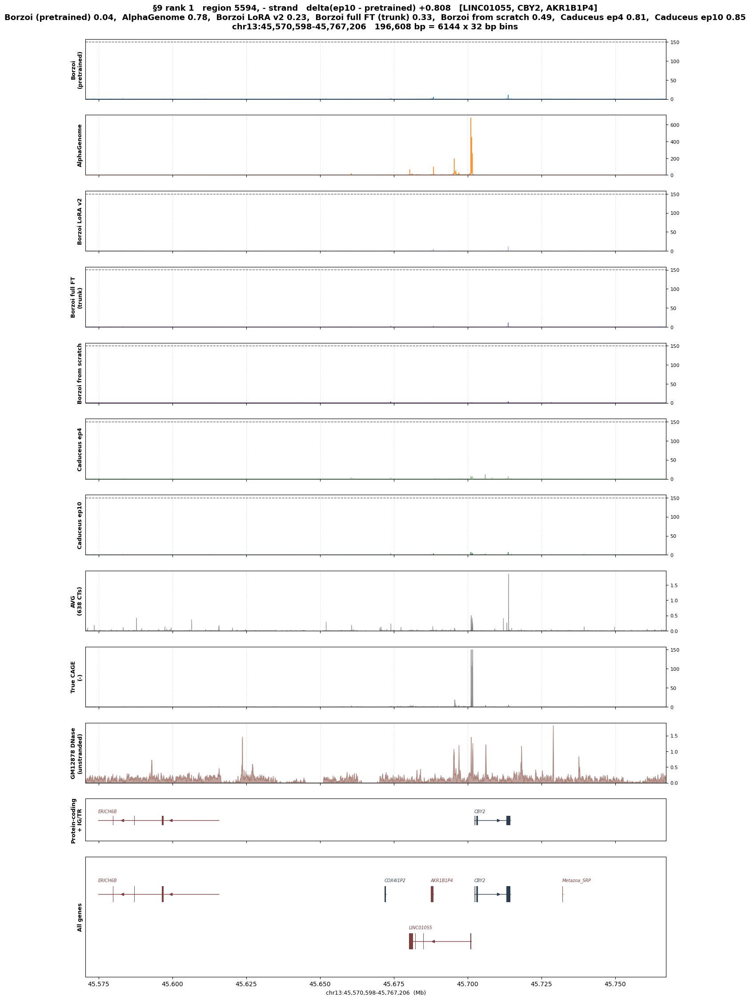

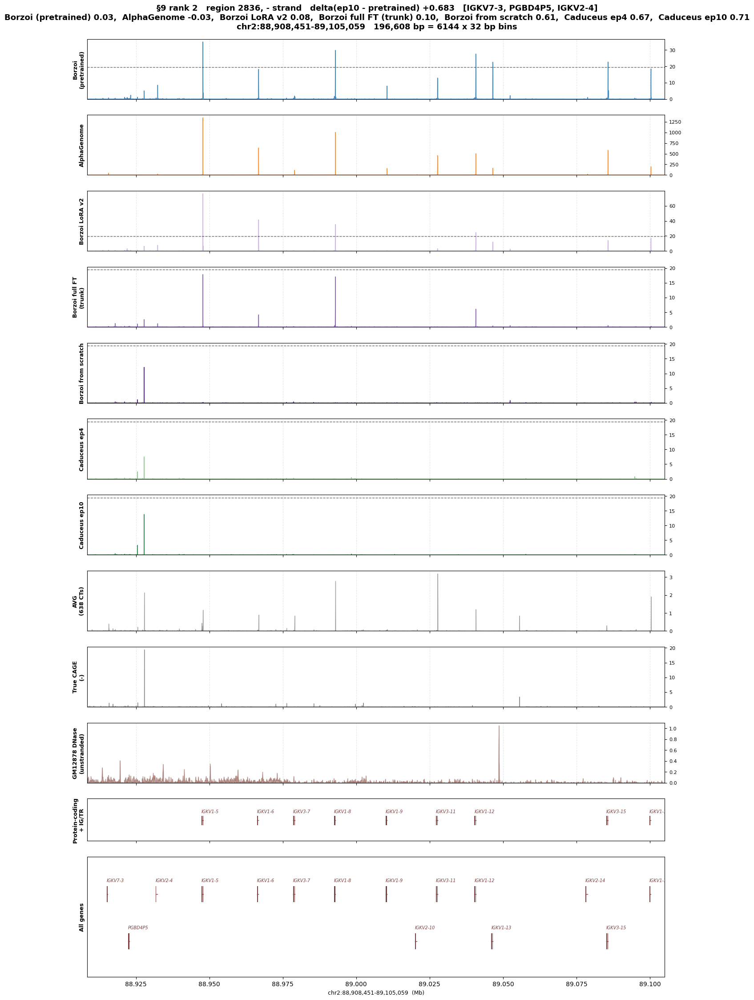

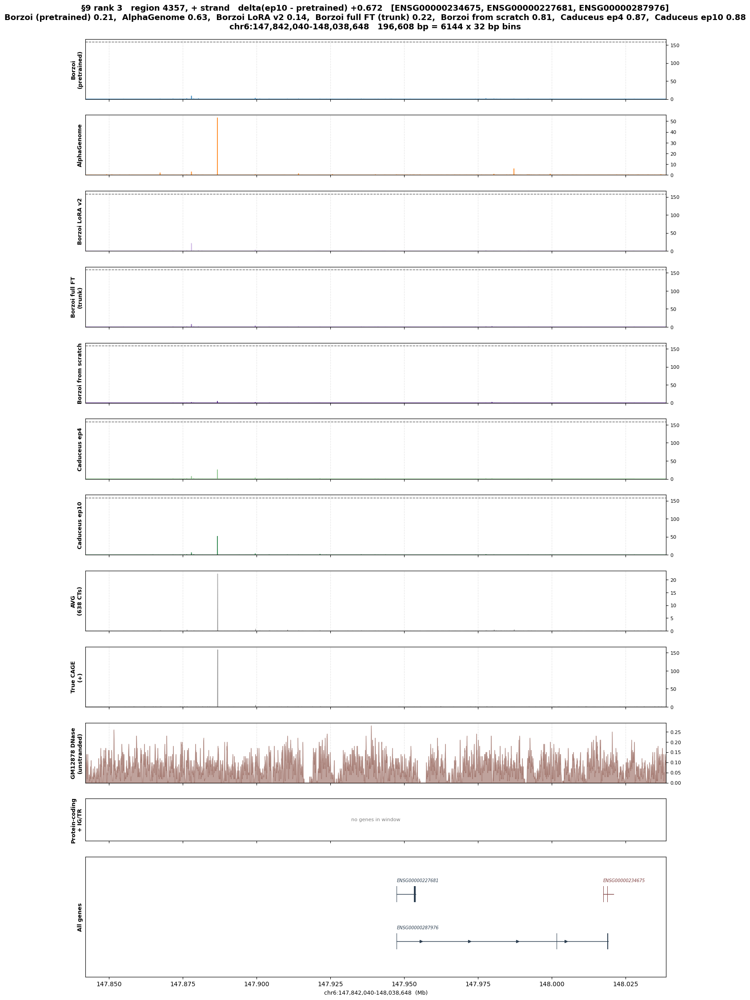

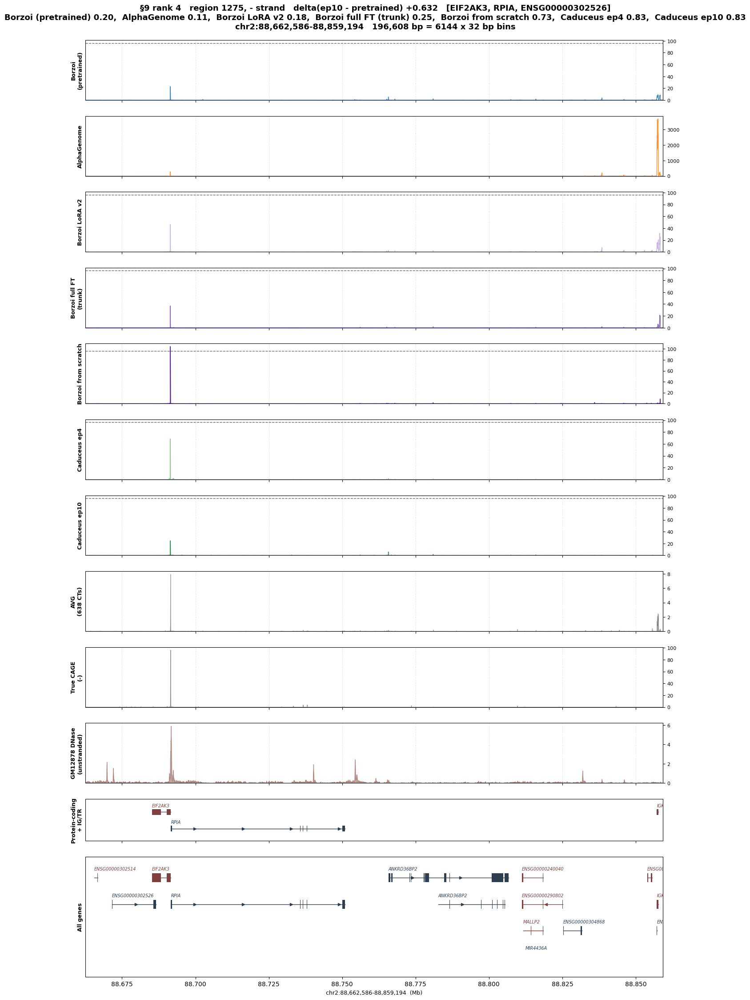

In [11]:
# §9b - the four largest cad_ep10 gains, at four DISTINCT loci.
GAIN_KEY, BASE_KEY, N_SHOW = 'cad_ep10', 'borzoi_pre', 4

delta = pool(R_SM[GAIN_KEY]) - pool(R_SM[BASE_KEY])
order = np.argsort(np.where(allowed2 & np.isfinite(delta), delta, -np.inf))[::-1]

# Borzoi's windows tile the genome with overlap, so a raw top-N is dominated by several
# shifted views of the same locus (the unfiltered top 4 here is 3 windows of one chr13
# site plus one other). Accept a candidate only if it does not overlap one already taken.
picks, taken, skipped = [], [], 0
for t in order:
    i, st = (int(t), 'plus') if t < N_REG else (int(t) - N_REG, 'minus')
    chrom, a, b = region_coords(i)
    if any(c == chrom and a < eb and b > ea for c, ea, eb in taken):
        skipped += 1
        continue
    taken.append((chrom, a, b))
    picks.append((i, st, float(delta[t])))
    if len(picks) == N_SHOW:
        break
print(f'{skipped} overlapping windows skipped to keep the {N_SHOW} examples at distinct loci')


def top_genes(chrom, a, b, values, n=3):
    # gene names whose TSS sits nearest the strongest observed bins in this window
    recs = ann_all.query(chrom, a, b, collapse=True)
    if not recs:
        return '-'
    peaks = a + (np.argsort(values)[-5:] + 0.5) * BIN_BP
    scored = sorted((float(np.min(np.abs(peaks - (r['tx_start'] if r['strand'] == '+'
                                                  else r['tx_end'])))), r['gene_name'])
                    for r in recs)
    return ', '.join(list(dict.fromkeys(g for _, g in scored))[:n])


print(f"\n{'rank':<5}{'region':>7}{'strand':>7}{'chrom:start-end':>32}"
      f"{'d':>8}{'ep10':>7}{'pre':>7}   genes near the strongest observed bins")
for r, (i, st, d) in enumerate(picks):
    chrom, a, b = region_coords(i)
    print(f'{r + 1:<5}{i:>7}{st:>7}{f"{chrom}:{a:,}-{b:,}":>32}'
          f'{d:>+8.3f}{R_SM[GAIN_KEY][st][i]:>7.3f}{R_SM[BASE_KEY][st][i]:>7.3f}   '
          f'{top_genes(chrom, a, b, TRUE[st][i])}')

for r, (i, st, d) in enumerate(picks):
    chrom, a, b = region_coords(i)
    common = dict(chrom=chrom, start=a, bin_size=BIN_BP)
    # alphagenome is reference_exempt for the same reason AVG is: it is not in the target's
    # units, so the dashed truth-max line and the truth-max floor on its axis would compare
    # two different scales. Its own axis still auto-scales, so its shape stays readable.
    tracks = [Track(preds[k][st][i], name=PRETTY[k].replace(' (', '\n('),
                    color=COLORS[k], reference_exempt=(k == AG_KEY), **common)
              for k in TRACK_ORDER]
    tracks.append(Track(AVG[st][i], name=f'AVG\n({N_CT} CTs)', color='#111111', style='fill',
                        alpha=0.35, reference_exempt=True, **common))
    sign = '+' if st == 'plus' else '-'
    truth = Track(TRUE[st][i], name=f'True CAGE\n({sign})', is_truth=True, **common)
    # DNase goes BELOW the truth axis, next to the gene models: it is a different assay in
    # different units, so it is reference_exempt and is not read as another prediction.
    dnase = Track(DNASE[i], name='GM12878 DNase\n(unstranded)', color=DNASE_COLOR,
                  style='fill', alpha=0.55, reference_exempt=True, **common)
    title = (f'§9 rank {r + 1}   region {i}, {sign} strand   '
             f'delta(ep10 - pretrained) {d:+.3f}   '
             f'[{top_genes(chrom, a, b, TRUE[st][i])}]\n'
             + ',  '.join(f'{PRETTY[k]} {R_SM[k][st][i]:.2f}' for k in TRACK_ORDER)
             + f'\n{chrom}:{a:,}-{b:,}   {TGT_BP:,} bp = {N_BIN} x {BIN_BP} bp bins')
    fig, axes = plot_tracks(tracks, genes=GENE_TRACKS, region=(chrom, a, b), ground_truth=truth,
                            bottom_tracks=[dnase], collapse_genes=True, title=title,
                            gene_track_ratio=(0.7, 2.0),
                            figsize=(14, 1.55 * (len(tracks) + 3) + 5.5))
    plt.show()

## 9c. More of the same — ranks 5-12 of the `cad_ep10` gain over pretrained Borzoi

§9b showed four. The pattern these panels are being asked to carry is visual and locus-scale — a
baseline putting peaks where the observed track has none — so four hand-picked examples cannot
show whether it repeats. This continues the identical ranking to rank 12, with the same
distinct-loci rule and the same track stack, so §9b and §9c are one series of twelve.

The §11 selection caveat still applies and is not weakened by showing more: these loci are
*selected on the improvement*, so they show what the gain looks like, not how often it happens.


7 overlapping windows skipped to keep 12 examples at distinct loci

rank  region strand                 chrom:start-end       d   gain   base   genes near the strongest observed bins
5       4256  minus       chr19:8,861,863-9,058,471  +0.604  0.804  0.200   MUC16, BOLA3P2


6       1729   plus    chr1:143,577,971-143,774,579  +0.597  0.866  0.269   PFN1P12, RNVU1-17, ENSG00000294936
7       5148   plus      chr8:30,240,486-30,437,094  +0.597  0.874  0.277   ENSG00000293293, TUBBP1, PPIAP84


8       1718  minus     chr13:63,664,505-63,861,113  +0.565  0.907  0.342   PPP1R2P10, ENSG00000296525, LINC00355
9       3304  minus      chr8:40,763,508-40,960,116  +0.557  0.698  0.141   ENSG00000301921, ZMAT4, ENSG00000254383


10       403  minus      chr5:26,825,072-27,021,680  +0.552  0.753  0.202   CDH9
11      2314   plus     chr13:48,619,324-48,815,932  +0.542  0.680  0.138   PSME2P2, ENSG00000306347, ENSG00000306361


12      2065  minus    chr6:148,874,673-149,071,281  +0.542  0.797  0.255   UST-AS2, UST-AS1, UST


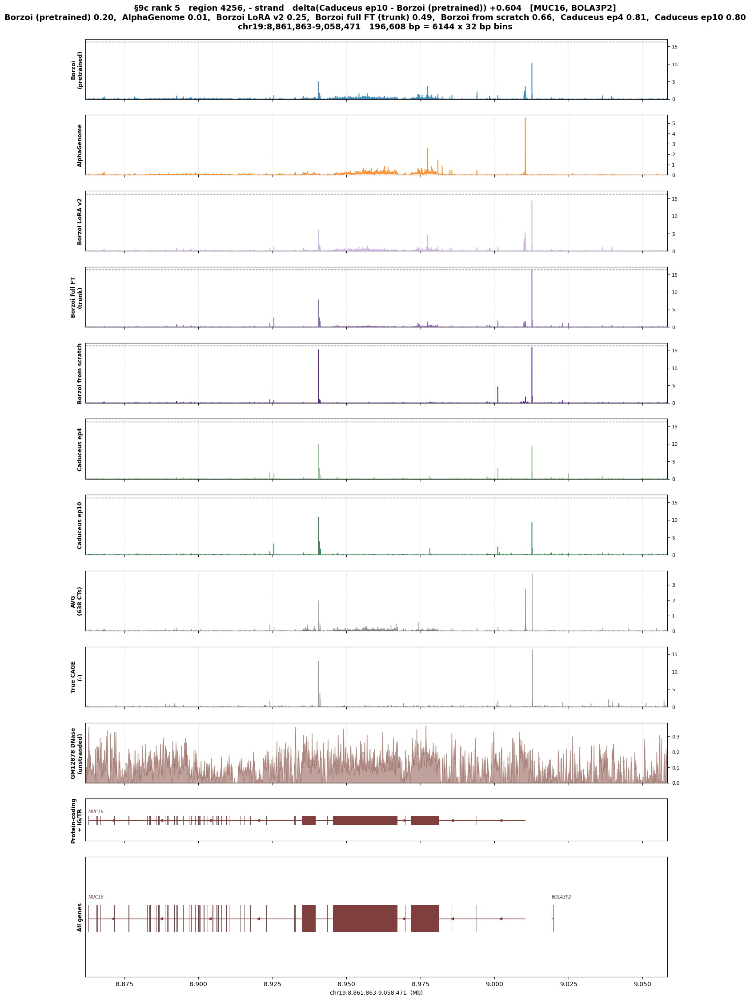

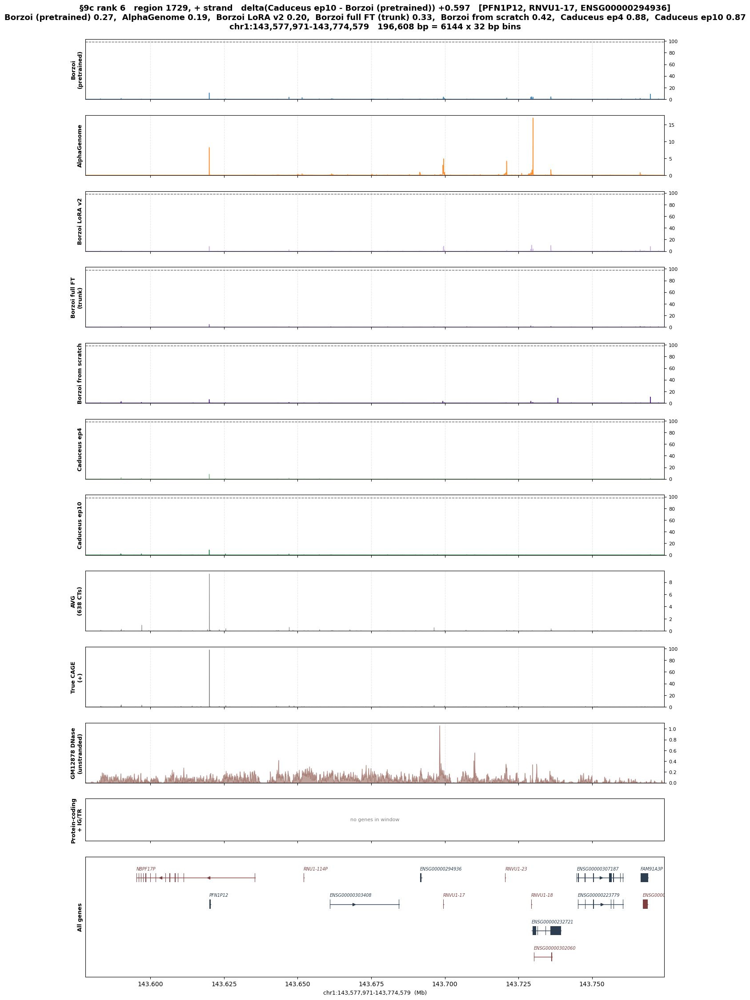

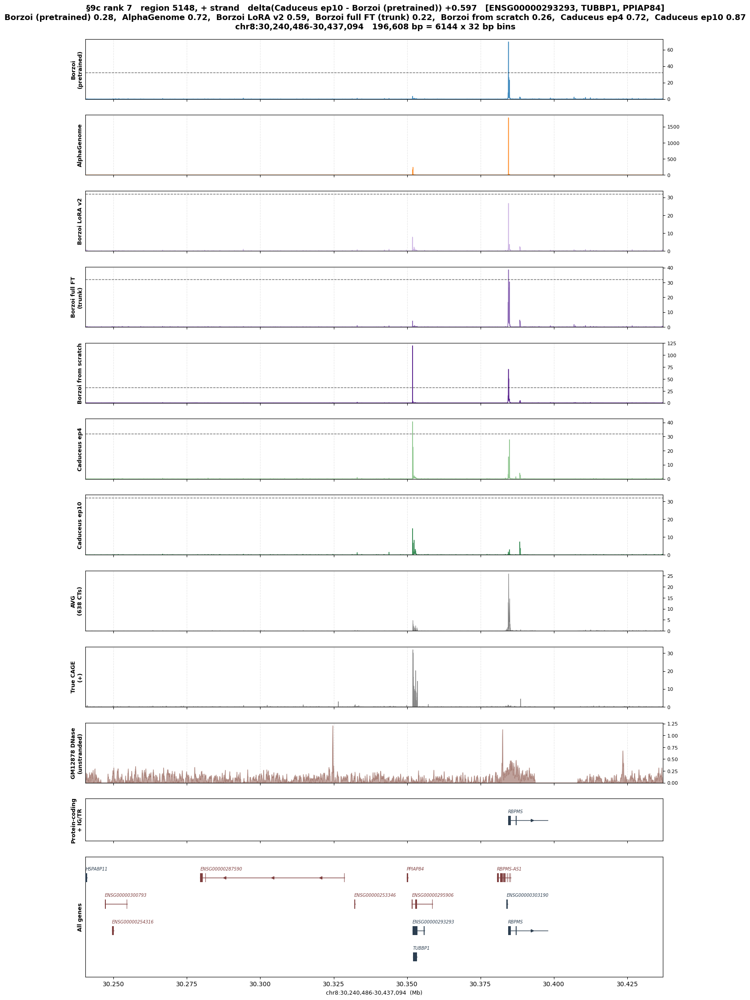

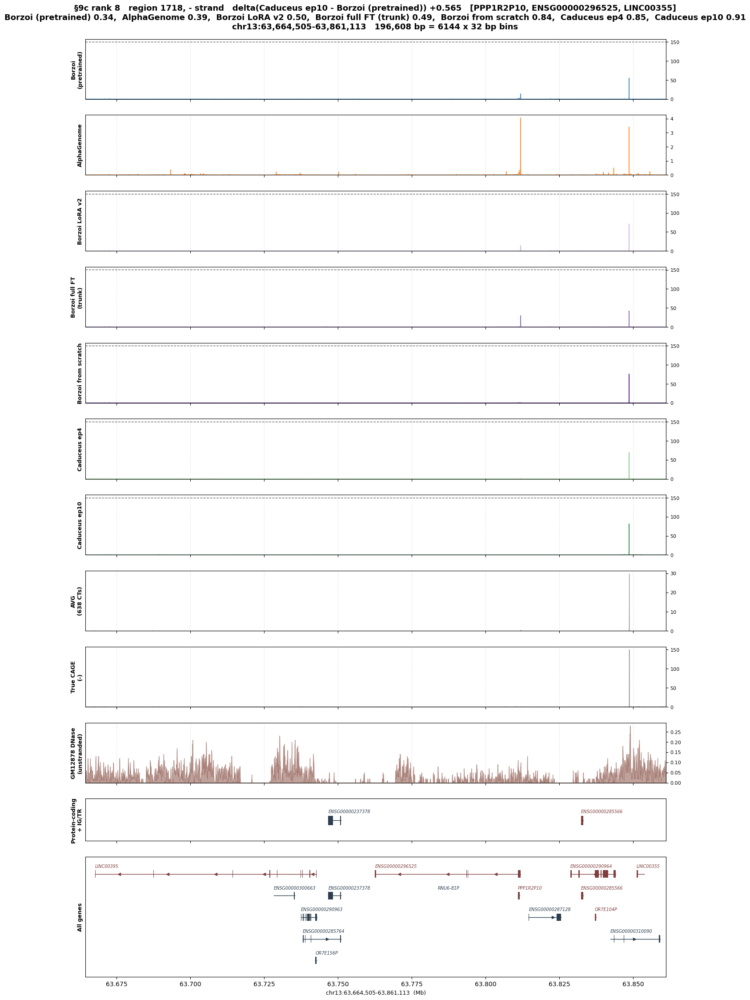

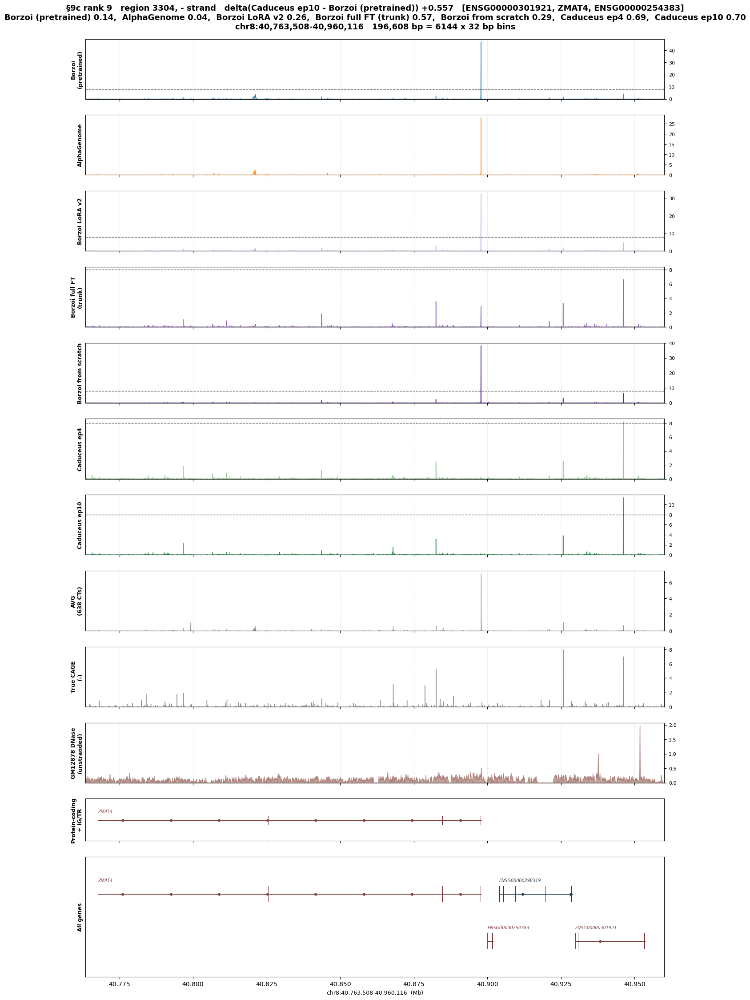

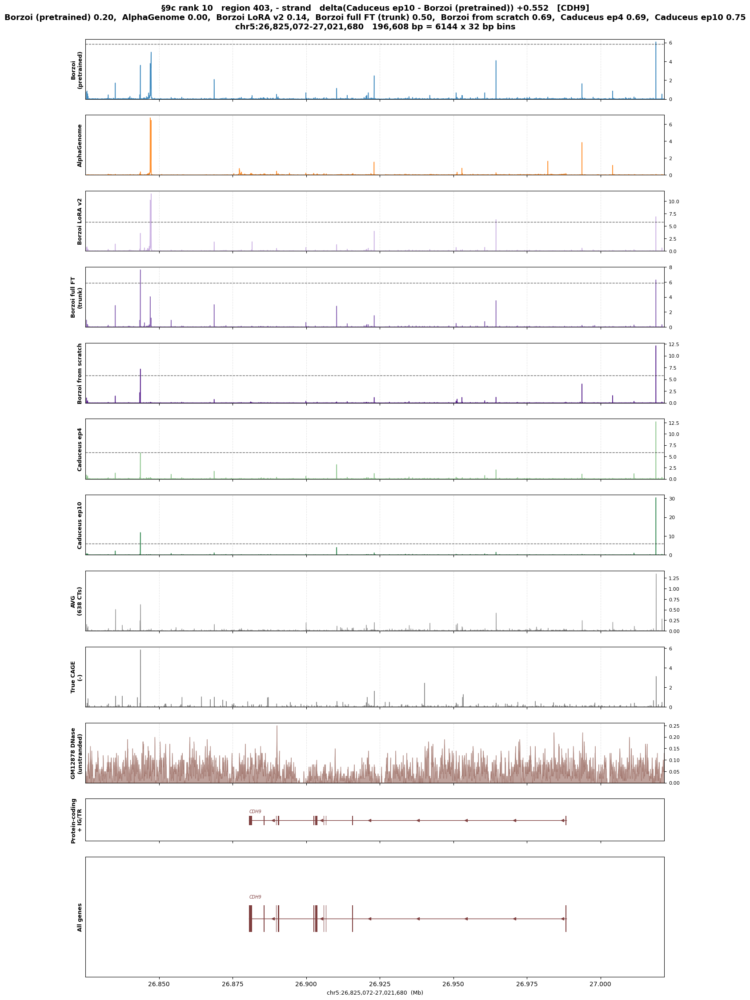

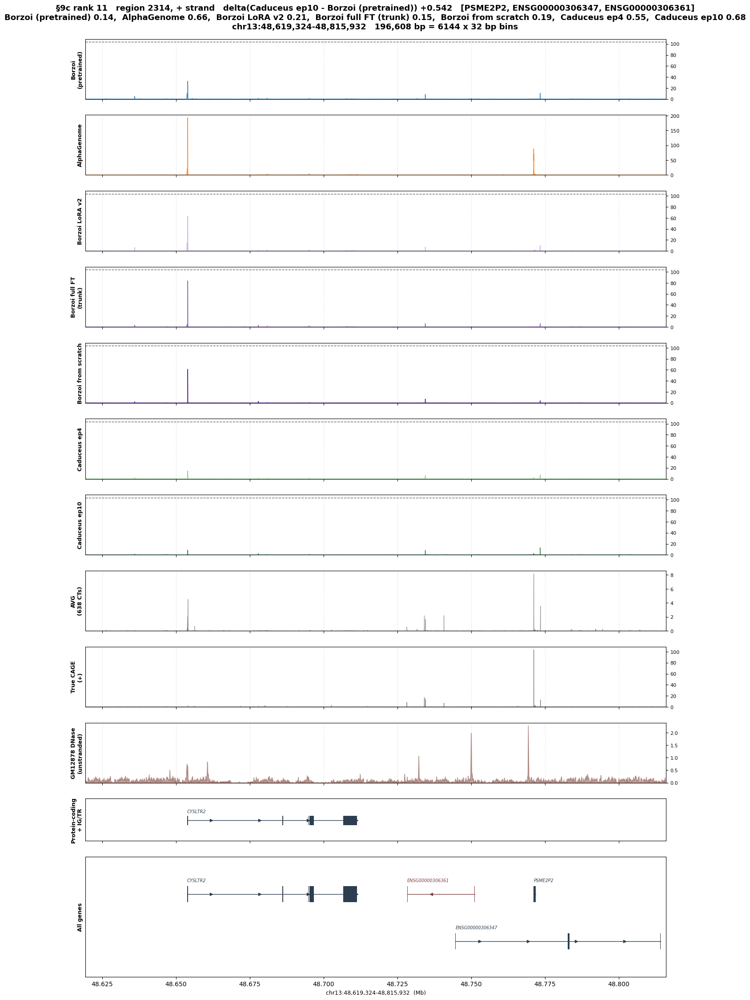

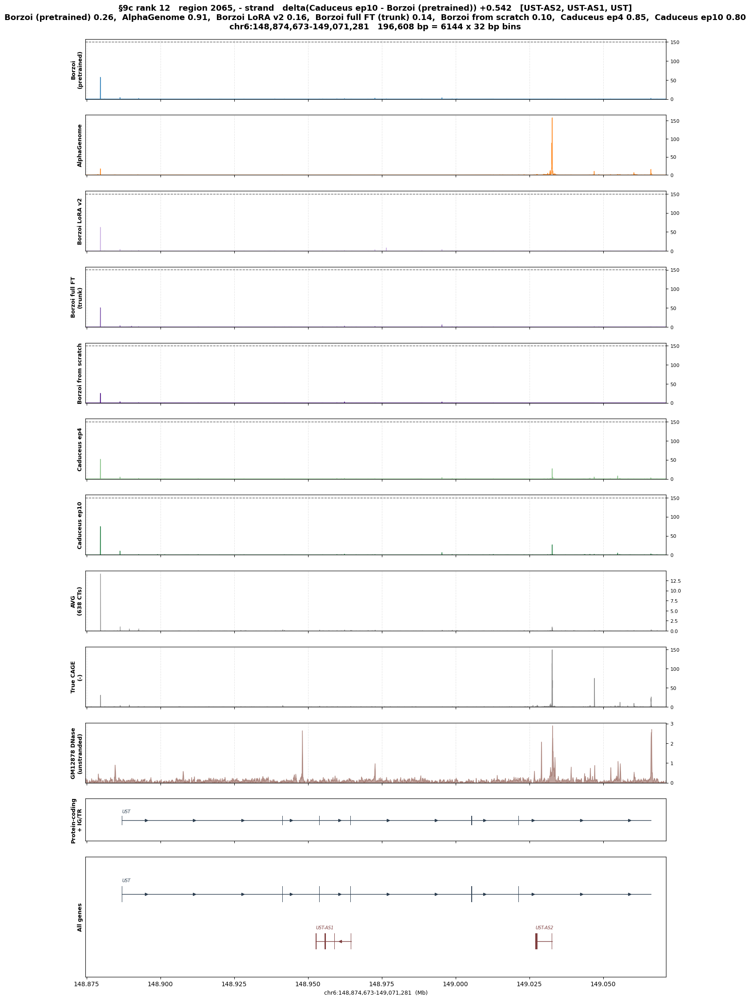

In [12]:
# §9c - ranks 5-12 of the same ranking as §9b, plus the two helpers §9d reuses.
# Depends on §9a/§9b for `ann`, `region_coords` and `top_genes`.


def pick_loci(gain_key, base_key, n_show, skip_first=0):
    """Top region-strands by smoothed-log gain of `gain_key` over `base_key`, one per locus.

    Borzoi's windows tile the genome with overlap, so a raw top-N is dominated by several
    shifted views of the same locus; a candidate is accepted only if it does not overlap one
    already taken (the rule §9b uses). `skip_first` drops that many accepted loci from the
    front, so §9c continues where §9b stopped instead of repeating it.
    """
    delta = pool(R_SM[gain_key]) - pool(R_SM[base_key])
    order = np.argsort(np.where(allowed2 & np.isfinite(delta), delta, -np.inf))[::-1]
    picks, taken, skipped = [], [], 0
    for t in order:
        i, st = (int(t), 'plus') if t < N_REG else (int(t) - N_REG, 'minus')
        chrom, a, b = region_coords(i)
        if any(c == chrom and a < eb and b > ea for c, ea, eb in taken):
            skipped += 1
            continue
        taken.append((chrom, a, b))
        picks.append((i, st, float(delta[t])))
        if len(picks) == skip_first + n_show:
            break
    print(f'{skipped} overlapping windows skipped to keep {len(picks)} examples at distinct loci')
    return picks[skip_first:]


def print_picks(picks, gain_key, base_key, start_rank=1):
    print(f"\n{'rank':<5}{'region':>7}{'strand':>7}{'chrom:start-end':>32}"
          f"{'d':>8}{'gain':>7}{'base':>7}   genes near the strongest observed bins")
    for r, (i, st, d) in enumerate(picks):
        chrom, a, b = region_coords(i)
        print(f'{r + start_rank:<5}{i:>7}{st:>7}{f"{chrom}:{a:,}-{b:,}":>32}'
              f'{d:>+8.3f}{R_SM[gain_key][st][i]:>7.3f}{R_SM[base_key][st][i]:>7.3f}   '
              f'{top_genes(chrom, a, b, TRUE[st][i])}')


def show_locus(rank, i, st, d, gain_key, base_key, tag):
    """The §9b panel, with the baseline named in the title so §9d is not misread as §9c."""
    chrom, a, b = region_coords(i)
    common = dict(chrom=chrom, start=a, bin_size=BIN_BP)
    # alphagenome is reference_exempt for the same reason AVG is: it is not in the target's
    # units, so the dashed truth-max line and the truth-max floor on its axis would compare
    # two different scales. Its own axis still auto-scales, so its shape stays readable.
    tracks = [Track(preds[k][st][i], name=PRETTY[k].replace(' (', '\n('),
                    color=COLORS[k], reference_exempt=(k == AG_KEY), **common)
              for k in TRACK_ORDER]
    tracks.append(Track(AVG[st][i], name=f'AVG\n({N_CT} CTs)', color='#111111', style='fill',
                        alpha=0.35, reference_exempt=True, **common))
    sign = '+' if st == 'plus' else '-'
    truth = Track(TRUE[st][i], name=f'True CAGE\n({sign})', is_truth=True, **common)
    dnase = Track(DNASE[i], name='GM12878 DNase\n(unstranded)', color=DNASE_COLOR,
                  style='fill', alpha=0.55, reference_exempt=True, **common)
    title = (f'{tag} rank {rank}   region {i}, {sign} strand   '
             f'delta({PRETTY[gain_key]} - {PRETTY[base_key]}) {d:+.3f}   '
             f'[{top_genes(chrom, a, b, TRUE[st][i])}]\n'
             + ',  '.join(f'{PRETTY[k]} {R_SM[k][st][i]:.2f}' for k in TRACK_ORDER)
             + f'\n{chrom}:{a:,}-{b:,}   {TGT_BP:,} bp = {N_BIN} x {BIN_BP} bp bins')
    fig, axes = plot_tracks(tracks, genes=GENE_TRACKS, region=(chrom, a, b), ground_truth=truth,
                            bottom_tracks=[dnase], collapse_genes=True, title=title,
                            gene_track_ratio=(0.7, 2.0),
                            figsize=(14, 1.55 * (len(tracks) + 3) + 5.5))
    plt.show()


N_MORE = 8
more = pick_loci(GAIN_KEY, BASE_KEY, N_MORE, skip_first=N_SHOW)
print_picks(more, GAIN_KEY, BASE_KEY, start_rank=N_SHOW + 1)

for r, (i, st, d) in enumerate(more):
    show_locus(r + N_SHOW + 1, i, st, d, GAIN_KEY, BASE_KEY, '§9c')


## 9d. The same ranking, against the full finetune instead of stock Borzoi

§9b/§9c rank against pretrained Borzoi, which never saw GM12878. That leaves every panel open to
the reading "the baseline is simply off-cell-type", which is not the claim being made.

`borzoi_trunk` closes that: it is the most accurate arm in §10 (`R_true` 0.658, the highest of the
six), it is the same architecture as the baseline, and it was finetuned on this exact target with
this exact input context. Loci where `cad_ep10` still beats it by a large margin cannot be
explained by the baseline predicting the wrong cell type, so they are the harder cases — and the
ones worth looking at if the pattern is meant to be about what the arms put where, rather than
about which cell type they were trained on.

Selection caveat as in §9c: ranked on the improvement, so this is what the gain looks like, not how
often it happens.


6 overlapping windows skipped to keep 8 examples at distinct loci

rank  region strand                 chrom:start-end       d   gain   base   genes near the strongest observed bins
1       2457  minus      chr2:75,287,530-75,484,138  +0.789  0.871  0.082   ENSG00000306791, GAPDHP57, EVA1A


2       5004  minus       chr19:6,845,770-7,042,378  +0.703  0.825  0.122   ENSG00000290427, ENSG00000268845, ADGRE4P
3       4357   plus    chr6:147,842,040-148,038,648  +0.664  0.882  0.217   ENSG00000234675, ENSG00000227681, ENSG00000287976


4       2065  minus    chr6:148,874,673-149,071,281  +0.659  0.797  0.138   UST-AS2, UST-AS1, UST
5       2369   plus     chr13:43,013,602-43,210,210  +0.655  0.867  0.212   DNAJC15, ENSG00000298172, LINC00400


6       5148   plus      chr8:30,240,486-30,437,094  +0.655  0.874  0.219   ENSG00000293293, TUBBP1, PPIAP84
7       2836  minus      chr2:88,908,451-89,105,059  +0.616  0.711  0.095   IGKV7-3, PGBD4P5, IGKV2-4


8       2062  minus     chr17:82,831,766-83,028,374  +0.593  0.822  0.228   TBCD, B3GNTL1, ENSG00000262339


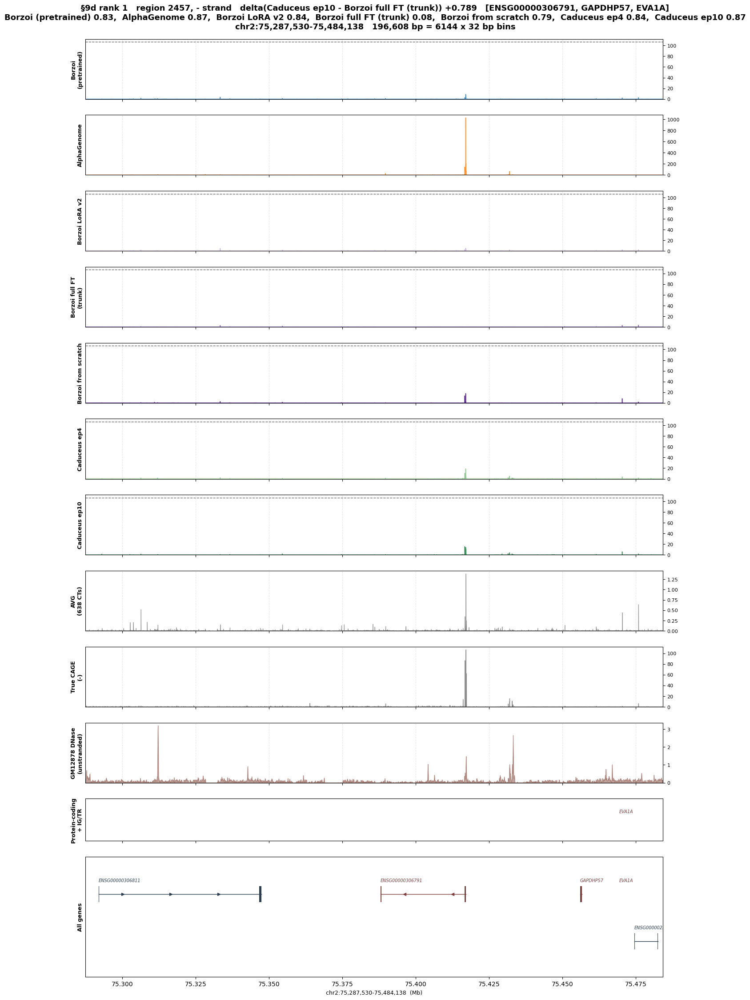

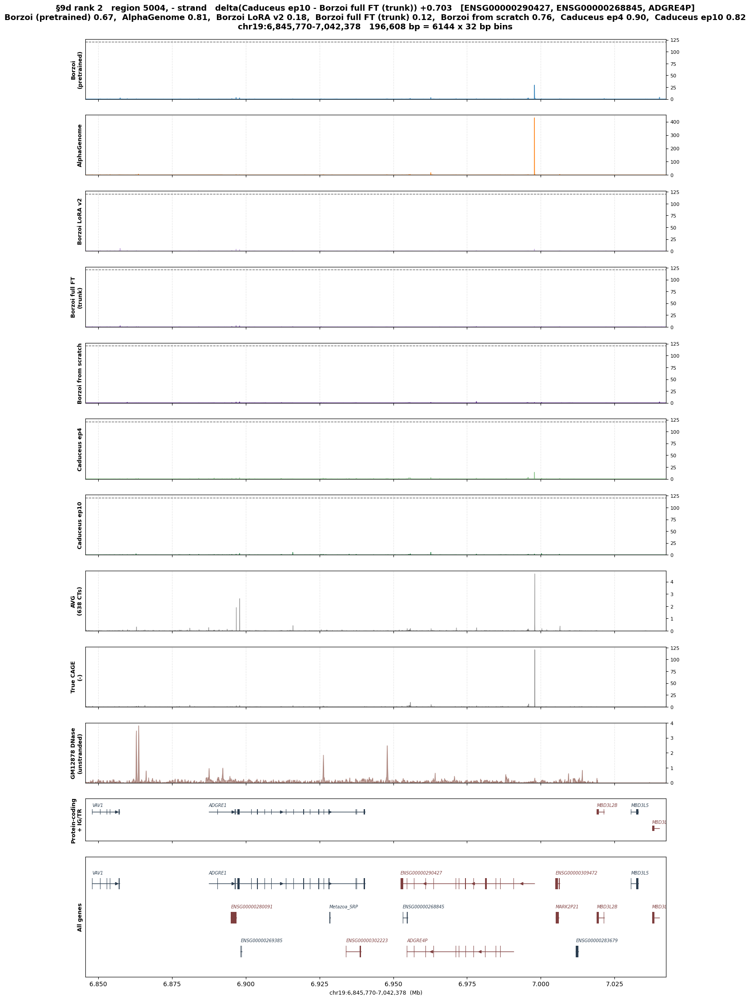

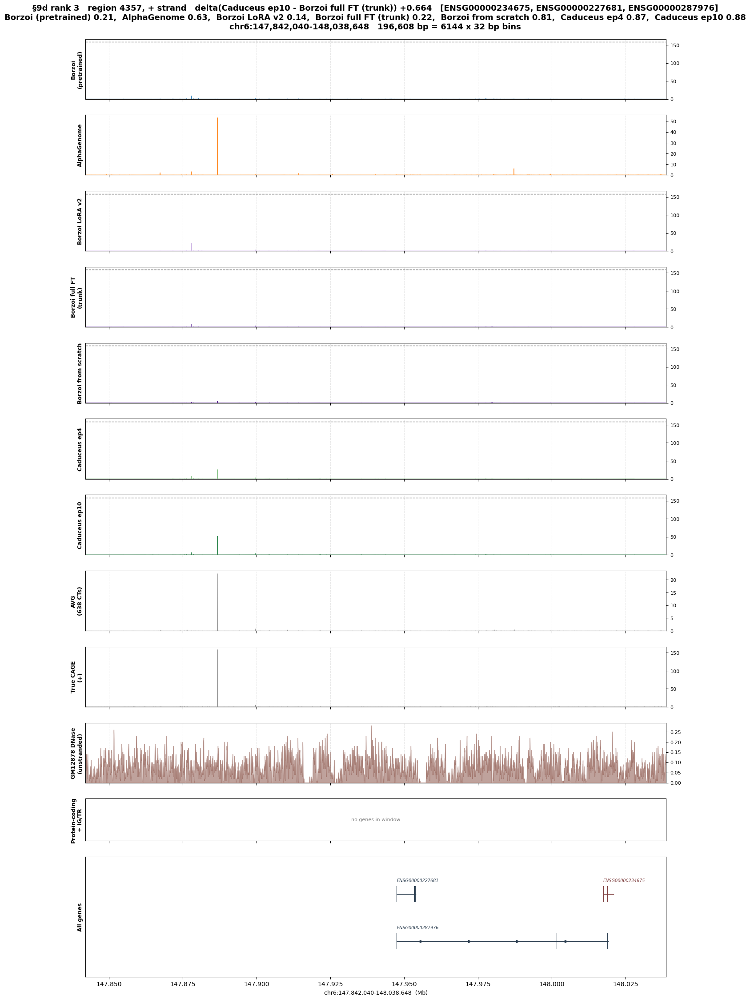

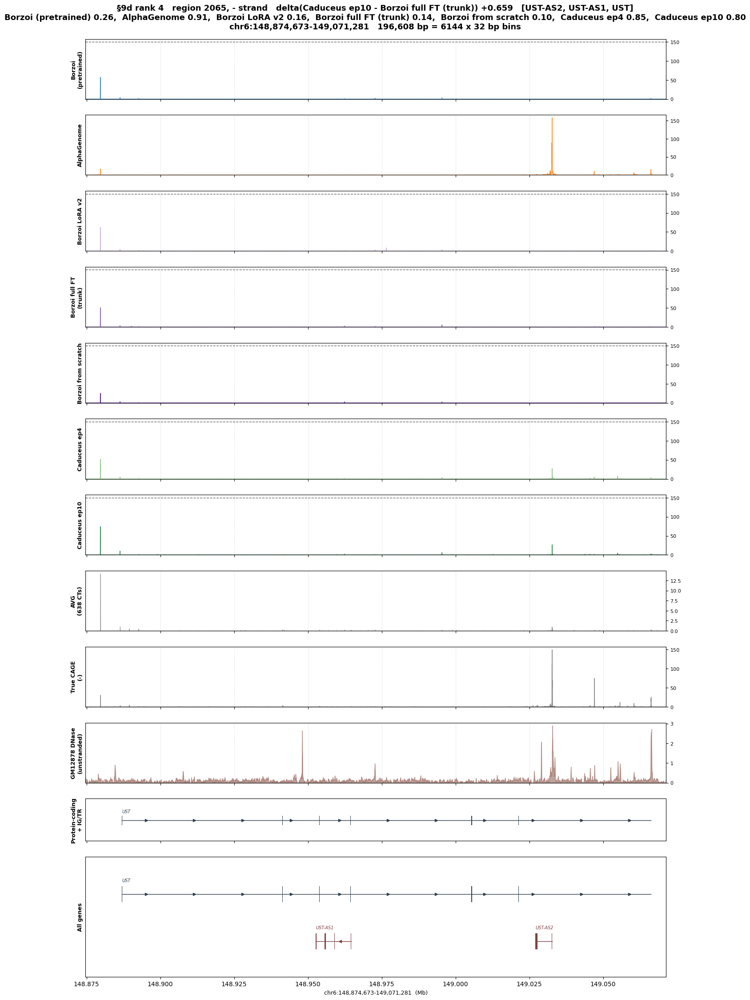

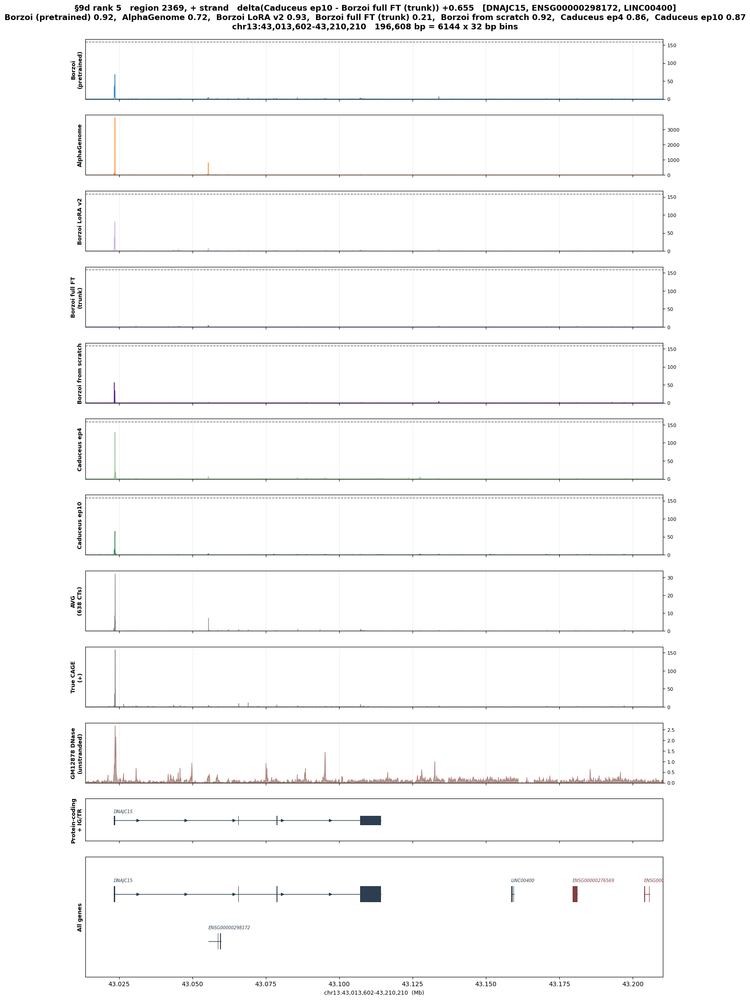

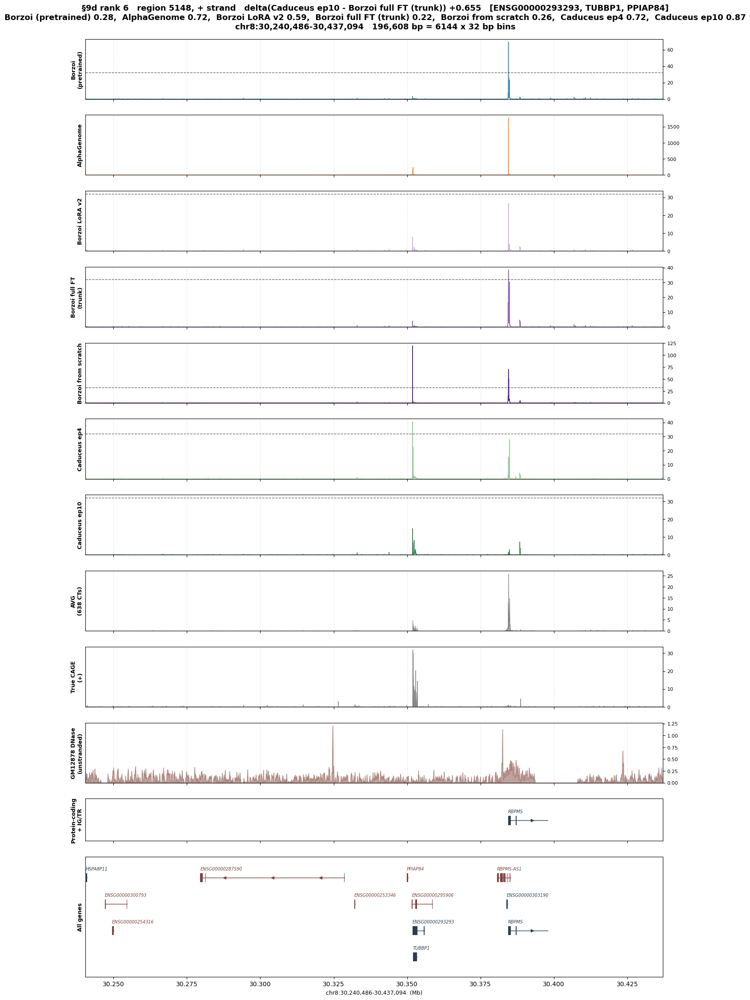

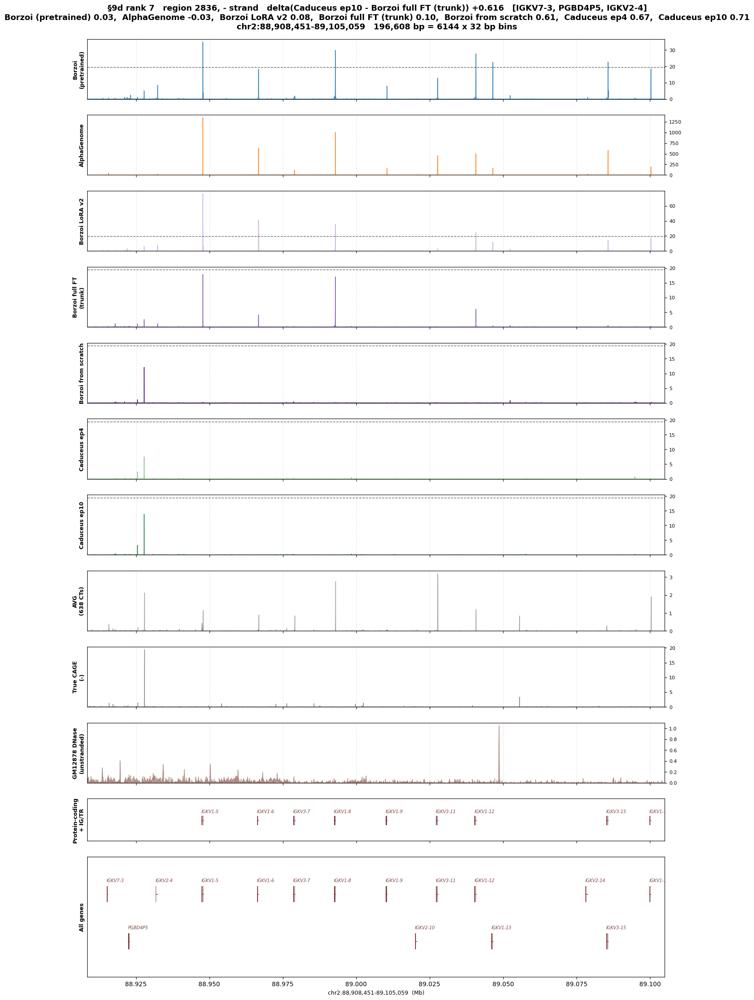

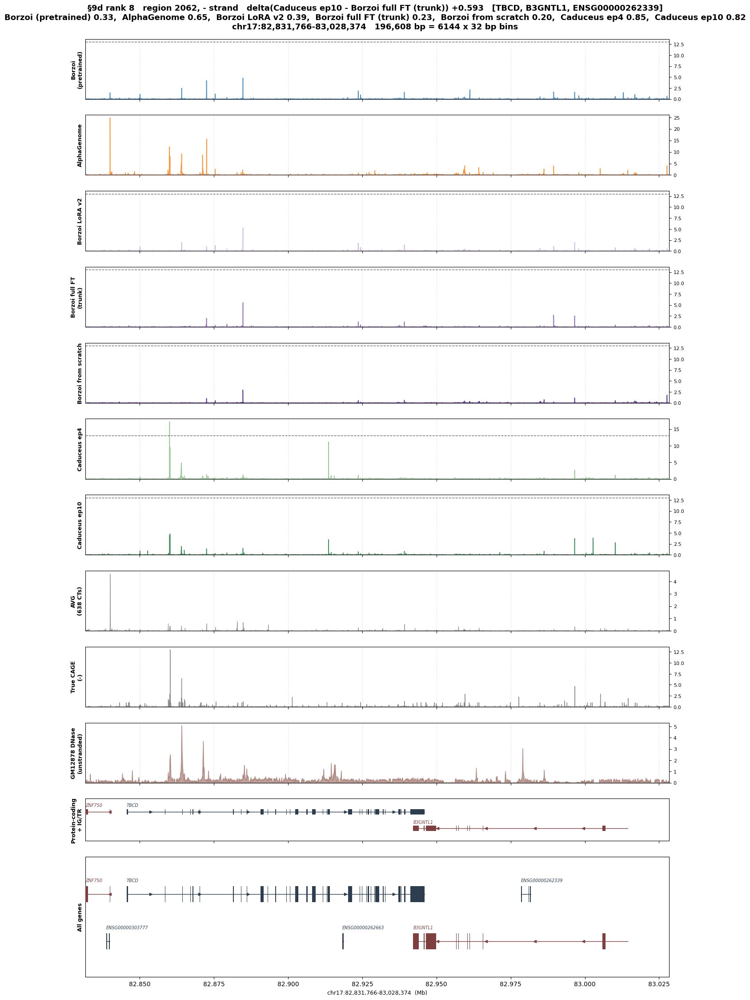

In [13]:
# §9d - top gains of cad_ep10 over the full trunk finetune, same picker and panel as §9c.
TRUNK_KEY, N_TRUNK = 'borzoi_trunk', 8

trunk_picks = pick_loci(GAIN_KEY, TRUNK_KEY, N_TRUNK)
print_picks(trunk_picks, GAIN_KEY, TRUNK_KEY)

for r, (i, st, d) in enumerate(trunk_picks):
    show_locus(r + 1, i, st, d, GAIN_KEY, TRUNK_KEY, '§9d')


## 10. Consolidated summary

One table with every headline number, so §11's conclusions can be checked against it rather than
taken on trust.

In [14]:
# §10 - one row per arm, every headline number.
summary = []
for k in KEYS:
    # the three identifiability columns come from §5's cache; an arm that is not in it
    # (alphagenome) gets NaN rather than being dropped from the table
    _id = ident.get(k)
    summary.append(dict(
        arm=PRETTY[k],
        R_true=np.nanmedian(pool(R_SM[k])[allowed2]),
        R_raw=np.nanmean(pool(R_RAW[k])[allowed2]),
        gap=np.nanmedian(pool(GAP[k])[allowed2]),
        excess=np.nanmedian(pool(EXCESS[k])[allowed2]),
        ident_margin=np.nanmedian(pool(_id['margin'])[allowed2]) if _id else np.nan,
        fixed_margin=np.nanmedian(pool(_id['fixed_margin'])[allowed2]) if _id else np.nan,
        top1=(pool(_id['rank'])[allowed2] == 1).mean() if _id else np.nan,
        scale_plus=SCALE[k]['plus'],
        prec_at_k=np.median(mag[k]['pk']),
        r_spec=np.nanmedian(pool(R_SPEC[k])[allowed2]),
    ))
summary = pd.DataFrame(summary).set_index('arm')
print(f'{int(allowed2.sum())} allowed region-strands  |  oracle gap '
      f'{np.nanmedian(go):+.4f}  |  oracle ident margin {ob:+.4f}  |  r_spec oracle 1.000')
print('ident_margin / fixed_margin / top1 are NaN for any arm absent from §5\'s cache '
      '(see §5)\n')
print(summary.to_string(float_format=lambda v: f'{v:>8.4f}'))

# the training-side facts, which are notebook-independent and belong next to the results
print('\ntraining configuration of the finetuned Borzoi arms:')
print(f"{'arm':<24}{'init':>12}{'lr':>9}{'params':>12}{'best ep':>9}{'last ep':>9}{'stopped by':>16}")
for row in [('Borzoi LoRA v2', 'pretrained', '6e-5', '333,443', 0, 10, 'early stop'),
            ('Borzoi full FT (trunk)', 'pretrained', '1e-5', '171.6M', 8, 13, 'early stop'),
            ('Borzoi from scratch', 'random', '6e-5', '171.6M', 15, 18, '168 h wall')]:
    print(f'{row[0]:<24}{row[1]:>12}{row[2]:>9}{row[3]:>12}{row[4]:>9}{row[5]:>9}{row[6]:>16}')

13594 allowed region-strands  |  oracle gap -0.3152  |  oracle ident margin +0.2886  |  r_spec oracle 1.000
ident_margin / fixed_margin / top1 are NaN for any arm absent from §5's cache (see §5)

                         R_true    R_raw      gap   excess  ident_margin  fixed_margin     top1  scale_plus  prec_at_k   r_spec
arm                                                                                                                            
Borzoi (pretrained)      0.6182   0.5888   0.1264   0.4477       -0.0893        0.0124   0.0797      1.2861     0.2847   0.4472
Borzoi LoRA v2           0.6367   0.5973   0.0877   0.4056       -0.0826        0.0171   0.0967      1.2254     0.2915   0.4696
Borzoi full FT (trunk)   0.6582   0.6224   0.0653   0.3789       -0.0743        0.0171   0.1118      1.4030     0.3021   0.5266
Borzoi from scratch      0.6052   0.5737   0.0917   0.4072       -0.1111        0.0141   0.0544      1.6446     0.2868   0.4518
Caduceus ep4             0.6221   0.

## 11. What this notebook establishes, and what it does not

All numbers are §10's table, over 13,594 allowed region-strands (6,797 regions x 2 strands).

**Scope of every range below.** The ranges quoted in this section are over the **six Borzoi-space
arms**. AlphaGenome predicts in its own units and gets its own subsection at the end: folding it
into these ranges would mix a unit convention into a modelling comparison, which is exactly the
mistake `comparing_model4` §18 recorded. Where AlphaGenome falls inside a range anyway, that is
said explicitly.

### Claim 1 — sequence models predict something close to the cross-cell-type average

**Supported, and more strongly than on Enformer.** Four independent measures agree:

- **Every arm resembles the average more than it resembles GM12878.** `R_avg` (0.71–0.80) exceeds
  `R_true` (0.61–0.66) for all six arms, so the raw gap is positive everywhere (+0.058 to +0.126).
  A perfect predictor scores −0.315.
- **Excess over oracle is +0.373 to +0.448** — every arm sits 1.19–1.42x |oracle| above the floor.
- **GM12878 is usually not the best-matching cell type.** Against the best of 637 others every
  margin is *negative* (−0.071 to −0.111, oracle +0.289). GM12878 is the single best match in only
  5.4–12.6% of region-strands, with median rank 16–39 out of 638.
- **`r_spec` is 0.45–0.53 against an oracle of 1.0** — and, the sharpest form of the claim, it
  collapses to 0.25–0.34 in the most cell-type-specific tercile while reaching 0.76–0.82 in the
  most generic one. The arms do worst exactly where the target departs most from generic
  expression.

- **§8 puts the sharpest number on it.** Split by how generic the window is, then look at the
  most cell-type-specific tercile (`R(TRUE, AVG) < 0.62`): pretrained Borzoi scores **0.384 against
  GM12878 but 0.647 against the average** — in exactly the windows where the target is least
  generic, its prediction resembles generic expression by +0.263 *more* than it resembles its own
  target. The Caduceus arms cut that excess to **+0.070** (a ~3.8x reduction) and `borzoi_trunk` to
  +0.098. In the most generic tercile all six arms converge (`R_true` 0.85–0.89) and the measure
  stops discriminating — the expected behaviour, and a check that the split does what it should.

`comparing_model4` §19b predicted Borzoi would be the better witness. It is, and the claim
generalises past Enformer rather than being an artefact of 128 bp bins.

**The framing §18 asked for still holds.** All six arms sit on the same side of the oracle by a
similar amount. This is not "Borzoi predicts the average and ours does not"; it is *all of these
models are largely predicting generic CAGE, and the Caduceus arms are measurably less so*.

**Which metric to quote — the arms do not rank the same way under all of them.**

| measure | best | worst | reading |
|---|---|---|---|
| accuracy `R_true` | trunk 0.658 | scratch 0.605 | overall fit |
| excess over oracle | ep4 +0.373 | pretrained +0.448 | lower = less average-like |
| identifiability, fixed comparator | ep4 +0.032 | pretrained +0.012 | Caduceus ~2x Borzoi |
| top-1 cell type | ep4/ep10 12.6% | scratch 5.4% | |
| `r_spec` | trunk 0.527 | pretrained 0.447 | specific signal recovered |
| win rate vs baseline (§3) | trunk 71.8% | scratch 44.8% | fraction of region-strands improved |

The split *is* the finding: **`borzoi_trunk` is the most accurate arm, but the Caduceus arms are
the most cell-type-specific.** Quoting accuracy alone hides the second half; quoting specificity
alone hides that trunk recovers the most specific residual. Note that `comparing_model4` §18's
"roughly 2x on identifiability" reproduces almost exactly here — Caduceus +0.032 against Borzoi's
+0.012–0.017 — on a completely different model family, resolution and region set.

### Claim 2 — the confound `comparing_model4` could not close

§18 point 4 named pretrained-vs-from-scratch the biggest confound of the Enformer comparison.
`borzoi_trunk` versus `borzoi_scratch` closes it, on identical data, architecture, target and eval:

| | trunk (pretrained) | scratch (random) |
|---|---|---|
| `R_true` | 0.658 | 0.605 |
| excess over oracle | +0.379 | +0.407 |
| identifiability margin | −0.074 | −0.111 |
| top-1 cell type | 11.2% | 5.4% |
| `r_spec` | 0.527 | 0.452 |

**Pretraining helps on every measure, and helps specificity more than accuracy** — top-1 doubles
while `R_true` moves 0.053. So the Enformer-side comparison was confounded, in the direction §18
feared: part of what looked like an architecture effect is initialisation.

The blunter form of the same point, from §3: **training from scratch on one cell type produces a
model worse than the stock pretrained Borzoi it started beside** — `borzoi_scratch` beats the
pretrained baseline on only 44.8% of region-strands (mean delta −0.021), while `borzoi_trunk`, the
same architecture on the same data differing only in initialisation, wins 71.8% (+0.033). On this
target, at one cell type, from-scratch training is not merely weaker than finetuning; it is
negative value against doing nothing.

Two caveats that must travel with these numbers: the arms ran at different learning rates
(1e-5 vs 6e-5), and `borzoi_scratch` was cut off by the 168 h wall at epoch 18 against a
`train_epochs_min` of 20. On the second — its validation `r` had already flattened (+0.005 over its
last five epochs against epoch-to-epoch sigma ~0.004) while train `r` kept climbing and the
train−valid gap widened from 0.060 to 0.172. It was overfitting, not still learning, so
"undertrained" is *not* available as an explanation for that arm.

### §18's five confounds, re-scored

| §18 confound | status on Borzoi |
|---|---|
| 1. width confounded with cell count | not applicable — no cell-count axis in this notebook |
| 2. unequal training budgets | **open** — different learning rates, and scratch hit the wall |
| 3. recipe far from the published one | **partly open** — every arm is batch 1 |
| 4. pretrained vs from scratch | **CLOSED** — the trunk/scratch contrast above |
| 5. input context differs between arms | **CLOSED** — all arms see 524,288 bp for the same 196,608 bp output span, and §1 measured 0/6888 target-span overlap with training |

### Two methodological questions this run settles

- **§19a note 1 was justified, mildly.** Using the self-inclusive average instead of the
  leave-GM12878-out one shifts `r_spec` by up to 0.0021 — twice §14b's ≤0.001 finding for `gap`,
  though still small in absolute terms. The `loo` version is what is quoted above.
- **§17's scale trap is real but minor here.** Fitted factors are 1.01–1.64, i.e. every arm
  *under*-predicts total signal, against AlphaGenome's ~6x overshoot. Calibration moves the median
  log2 error by at most 0.034, so unlike the Enformer case no conclusion depended on it.

### AlphaGenome — a lower bound, and two places it is nonetheless the most interesting arm

Added as a seventh arm, absent from §5 only (its identifiability numbers would need another 108 GB
pass — see §5). It is the only arm not predicting in Borzoi's squashed count space, so its
correlations are penalised by a unit convention and **every accuracy number below is a lower
bound**. It is not a like-for-like architecture comparison against the Borzoi arms.

**The scale, measured.** §1 gate 6 confirms its channel and row order (own-strand +0.377 against
cross-strand +0.059 and a region-shuffled +0.001), so the numbers are not an alignment bug. §6 fits
`s` = 0.192 / 0.181, i.e. it carries **5.2x the target's total signal** — reproducing
`comparing_model4` §17's ~6x on a different resolution, region set and target panel.

**But §17's trap is much smaller at 32 bp than it was at 128 bp.** Calibration moves AlphaGenome's
median summit `log2` error from **+0.134 to +0.024**, against the +2.94 that `comparing_model4` §17
had to explain away. The `+1` in `log2((pred+1)/(true+1))` dominates at this resolution, where
almost every bin is small. So the *specific* failure §18 documented does not recur here; what does
carry over is that Pearson against a squashed target still costs an unsquashed predictor real
correlation.

**Where it lands.**

| measure | AlphaGenome | the six Borzoi-space arms | scale-invariant? |
|---|---|---|---|
| `R_true` (smoothed-log) | 0.421 | 0.605–0.658 | no |
| `R_raw` | 0.375 | 0.574–0.622 | no |
| win rate vs pretrained Borzoi (§3) | 23.8% | 44.8–71.8% | no |
| gap / excess over oracle | +0.085 / +0.382 | +0.058–0.126 / +0.373–0.448 | no |
| `prec@k` | 0.140 | 0.285–0.302 | **yes** |
| §12 Metric 1 AUROC | 0.348 | 0.177–0.626 | **yes** |
| §12 Metric 2 index | **−0.044** | −0.109 to −0.430 | partly |

**On the notebook's central claim it behaves like everything else.** Its excess over oracle
(+0.382, 1.21x |oracle|) sits squarely inside the Borzoi arms' band, and its `R_avg` (0.624)
exceeds its `R_true` (0.421) by more than any other arm. AlphaGenome is not an exception to *all of
these models are largely predicting generic CAGE*; it is another instance of it.

**Two results that are not scale artefacts, because they are rankings.**

- **`prec@k` 0.140, half of every other arm.** This metric is scale-invariant by construction (§6
  point 3) — it asks only where an arm's top-k bins are. AlphaGenome puts its strongest bins in
  genuinely different places on this 32 bp grid, and that is a real disagreement, not a unit
  mismatch. It also has by far the highest false-positive rate at silent promoters in §12 (86.0%,
  against 40–61% for the finetuned arms).
- **§12 Metric 2 ranks it first.** It has the *highest* `r(pred, TRUE | AVG)` of any arm (0.327,
  against Caduceus ep4's 0.284 and pretrained Borzoi's 0.164) and the least negative index
  (−0.044). On the design-free partial-correlation metric — no labels, no thresholds, no DNase —
  **AlphaGenome is the least average-tracking arm in the notebook.**

**The two §12 metrics disagree about AlphaGenome more than about any other arm**, and that should
be reported rather than resolved: Metric 1 is a constructed contrast read at a threshold, where its
86% false-positive rate is punishing (AUROC 0.348, mid-pack); Metric 2 is a partial correlation
over all active bins, where the same diffuseness costs it much less. Neither is wrong. The honest
summary is that AlphaGenome carries the most GM12878-specific information *beyond the average* of
any arm here, while being the least precise about where to put it.

**`r_spec` should not be quoted for this arm.** §7 reports −0.229 raw and +0.067 smoothed. The raw
number is an artefact: one global multiplicative factor cannot reconcile two different squashings,
so after scaling by 0.19 AlphaGenome's heaviest bins still dominate the residual and drag the
correlation negative. The smoothed variant (+0.067) is the defensible one, and it is still last.

### Known limits

- **The two strands of a region are not independent.** 13,594 samples is not 13,594 independent
  loci, so §2's paired p-values are descriptive. Any headline significance claim should be
  recomputed on region-level means.
- **§3's Caduceus ep4 row is a null, and should be read as one.** On raw Pearson it wins 50.3% of
  region-strands with a Wilcoxon p of 0.87 — indistinguishable from the pretrained baseline. Only
  ep10 separates from it (53.4%, +0.014).
- **§9's four loci are selected on the improvement**, so they show what the gain looks like, not how
  often it happens. Note also how extreme they are: the baseline scores 0.03–0.04 there against
  ep10's 0.71–0.85, i.e. these are windows where pretrained Borzoi fails outright rather than
  windows where it is merely beaten.
- **Peak location barely separates these models.** `prec@k` is 0.285–0.302 across all six. The
  differences reported above are in shape and specificity, not in finding the right bins.
  AlphaGenome is the one arm this separates, at 0.140 — see its subsection.
- **AlphaGenome's accuracy numbers are a lower bound and cannot be quoted flat.** Anywhere its
  `R_true`, `R_raw`, win rate or `r_spec` appears next to a Borzoi arm's, the squashing mismatch
  has to travel with it. Its scale-invariant numbers (`prec@k`, §12's two metrics) do not carry
  that caveat. If a like-for-like comparison is wanted, the fix is to add a second arm with the
  fitted factor and Borzoi's soft-clip squash applied, and report both.
- **No test-time augmentation on any arm.** The comparison is symmetric, but every Borzoi number
  here sits below its published counterpart and should be presented as such.
- **`borzoi_pre` is a different kind of arm.** It predicts all 7611 tracks and is read at two of
  them, while the other five were trained on these three tracks alone. It is a fair "what does
  stock Borzoi give you" baseline, not an architecture comparison.
- **Nothing here is comparable to a `comparing_model4` number.** Different regions, 32 bp versus
  128 bp bins, stranded versus unstranded targets, and a different observed-CAGE panel.

## 12. Cell-type specificity — the metric the aggregate scores hide

The `comparing_model4` §20 analysis, repeated on this grid. It is the better test of the two, for
three reasons: fold3 is a genuinely held-out fold, 32 bp resolution is 4x finer, and the
leave-GM12878-out average is already cached here rather than reconstructed.

§2–§10 measure how *accurate* each arm is and how much it resembles the cross-cell-type average.
This section asks the question the paper's claim actually rests on: **on the bins where the generic
expectation and the GM12878 truth disagree, does the arm follow the truth or the average?**

Aggregate accuracy cannot answer it. `r(TRUE, AVG_loo)` is ~0.80 over the active bins, so an arm
predicting nothing but the average already scores most of the available correlation — any metric
dominated by the agreeing bins is measuring cell-type-*invariant* regulatory grammar.

Design, identical to §20 of the Enformer notebook so the two are directly comparable:

1. **GM12878 DNase is the orthogonal witness**, on this exact fold3 grid
   (`GM12878DNase.npz['test']`, 6888 x 6144). It answers the objection that the missed peaks are
   technical noise — a different assay with different failure modes will not place an
   internal-priming or multi-mapping artefact in accessible chromatin. Row order against the bed's
   fold3 rows is asserted below, and DNase-vs-CAGE is checked against a region-shuffled control.
2. **`AVG_LOO`, not `AVG`** — the target must not sit inside its own baseline.
3. **Positives and negatives are both protein-coding promoters, strand-matched.** Without this a
   model with a strong CpG-island prior scores badly for reasons unrelated to average-tracking.

Thresholds come from §1.5's noise-floor work rather than being chosen here: **active >= 0.50**
(50 reads, TSS lift 5.4x) and **silent < 0.05** (< 5 reads, inside the noise floor).

```
positives = active pc promoter, DNase-open, cross-CT average LOW    (specific and real)
negatives = pc promoter broadly active elsewhere, silent AND closed (looks active, is not)
```

**Metric 1** is the AUROC over those two classes. `AVG` separates them backwards by construction,
so the scale has three fixed anchors, which must be stated wherever the number is quoted:
**1.0** = perfectly cell-type-specific, **0.5** = no cell-type information, **0.0** = the output
*is* the cross-cell-type average. A score below 0.5 is the finding, not a bug — it means the
ranking is anti-correlated with GM12878 specificity. This is a stress test in the standard sense:
cases are chosen where the shortcut and the true signal disagree, and a shortcut-only model scores
0 by design.

**Metric 2** is the design-free companion — partial correlations `r(pred, TRUE | AVG)` and
`r(pred, AVG | TRUE)`, needing no labels, thresholds, DNase or constructed contrast. A claim that
survives both a sharp-but-constructed metric and a blunt-but-unarguable one is far harder to
dismiss than one resting on either alone.

Intervals are **region-level bootstraps**; bins are spatially correlated, so bin-level p-values on
~85 M bins are meaningless.

**Depends on §1** for `preds`, `TRUE`, `AVG_LOO`, `allowed`, `KEYS`, `PRETTY` and `COLORS`; DNase
and the TSS mask are loaded here.


DNase gate: row order matches fold3; DNase vs CAGE(+) r=+0.220, region-shuffled control r=-0.002


  plus: 1.15% of allowed bins within 500 bp of a + protein-coding TSS


  minus: 1.09% of allowed bins within 500 bp of a - protein-coding TSS



"open" = DNase >= p95 of allowed bins = 0.250
positives (active pc promoter, low AVG_LOO, DNase-open):  2,848
negatives (broadly-active pc promoter, silent + closed):  12,294



r(TRUE, AVG_LOO) = 0.798 over 300,000 sampled active bins
   -> a pure average-predictor already captures most of the available correlation.



METRIC 1 - specificity contrast   |  1.0 = cell-type-specific, 0.5 = no info, 0.0 = pure average
arm                                AUROC              95% CI  FP@silent  recall@active
Borzoi (pretrained)                0.177      [0.165, 0.190]      85.3%          41.2%
Borzoi LoRA v2                     0.395      [0.378, 0.418]      60.3%          48.5%
Borzoi full FT (trunk)             0.462      [0.442, 0.484]      45.8%          40.0%
Borzoi from scratch                0.436      [0.414, 0.456]      56.5%          51.8%
Caduceus ep4                       0.626      [0.609, 0.644]      42.0%          62.1%
Caduceus ep10                      0.578      [0.561, 0.595]      40.1%          49.2%
AlphaGenome                        0.348      [0.322, 0.375]      86.0%          73.6%
[null] cross-CT average (LOO)      0.000      [0.000, 0.000]     100.0%           0.0%

METRIC 2 - design-free partial correlations   (no labels, thresholds or DNase)
arm                               r(pred

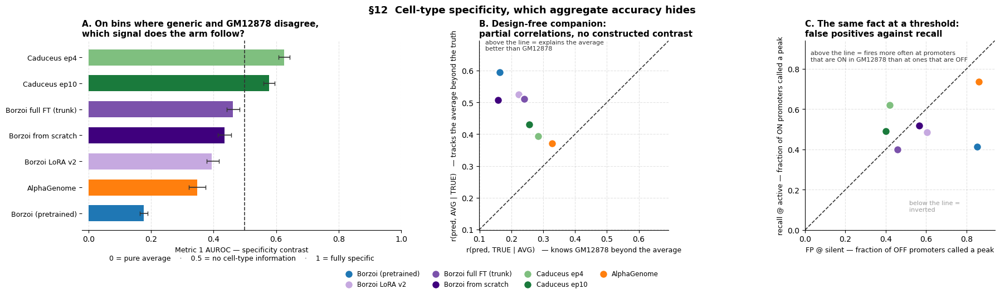

In [15]:
# §12 - cell-type specificity: an adversarial contrast and a design-free companion.
# The comparing_model4 §20 analysis on this grid. Depends on §1 for preds / TRUE /
# AVG_LOO / allowed / KEYS / PRETTY / COLORS; DNase and the TSS mask are loaded here.
import sys

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

sys.path.insert(0, '/data1/lesliec/sarthak/caduceus')
from evals.plotting_utils import GeneAnnotation

S_ACTIVE, S_SILENT, S_TSSPAD = 0.50, 0.05, 500      # §1.5: 50 reads real, <5 reads noise

# --- DNase on the fold3 grid, with the row-order and tracking checks -----------------
S_DN = np.load(f'{BORZOI}/GM12878DNase.npz')['test'][:, :, 0]
assert S_DN.shape == (N_REG, N_BIN), f'DNase is {S_DN.shape}, expected {(N_REG, N_BIN)}'
_wi = pd.read_csv(f'{BORZOI}/GM12878_borzoi_window_index.tsv', sep='\t', dtype={'chrom': str})
_wt = _wi[_wi.npz_split == 'test'].reset_index(drop=True)
assert len(_wt) == N_REG and (_wt.start.to_numpy() == test_bed.start.to_numpy()).all() \
    and (_wt.chrom.astype(str).to_numpy() == test_bed.chrom.astype(str).to_numpy()).all(), \
    'GATE FAILED: the DNase npz row order is not the bed fold3 row order'
_r_ok = pearsonr(np.log1p(S_DN[:1200]).ravel(), np.log1p(TRUE['plus'][:1200]).ravel())[0]
_perm = np.random.default_rng(0).permutation(1200)
_r_ctl = pearsonr(np.log1p(S_DN[_perm]).ravel(), np.log1p(TRUE['plus'][:1200]).ravel())[0]
assert _r_ok > 0.15 and _r_ok > 5 * abs(_r_ctl), 'DNase does not track CAGE'
print(f'DNase gate: row order matches fold3; DNase vs CAGE(+) r={_r_ok:+.3f}, '
      f'region-shuffled control r={_r_ctl:+.3f}')

# --- strand-matched protein-coding TSS mask on the 32 bp grid ------------------------
_pc = GeneAnnotation(gene_types=('protein_coding',)).df
_pc = _pc[_pc['feature'] == 'transcript']
_ctr = (test_bed.start.to_numpy().astype(np.int64)[:, None]
        + np.arange(N_BIN)[None, :] * BIN_BP + BIN_BP // 2)
_chr = test_bed.chrom.to_numpy().astype(str)
S_TSS = {}
for _s, _st in zip(STRANDS, ('+', '-')):
    _d = {}
    for _ch, _g in _pc[_pc['strand'] == _st].groupby('chrom'):
        _p = np.where(_st == '+', _g['start0'].to_numpy(), _g['end0'].to_numpy())
        _d[str(_ch)] = np.sort(_p)
    _m = np.zeros((N_REG, N_BIN), bool)
    for _ch in np.unique(_chr):
        _arr = _d.get(_ch)
        if _arr is None or _arr.size == 0:
            continue
        _rows = np.flatnonzero(_chr == _ch)
        _c = _ctr[_rows]
        _i = np.searchsorted(_arr, _c)
        _lo = _arr[np.clip(_i - 1, 0, _arr.size - 1)]
        _hi = _arr[np.clip(_i, 0, _arr.size - 1)]
        _m[_rows] = np.minimum(np.abs(_c - _lo), np.abs(_c - _hi)) <= S_TSSPAD
    S_TSS[_s] = _m
    print(f'  {_s}: {_m[allowed].mean():.2%} of allowed bins within {S_TSSPAD} bp '
          f'of a {_st} protein-coding TSS')

# --- pool the two strands into one sample axis ---------------------------------------
_flat = lambda d: np.concatenate([d[s].ravel() for s in STRANDS])
S_TV = _flat(TRUE)
S_AV = _flat(AVG_LOO)
S_TS = _flat(S_TSS)
S_A = np.concatenate([np.repeat(allowed, N_BIN)] * 2)
S_DNF = np.concatenate([S_DN.ravel()] * 2)                 # DNase is unstranded
S_RID = np.concatenate([np.repeat(np.arange(N_REG), N_BIN)] * 2)
S_OPEN = float(np.percentile(S_DNF[S_A], 95))
_hi_avg = S_AV >= np.percentile(S_AV[S_A & S_TS], 90)
_lo_avg = S_AV < np.percentile(S_AV[S_A & S_TS], 50)
S_POS = S_A & S_TS & _lo_avg & (S_TV >= S_ACTIVE) & (S_DNF >= S_OPEN)
S_NEG = S_A & S_TS & _hi_avg & (S_TV < S_SILENT) & (S_DNF < S_OPEN)
print(f'\n"open" = DNase >= p95 of allowed bins = {S_OPEN:.3f}')
print(f'positives (active pc promoter, low AVG_LOO, DNase-open):  {S_POS.sum():,}')
print(f'negatives (broadly-active pc promoter, silent + closed):  {S_NEG.sum():,}')


def s_auroc(pos, neg):
    """P(a random positive outranks a random negative). Ranking only -- scale-free."""
    a = np.concatenate([pos, neg])
    r = pd.Series(a).rank().to_numpy()
    n1, n0 = len(pos), len(neg)
    return (r[:n1].sum() - n1 * (n1 + 1) / 2) / (n1 * n0)


def s_group(mask):
    """Bin indices ordered by region, plus per-region slices -- makes the bootstrap cheap."""
    idx = np.flatnonzero(mask)
    r = S_RID[idx]
    o = np.argsort(r, kind='stable')
    idx = idx[o]; r = r[o]
    regs, starts = np.unique(r, return_index=True)
    return idx, list(zip(starts, np.append(starts[1:], len(idx)))), regs


S_PI, S_PS, S_PR = s_group(S_POS)
S_NI, S_NS, S_NR = s_group(S_NEG)
S_RNG = np.random.default_rng(0)


def s_draw(v, idx, sl, regs):
    pick = S_RNG.integers(0, len(regs), len(regs))
    return np.concatenate([v[idx[sl[k][0]:sl[k][1]]] for k in pick])


# --- Metric 2 inputs: partial correlations over a sample of the active bins ----------
_L = lambda x: np.log1p(np.clip(x, 0, None))
_pool = np.flatnonzero(S_A & (S_TV >= S_ACTIVE))
S_SUB = S_RNG.choice(_pool, min(300_000, len(_pool)), replace=False)
_yt, _ya = _L(S_TV[S_SUB]), _L(S_AV[S_SUB])
S_RTA = float(np.corrcoef(_yt, _ya)[0, 1])
print(f'\nr(TRUE, AVG_LOO) = {S_RTA:.3f} over {len(S_SUB):,} sampled active bins')
print('   -> a pure average-predictor already captures most of the available correlation.\n')

S_ROWS = []
for _k in KEYS + ['__avg__']:
    _null = _k == '__avg__'
    label = '[null] cross-CT average (LOO)' if _null else PRETTY[_k]
    pv = S_AV if _null else np.concatenate([preds[_k][s].ravel() for s in STRANDS])
    a0 = s_auroc(pv[S_PI], pv[S_NI])
    bo = [s_auroc(s_draw(pv, S_PI, S_PS, S_PR), s_draw(pv, S_NI, S_NS, S_NR))
          for _ in range(200)]
    lo, hi = np.percentile(bo, [2.5, 97.5])
    yp = _L(pv[S_SUB])
    r_pt = float(np.corrcoef(yp, _yt)[0, 1])
    r_pa = float(np.corrcoef(yp, _ya)[0, 1])
    d1 = np.sqrt(max((1 - r_pa ** 2) * (1 - S_RTA ** 2), 1e-12))
    d2 = np.sqrt(max((1 - r_pt ** 2) * (1 - S_RTA ** 2), 1e-12))
    pt_a = (r_pt - r_pa * S_RTA) / d1
    pa_t = (r_pa - r_pt * S_RTA) / d2
    thr = float(np.percentile(pv[S_A][::7], 95))
    S_ROWS.append(dict(key=_k, model=label, auroc=a0, lo=lo, hi=hi, pt_a=pt_a, pa_t=pa_t,
                       index=pt_a - pa_t, fp=np.mean(pv[S_NI] >= thr),
                       recall=np.mean(pv[S_PI] >= thr)))
    del pv

print('METRIC 1 - specificity contrast   |  1.0 = cell-type-specific, 0.5 = no info, '
      '0.0 = pure average')
print(f"{'arm':<32}{'AUROC':>8}{'95% CI':>20}{'FP@silent':>11}{'recall@active':>15}")
for r in S_ROWS:
    ci = '[{:.3f}, {:.3f}]'.format(r['lo'], r['hi'])
    print(f'{r["model"]:<32}{r["auroc"]:>8.3f}{ci:>20}{r["fp"]:>11.1%}{r["recall"]:>15.1%}')

print('\nMETRIC 2 - design-free partial correlations   (no labels, thresholds or DNase)')
print(f"{'arm':<32}{'r(pred,TRUE|AVG)':>18}{'r(pred,AVG|TRUE)':>18}{'index':>9}")
for r in S_ROWS:
    print(f'{r["model"]:<32}{r["pt_a"]:>18.3f}{r["pa_t"]:>18.3f}{r["index"]:>9.3f}')
print('   index = r(pred,TRUE|AVG) - r(pred,AVG|TRUE);  < 0 means the arm explains the')
print('   cross-cell-type average better than it explains GM12878.')

# --- figure --------------------------------------------------------------------------
# Identity is carried by one figure-level legend serving all panels, never by colour alone;
# colours are the ones each arm already wears elsewhere in this notebook.
_plot = [r for r in S_ROWS if not r['model'].startswith('[null]')]
_order = sorted(_plot, key=lambda r: r['auroc'])
fig, axes = plt.subplots(1, 3, figsize=(19, 5.2), layout='constrained')

ax = axes[0]
_y = np.arange(len(_order))
ax.barh(_y, [r['auroc'] for r in _order], height=0.62,
        color=[COLORS[r['key']] for r in _order], edgecolor='none')
ax.errorbar([r['auroc'] for r in _order], _y,
            xerr=[[r['auroc'] - r['lo'] for r in _order],
                  [r['hi'] - r['auroc'] for r in _order]],
            fmt='none', ecolor='#333333', elinewidth=1.2, capsize=3)
ax.axvline(0.5, color='#333333', ls='--', lw=1.2)
ax.set_yticks(_y)
ax.set_yticklabels([r['model'] for r in _order], fontsize=9)
ax.set_xlim(-0.02, 1.0)
ax.set_xlabel('Metric 1 AUROC — specificity contrast\n'
              '0 = pure average    ·    0.5 = no cell-type information'
              '    ·    1 = fully specific', fontsize=9)
ax.set_title('A. On bins where generic and GM12878 disagree,\n'
             'which signal does the arm follow?',
             fontsize=11, weight='bold', loc='left')
ax.grid(axis='x', ls='--', alpha=0.35)
ax.set_axisbelow(True)
for _s in ('top', 'right', 'left'):
    ax.spines[_s].set_visible(False)

ax = axes[1]
for r in _plot:
    ax.scatter(r['pt_a'], r['pa_t'], s=110, color=COLORS[r['key']], edgecolor='white',
               linewidth=1.5, zorder=3, label=r['model'])
_l = min([r['pt_a'] for r in _plot] + [r['pa_t'] for r in _plot]) - 0.06
_h = max([r['pt_a'] for r in _plot] + [r['pa_t'] for r in _plot]) + 0.10
ax.plot([_l, _h], [_l, _h], color='#333333', ls='--', lw=1.2, zorder=1)
ax.text(_l + 0.02, _h - 0.03, 'above the line = explains the average\nbetter than GM12878',
        fontsize=8, color='#333333')
ax.set_xlim(_l, _h)
ax.set_ylim(_l, _h)
ax.set_box_aspect(1)
ax.set_xlabel('r(pred, TRUE | AVG)   — knows GM12878 beyond the average', fontsize=9)
ax.set_ylabel('r(pred, AVG | TRUE)   — tracks the average beyond the truth', fontsize=9)
ax.set_title('B. Design-free companion:\npartial correlations, no constructed contrast',
             fontsize=11, weight='bold', loc='left')
ax.grid(ls='--', alpha=0.35)
ax.set_axisbelow(True)
for _s in ('top', 'right'):
    ax.spines[_s].set_visible(False)

# C is A and B restated at a threshold: both rates are measured inside the same promoter
# pool with each arm's own p95, so "fires at silent" and "fires at active" are comparable.
ax = axes[2]
for r in _plot:
    ax.scatter(r['fp'], r['recall'], s=110, color=COLORS[r['key']], edgecolor='white',
               linewidth=1.5, zorder=3)
_m = max([r['fp'] for r in _plot] + [r['recall'] for r in _plot]) + 0.08
ax.plot([0, _m], [0, _m], color='#333333', ls='--', lw=1.2, zorder=1)
ax.text(_m * 0.03, _m * 0.95, 'above the line = fires more often at promoters\n'
        'that are ON in GM12878 than at ones that are OFF', fontsize=8, color='#333333',
        va='top')
ax.text(_m * 0.55, _m * 0.10, 'below the line =\ninverted', fontsize=8, color='#999999')
ax.set_xlim(0, _m)
ax.set_ylim(0, _m)
ax.set_box_aspect(1)
ax.set_xlabel('FP @ silent — fraction of OFF promoters called a peak', fontsize=9)
ax.set_ylabel('recall @ active — fraction of ON promoters called a peak', fontsize=9)
ax.set_title('C. The same fact at a threshold:\nfalse positives against recall',
             fontsize=11, weight='bold', loc='left')
ax.grid(ls='--', alpha=0.35)
ax.set_axisbelow(True)
for _s in ('top', 'right'):
    ax.spines[_s].set_visible(False)

_hd, _lb = axes[1].get_legend_handles_labels()
fig.legend(_hd, _lb, loc='outside lower center', ncol=4, fontsize=8.5, frameon=False,
           handletextpad=0.3, columnspacing=1.4)
fig.suptitle('§12  Cell-type specificity, which aggregate accuracy hides', fontsize=13,
             weight='bold')
plt.show()


## 12b. Accessibility as a predictor, not as a filter — and what that can and cannot show

§12 defines its two classes partly *using* DNase, which makes DNase a perfect predictor by
construction (AUROC 1.0) and therefore useless as a comparator. This section removes DNase from
the labels and puts it in the panel as a **method** instead, alongside the models:

```
positives = active pc promoter, cross-CT average LOW      (specific and real)
negatives = pc promoter broadly active elsewhere, silent  (looks active, is not)
```

Nothing else changes. `TRUE` and `AVG_LOO` still define the classes; DNase is now scored on them
like any other predictor, and the classes are larger because the open/closed requirement is gone.

### Why observed accessibility is expected to win, and why that alone proves little

DNase is **measured in GM12878**. The models predict from sequence. Both assays read out the same
underlying active-chromatin state in the same cells, so a high score for DNase is close to
tautological — it is a measurement being scored against another measurement of the same thing, not
a predictor competing with predictors. Reporting "accessibility beats the sequence models" on its
own is not an argument.

**The quantity that carries the argument is the margin between accessibility alone and a model that
takes accessibility as input.** Three cases, and only one of them supports the claim:

| observed | reading |
|---|---|
| accessibility-input model ≈ accessibility alone | the model is a **passthrough** — it reads out its input and the sequence contribution is ~0 |
| accessibility-input model **>** accessibility alone | sequence *and* chromatin together beat either — **this is the result worth claiming** |
| accessibility-input model < accessibility alone | the model is destroying information its input already contained |

So the row to read is not "accessibility is high" but "how far above accessibility does the
accessibility-using arm sit, and does a sequence-only arm of the same architecture sit below it".

### What the claim costs

Accessibility as an input is a real modelling trade, not a free win, and the limitation belongs
next to the result:

- a model needing measured accessibility **cannot predict in a cell type nobody has assayed**,
  which is most of the use case for a sequence-to-function model;
- **in-silico mutagenesis becomes ambiguous** — a variant acting through chromatin changes the
  input the model was handed, and the model cannot represent that;
- the honest framing is *"chromatin state supplies the cell-type information sequence alone cannot
  encode"* (§19's methylated MEG3 promoter is exactly such a case: identical sequence, different
  state), **not** *"our model predicts cell-type-specific expression"*.


positives (active pc promoter, low AVG_LOO):              7,490
negatives (broadly-active pc promoter, silent in GM12878): 25,779
   DNase-open rate: positives 38%, negatives 52%   <- now free to vary, not imposed



DNase removed from the labels, scored as a method   |  1.0 = cell-type-specific, 0.5 = no info, 0.0 = pure average
method                             AUROC              95% CI  FP@silent  recall@active
GM12878 DNase (measured)           0.389      [0.374, 0.404]      52.3%          38.0%
Caduceus ep4                       0.354      [0.340, 0.366]      58.2%          37.1%
Caduceus ep10                      0.329      [0.316, 0.340]      57.2%          29.4%
Borzoi full FT (trunk)             0.300      [0.287, 0.315]      57.7%          26.1%
Borzoi from scratch                0.238      [0.227, 0.250]      69.6%          31.1%
Borzoi LoRA v2                     0.231      [0.218, 0.245]      69.8%          30.2%
AlphaGenome                        0.179      [0.166, 0.194]      89.1%          50.0%
Borzoi (pretrained)                0.092      [0.084, 0.100]      88.5%          25.1%

   FP and recall use each method's OWN p95 over allowed bins, so the background
   rate is 5.0% for 

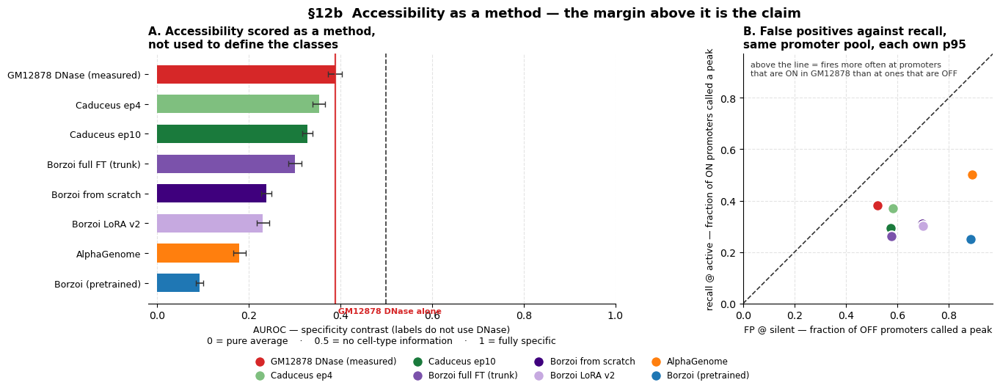

In [16]:
# §12b - the same contrast with DNase removed from the labels and added as a method.
# Depends on §12 above for preds, the target/average arrays, S_DNF, the promoter mask,
# and the s_auroc / s_group / s_draw helpers.
_tvA, _avA, _acA, _tsA = S_TV, S_AV, S_DNF, S_TS
_hi_avgA, _lo_avgA = _hi_avg, _lo_avg
A_PANEL = [(PRETTY[k], np.concatenate([preds[k][s].ravel() for s in STRANDS]))
           for k in KEYS] + [('GM12878 DNase (measured)', _acA)]
_A_COLS = {PRETTY[k]: COLORS[k] for k in KEYS}
A_ACC_COLOR = '#d62728'      # no model in this panel wears red
_A_COLS['GM12878 DNase (measured)'] = A_ACC_COLOR
A_COLOR = lambda m: _A_COLS[m]
ACCLABEL = 'GM12878 DNase'

# classes as before, minus the open/closed conditions -- DNase must not define what it is
# then scored on, or it wins by construction
A_POS = S_A & _tsA & _lo_avgA & (_tvA >= S_ACTIVE)
A_NEG = S_A & _tsA & _hi_avgA & (_tvA < S_SILENT)
print(f'positives (active pc promoter, low AVG_LOO):              {A_POS.sum():,}')
print(f'negatives (broadly-active pc promoter, silent in GM12878): {A_NEG.sum():,}')
print(f'   DNase-open rate: positives {np.mean(_acA[A_POS] >= S_OPEN):.0%}, '
      f'negatives {np.mean(_acA[A_NEG] >= S_OPEN):.0%}   <- now free to vary, not imposed')

A_PI, A_PS, A_PR = s_group(A_POS)
A_NI, A_NS, A_NR = s_group(A_NEG)
A_SUB = S_A & (_tvA >= S_ACTIVE)
_ytA, _yaA = _L(_tvA[A_SUB]), _L(_avA[A_SUB])
A_RTA = float(np.corrcoef(_ytA, _yaA)[0, 1])

A_ROWS = []
for label, pv in A_PANEL:
    a0 = s_auroc(pv[A_PI], pv[A_NI])
    bo = [s_auroc(s_draw(pv, A_PI, A_PS, A_PR), s_draw(pv, A_NI, A_NS, A_NR))
          for _ in range(200)]
    lo, hi = np.percentile(bo, [2.5, 97.5])
    yp = _L(pv[A_SUB])
    r_pt = float(np.corrcoef(yp, _ytA)[0, 1])
    r_pa = float(np.corrcoef(yp, _yaA)[0, 1])
    d1 = np.sqrt(max((1 - r_pa ** 2) * (1 - A_RTA ** 2), 1e-12))
    d2 = np.sqrt(max((1 - r_pt ** 2) * (1 - A_RTA ** 2), 1e-12))
    thr = float(np.percentile(pv[S_A], 95))
    A_ROWS.append(dict(model=label, auroc=a0, lo=lo, hi=hi,
                       pt_a=(r_pt - r_pa * A_RTA) / d1, pa_t=(r_pa - r_pt * A_RTA) / d2,
                       fp=np.mean(pv[A_NI] >= thr), recall=np.mean(pv[A_PI] >= thr)))
A_ROWS = sorted(A_ROWS, key=lambda r: -r['auroc'])

print(f'\nDNase removed from the labels, scored as a method   |  1.0 = cell-type-specific, '
      '0.5 = no info, 0.0 = pure average')
print(f"{'method':<32}{'AUROC':>8}{'95% CI':>20}{'FP@silent':>11}{'recall@active':>15}")
for r in A_ROWS:
    ci = '[{:.3f}, {:.3f}]'.format(r['lo'], r['hi'])
    print(f'{r["model"]:<32}{r["auroc"]:>8.3f}{ci:>20}{r["fp"]:>11.1%}{r["recall"]:>15.1%}')
print(f'\n   FP and recall use each method\'s OWN p95 over allowed bins, so the background')
print(f'   rate is 5.0% for every row by construction. A method is only doing something')
print(f'   real if recall@active exceeds FP@silent -- both are measured on promoters.')

_acc_row = next(r for r in A_ROWS if r['model'].startswith(ACCLABEL))
print(f'\n   {ACCLABEL} alone scores {_acc_row["auroc"]:.3f}. It is a MEASUREMENT of GM12878, '
      f'not a\n   sequence prediction, so it is expected to lead -- the informative quantity is')
print( '   the margin between it and any arm that takes accessibility as an input:')
for r in A_ROWS:
    if not r['model'].startswith(ACCLABEL):
        print(f'      {r["model"]:<32}{r["auroc"] - _acc_row["auroc"]:+.3f} vs {ACCLABEL}')

# --- figure ---------------------------------------------------------------------------
_ap = A_ROWS
_ao = sorted(_ap, key=lambda r: r['auroc'])
fig, axes = plt.subplots(1, 2, figsize=(15, 5.2), layout='constrained')

ax = axes[0]
_y = np.arange(len(_ao))
ax.barh(_y, [r['auroc'] for r in _ao], height=0.62,
        color=[A_COLOR(r['model']) for r in _ao], edgecolor='none')
ax.errorbar([r['auroc'] for r in _ao], _y,
            xerr=[[r['auroc'] - r['lo'] for r in _ao], [r['hi'] - r['auroc'] for r in _ao]],
            fmt='none', ecolor='#333333', elinewidth=1.2, capsize=3)
ax.axvline(0.5, color='#333333', ls='--', lw=1.2)
ax.axvline(_acc_row['auroc'], color=A_ACC_COLOR, ls='-', lw=1.6, alpha=0.9)
ax.text(_acc_row['auroc'], -0.95, f' {ACCLABEL} alone', fontsize=8,
        color=A_ACC_COLOR, va='center', weight='bold')
ax.set_yticks(_y)
ax.set_yticklabels([r['model'] for r in _ao], fontsize=9)
ax.set_xlim(-0.02, 1.0)
ax.set_xlabel('AUROC — specificity contrast (labels do not use DNase)\n'
              '0 = pure average    ·    0.5 = no cell-type information'
              '    ·    1 = fully specific', fontsize=9)
ax.set_title('A. Accessibility scored as a method,\nnot used to define the classes',
             fontsize=11, weight='bold', loc='left')
ax.grid(axis='x', ls='--', alpha=0.35)
ax.set_axisbelow(True)
for _s in ('top', 'right', 'left'):
    ax.spines[_s].set_visible(False)

ax = axes[1]
for r in _ap:
    ax.scatter(r['fp'], r['recall'], s=110, color=A_COLOR(r['model']), edgecolor='white',
               linewidth=1.5, zorder=3, label=r['model'])
_m = max([r['fp'] for r in _ap] + [r['recall'] for r in _ap]) + 0.08
ax.plot([0, _m], [0, _m], color='#333333', ls='--', lw=1.2, zorder=1)
ax.text(_m * 0.03, _m * 0.97, 'above the line = fires more often at promoters\n'
        'that are ON in GM12878 than at ones that are OFF', fontsize=8, color='#333333',
        va='top')
ax.set_xlim(0, _m)
ax.set_ylim(0, _m)
ax.set_box_aspect(1)
ax.set_xlabel('FP @ silent — fraction of OFF promoters called a peak', fontsize=9)
ax.set_ylabel('recall @ active — fraction of ON promoters called a peak', fontsize=9)
ax.set_title('B. False positives against recall,\nsame promoter pool, each own p95',
             fontsize=11, weight='bold', loc='left')
ax.grid(ls='--', alpha=0.35)
ax.set_axisbelow(True)
for _s in ('top', 'right'):
    ax.spines[_s].set_visible(False)

_hd, _lb = ax.get_legend_handles_labels()
fig.legend(_hd, _lb, loc='outside lower center', ncol=4, fontsize=8.5, frameon=False,
           handletextpad=0.3, columnspacing=1.4)
fig.suptitle('§12b  Accessibility as a method — the margin above it is the claim',
             fontsize=13, weight='bold')
plt.show()